# Preprocessing

Install and import all the necessary packages

In [1]:
#module for supressing warnings about future changes in Python:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.filterwarnings("ignore", category=DeprecationWarning)

#module sys helps install modules from inside Jupyter:
import sys

#module for handling regular expressions and special characters
import re

#Natural Language ToolKit
import nltk
from nltk.stem import WordNetLemmatizer
from nltk.corpus import wordnet as wn

#modules for handling unicode characters and strings
import unicodedata
import string
!{sys.executable} -m pip install pattern3
import pattern3


import numpy as np
import pandas as pd

from sklearn.model_selection import GridSearchCV
from sklearn.feature_extraction.text import  CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation

#pretty printing
from pprint import pprint

# Plotting tools
!{sys.executable} -m pip install pyLDAvis
import pyLDAvis
import pyLDAvis.sklearn
import matplotlib.pyplot as plt
%matplotlib inline

## Define functions to process the raw data

Blow we first define a list of functions that will be used in the pre-processing, then combine them in a specific order to one function, which will take the original text data as input and output a normalized corpus list.

Define function for lemmatization

In [2]:
wnl = WordNetLemmatizer()

C:\Users\HUAWEI\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Define the list of word contractions

In [3]:
contraction_mapping = {
"aint": "is not",
"arent": "are not",
"cant": "cannot",
"cantve": "cannot have",
"‘cause": "because",
"couldve": "could have",
"couldnt": "could not",
"couldntve": "could not have",
"didnt": "did not",
"doesnt": "does not",
"dont": "do not",
"hadnt": "had not",
"hadntve": "had not have",
"hasnt": "has not",
"havent": "have not",
"hed": "he would",
"hedve": "he would have",
"hell": "he will",
"hellve": "he he will have",
"hes": "he is",
"howd": "how did",
"howdy": "how do you",
"howll": "how will",
"hows": "how is",
"Id": "I would",
"Idve": "I would have",
"Ill": "I will",
"Illve": "I will have",
"Im": "I am",
"Ive": "I have",
"id": "i would",
"idve": "i would have",
"ill": "i will",
"illve": "i will have",
"im": "i am",
"ive": "i have",
"isnt": "is not",
"itd": "it would",
"itdve": "it would have",
"itll": "it will",
"itllve": "it will have",
"its": "it is",
"lets": "let us",
"maam": "madam",
"maynt": "may not",
"mightve": "might have",
"mightnt": "might not",
"mightntve": "might not have",
"mustve": "must have",
"mustnt": "must not",
"mustntve": "must not have",
"neednt": "need not",
"needntve": "need not have",
"oclock": "of the clock",
"oughtnt": "ought not",
"oughtntve": "ought not have",
"shant": "shall not",
"shant": "shall not",
"shantve": "shall not have",
"shed": "she would",
"shedve": "she would have",
"shell": "she will",
"shellve": "she will have",
"shes": "she is",
"shouldve": "should have",
"shouldnt": "should not",
"shouldntve": "should not have",
"sove": "so have",
"sos": "so as",
"thatd": "that would",
"thatdve": "that would have",
"thats": "that is",
"thered": "there would",
"theredve": "there would have",
"theres": "there is",
"theyd": "they would",
"theydve": "they would have",
"theyll": "they will",
"theyllve": "they will have",
"theyre": "they are",
"theyve": "they have",
"tove": "to have",
"wasnt": "was not",
"wed": "we would",
"wedve": "we would have",
"well": "we will",
"wellve": "we will have",
"were": "we are",
"weve": "we have",
"werent": "were not",
"whatll": "what will",
"whatllve": "what will have",
"whatre": "what are",
"whats": "what is",
"whatve": "what have",
"whens": "when is",
"whenve": "when have",
"whered": "where did",
"wheres": "where is",
"whereve": "where have",
"wholl": "who will",
"whollve": "who will have",
"whos": "who is",
"whove": "who have",
"whys": "why is",
"whyve": "why have",
"willve": "will have",
"wont": "will not",
"wontve": "will not have",
"wouldve": "would have",
"wouldnt": "would not",
"wouldntve": "would not have",
"yall": "you all",
"yalld": "you all would",
"yalldve": "you all would have",
"yallre": "you all are",
"yallve": "you all have",
"youd": "you would",
"youdve": "you would have",
"youll": "you will",
"youllve": "you will have",
"youre": "you are",
"youve": "you have"
}

C:\Users\HUAWEI\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Select the list of stopwords from NLTK

In [4]:
from nltk.corpus import stopwords
nltk.download('stopwords')
stopword_list = nltk.corpus.stopwords.words('english')

C:\Users\HUAWEI\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\HUAWEI\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Split text into word tokens:

In [6]:
nltk.download('punkt')

def tokenize_text(text):
    tokens = nltk.word_tokenize(text) 
    tokens = [token.strip() for token in tokens]
    return tokens

C:\Users\HUAWEI\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\HUAWEI\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


Expand contractions

In [7]:
def expand_contractions(text, contraction_mapping):
    text = text.split(' ')
    for index, word in enumerate(text):
        if word in contraction_mapping.keys():
            word = contraction_mapping[word]
            text[index] = word
    sen = ''
    for word in text:
        sen += word
        sen += ' '
    return(sen.strip())

C:\Users\HUAWEI\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Annotate text tokens with Part-Of-Speach tags:

In [8]:
nltk.download('averaged_perceptron_tagger')
nltk.download('wordnet')

def pos_tag_text(text_tokens):
    def penn_to_wn_tags(pos_tag):
        if pos_tag.startswith('J'):
            return wn.ADJ
        elif pos_tag.startswith('V'):
            return wn.VERB
        elif pos_tag.startswith('N'):
            return wn.NOUN
        elif pos_tag.startswith('R'):
            return wn.ADV
        else:
            return None  
    tagged_text = nltk.pos_tag(text_tokens)
    tagged_lower_text = [(word.lower(), penn_to_wn_tags(pos_tag))
                         for word, pos_tag in
                         tagged_text]
    return tagged_lower_text

C:\Users\HUAWEI\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\HUAWEI\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\HUAWEI\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


Lemmatize text based on Part-Of-Speach (POS) tags:

In [9]:
def lemmatize_text(text):
    pos_tagged_text = pos_tag_text(text)
    lemmatized_tokens = [wnl.lemmatize(word, pos_tag) if pos_tag
                         else word                     
                         for word, pos_tag in pos_tagged_text]
    lemmatized_text = ' '.join(lemmatized_tokens)
    return lemmatized_text

C:\Users\HUAWEI\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Remove special characters, such as punctuation marks:

In [10]:
def remove_special_characters(text):
    tokens = tokenize_text(text)
    pattern = re.compile('[{}]'.format(re.escape(string.punctuation)))
    filtered_tokens = filter(None, [pattern.sub(' ', token) for token in tokens])
    filtered_text = ' '.join(filtered_tokens)
    return filtered_text 

C:\Users\HUAWEI\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Get rid of stopwords:

In [11]:
def remove_stopwords(text):
    tokens = tokenize_text(text)
    filtered_tokens = [token for token in tokens if token not in stopword_list]
    filtered_text = ' '.join(filtered_tokens)    
    return filtered_text

C:\Users\HUAWEI\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Remove all non-text characters (numbers, etc.):

In [12]:
def keep_text_characters(text):
    filtered_tokens = []
    tokens = tokenize_text(text)
    for token in tokens:
        if re.search('[a-zA-Z]', token):
            filtered_tokens.append(token)
    filtered_text = ' '.join(filtered_tokens)
    return filtered_text

C:\Users\HUAWEI\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Clean up HTML markups:

In [13]:
def strip_html(text):
    url_re = re.compile(r'https?:\/\/(www\.)?[-a-zA-Z0-9@:%._\+~#=]{1,256}\.[a-zA-Z0-9()]{1,6}\b([-a-zA-Z0-9()@:%_\+.~#?&//=]*)', re.IGNORECASE)
    clean_text = re.sub(url_re, '', text)
    return(clean_text)

C:\Users\HUAWEI\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Removing accents from characters:

In [14]:
def normalize_accented_characters(text):
    text = unicodedata.normalize('NFKD', text).encode('ascii', 'ignore').decode('utf8')
    return text

C:\Users\HUAWEI\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Removing hashtags, @, $, etc.

In [15]:
def strip_all_entities(text):
    entity_prefixes = ['@','#', '$']
    for separator in  string.punctuation:
        if separator not in entity_prefixes :
            text = text.replace(separator,' ')
    words = []
    for word in text.split():
        word = word.strip()
        if word:
            if word[0] not in entity_prefixes:
                words.append(word)
    return ' '.join(words)

C:\Users\HUAWEI\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Removing emojis

In [16]:
def remove_emojis(data):
    emoj = re.compile("["
        u"\U0001F600-\U0001F64F"  # emoticons
        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # transport & map symbols
        u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
        u"\U00002500-\U00002BEF"  # chinese char
        u"\U00002702-\U000027B0"
        u"\U00002702-\U000027B0"
        u"\U000024C2-\U0001F251"
        u"\U0001f926-\U0001f937"
        u"\U00010000-\U0010ffff"
        u"\u2640-\u2642" 
        u"\u2600-\u2B55"
        u"\u200d"
        u"\u23cf"
        u"\u23e9"
        u"\u231a"
        u"\ufe0f"  # dingbats
        u"\u3030"
                      "]+", re.UNICODE)
    return re.sub(emoj, '', data)

C:\Users\HUAWEI\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Putting all functions together:
We deal with the data by first removing accents, url links, unuseful entities like hashtags, emojis, then expanding contractions, tokenizing and lemmatizing the text, and finally removing special characters and stop words.

In [17]:
def normalize_corpus(corpus, only_text_chars=True):
    normalized_corpus = []  
    for index, text in enumerate(corpus):
        text = normalize_accented_characters(text)
        # remove url
        text = strip_html(text)
        # remove hashtags, @, $
        text = strip_all_entities(text)
        # remove emojis
        text = remove_emojis(text)
        # expand contractions
        text = expand_contractions(text, contraction_mapping)
        # Tokenize
        text = tokenize_text(text)
        # Lemmatization
        text = lemmatize_text(text)
        # Remove special characters
        text = remove_special_characters(text)
        # Remove stop words
        text = remove_stopwords(text)
        text = keep_text_characters(text)
        if only_text_chars:
            text = keep_text_characters(text)
        #text = tokenize_text(text)
        normalized_corpus.append(text)    
    return normalized_corpus

C:\Users\HUAWEI\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


## Import Dataset

In [18]:
# path of the folder storing the dataset
path = "E:/Jupyter/Text Mining/Final/"

C:\Users\HUAWEI\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [19]:
# Importing data
data = pd.read_csv(path + "vaccination_all_tweets.csv")

C:\Users\HUAWEI\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [20]:
# Convert to a data frame
data = pd.DataFrame(data)
data.head()

C:\Users\HUAWEI\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,id,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,retweets,favorites,is_retweet
0,1340539111971516416,Rachel Roh,"La Crescenta-Montrose, CA",Aggregator of Asian American news; scanning di...,2009-04-08 17:52:46,405,1692,3247,False,2020-12-20 06:06:44,Same folks said daikon paste could treat a cyt...,['PfizerBioNTech'],Twitter for Android,0,0,False
1,1338158543359250433,Albert Fong,"San Francisco, CA","Marketing dude, tech geek, heavy metal & '80s ...",2009-09-21 15:27:30,834,666,178,False,2020-12-13 16:27:13,While the world has been on the wrong side of ...,NaN,Twitter Web App,1,1,False
2,1337858199140118533,eli🇱🇹🇪🇺👌,Your Bed,"heil, hydra 🖐☺",2020-06-25 23:30:28,10,88,155,False,2020-12-12 20:33:45,#coronavirus #SputnikV #AstraZeneca #PfizerBio...,"['coronavirus', 'SputnikV', 'AstraZeneca', 'Pf...",Twitter for Android,0,0,False
3,1337855739918835717,Charles Adler,"Vancouver, BC - Canada","Hosting ""CharlesAdlerTonight"" Global News Radi...",2008-09-10 11:28:53,49165,3933,21853,True,2020-12-12 20:23:59,"Facts are immutable, Senator, even when you're...",NaN,Twitter Web App,446,2129,False
4,1337854064604966912,Citizen News Channel,NaN,Citizen News Channel bringing you an alternati...,2020-04-23 17:58:42,152,580,1473,False,2020-12-12 20:17:19,Explain to me again why we need a vaccine @Bor...,"['whereareallthesickpeople', 'PfizerBioNTech']",Twitter for iPhone,0,0,False


### Removing duplicated values

There are some duplicated tweets in the dataset and here we will remove them.

In [21]:
# Check the number of duplicated values (same user posting same content)
data.duplicated(subset=['user_name', 'text']).sum()

C:\Users\HUAWEI\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


1619

In [22]:
# Keep only the first row of the duplicated values
data = data[-data.duplicated(subset=['user_name', 'text'], keep='first')]

C:\Users\HUAWEI\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


### Removing users who posted more than 50 tweets about vaccines

As we mentioned in the report, users who posted more than 50 tweets are normally official accounts who posted things that have no value to our analysis purpose. Therefore, we will remove those users.

In [23]:
# No of tweets every user post
no_of_tweets_per_user = pd.DataFrame(data['user_name'].value_counts())
no_of_tweets_per_user.rename(columns={"user_name":"no_tweets"}, inplace=True)

# users who post at most 50 tweets
users_less_than_50 = no_of_tweets_per_user[no_of_tweets_per_user['no_tweets']<=50].reset_index()['index'].tolist()

data_less_than_50 = data[['user_name','date','text']].set_index('user_name', drop=True, inplace=False).loc[users_less_than_50,].reset_index()
data_less_than_50.head()

C:\Users\HUAWEI\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,user_name,date,text
0,Amy,2021-03-15 16:08:02,First vaccine done!! 🙌 #COVID19 #vaccination #...
1,Amy,2021-03-30 14:46:18,Everyone: I’m booking my vaccine on a Friday s...
2,Amy,2021-04-14 22:46:56,“The levels of mucosal (IgA) antibodies were h...
3,Amy,2021-04-12 14:19:28,On my second day post Moderna shot #1. My arm ...
4,Amy,2021-04-18 15:04:24,Got me a shot of Moderna 😄\n#moderna #COVID19V...


### Normalizing the text

Now we use the function we defined before to convert the text to a clean corpus.

In [24]:
# Normalize the text
normalized_text = normalize_corpus(np.array(data_less_than_50['text']))
normalized_text

C:\Users\HUAWEI\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


['first vaccine',
 'everyone book vaccine friday side effect rest slot monday',
 'level mucosal iga antibodies high second dose moderna compare second dose',
 'second day post moderna shot arm feel like someone punch receive shot b',
 'got shot moderna side effect',
 'dad unexpectedly pass away two week ago know would celebrate today could',
 'get loser get vaccinate',
 'vaccine longer shelf life fda',
 'look like drive mexico get best vaccine fda seems corrupt wi',
 'problem solution fda',
 'vaccine approve age group',
 'zoom past month move even start yet short cover new',
 'isnt point vaccine get virus illness vaccinate people get sick',
 'moderna gang long side effect last second dose today currently feel like run',
 'know go need vaccine beat covid specially since ppl want',
 'vaccine mrna mandate give clean vaccine',
 'fact effective delta traditional side effect placebo',
 'ide love hear thought fda big pharma block amaze vaccine like',
 'fully approve fine get mrna let us see f

In [30]:
data_less_than_50['normalized_text'] = normalized_text
data_less_than_50.drop(columns=['text'], inplace=True)
data_less_than_50.head()

C:\Users\HUAWEI\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,user_name,date,normalized_text
0,Amy,2021-03-15 16:08:02,first vaccine
1,Amy,2021-03-30 14:46:18,everyone book vaccine friday side effect rest ...
2,Amy,2021-04-14 22:46:56,level mucosal iga antibodies high second dose ...
3,Amy,2021-04-12 14:19:28,second day post moderna shot arm feel like som...
4,Amy,2021-04-18 15:04:24,got shot moderna side effect


# Sentiment Analysis

## AFINN

We choose AFINN lexicon because it was originally created for sentiment analysis in microblogs (such as Twitter).

In [32]:
# Install the package
# !{sys.executable} -m pip install afinn
from afinn import Afinn

C:\Users\HUAWEI\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


### Assign each tweet a sentiment label (neutral, positive, negative)

In [33]:
afn = Afinn()

# compute scores (polarity) and labels
scores = [afn.score(sen) for sen in normalized_text]
# If the afn score is larger than 0, then we classify the tweet as positive, and 0 as neutral, <0 as negative
sentiment = ['positive' if score > 0 
                          else 'negative' if score < 0 
                              else 'neutral' 
                                  for score in scores]
      
# dataframe creation
df = pd.DataFrame()
df['text'] =  normalized_text
df['scores'] = scores
df['sentiments'] = sentiment
df.head()

C:\Users\HUAWEI\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,text,scores,sentiments
0,first vaccine,0.0,neutral
1,everyone book vaccine friday side effect rest ...,0.0,neutral
2,level mucosal iga antibodies high second dose ...,0.0,neutral
3,second day post moderna shot arm feel like som...,2.0,positive
4,got shot moderna side effect,0.0,neutral


#### Positive comments that are just above threshold

In order to see whether the threshold is reasonable, we print out comments that are just above the positive threshold to see whether they look positive.

In [34]:
df[df['scores']==1]['text'].to_list()

C:\Users\HUAWEI\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


['know go need vaccine beat covid specially since ppl want',
 'open huge door',
 'instead talk vaccine talk safest vaccine big ph',
 'product specific group one else people understand capability',
 'vaccine equality something stand choose want one',
 'let keep go friend',
 'key vaccine stop transmission fda still approve like',
 'wait united sates wait eua child day',
 'one dose effective prevent covid cdc study health worker',
 'russia vaccination campaign fall far behind european nation united state',
 'guess need promote abroad authenticate claim pharmacy hub wor',
 'could please give coverage medium ignore vaccine due big pharma p',
 'add u fda amp health canada list promote mrna synthetic vaccine kno',
 'fda would probably lose advertisement revenue big pharma',
 'sputnik v dose reach sri lanka next week read',
 'million sinopharm vaccine reach island read',
 'one million dos chinese sinopharm vaccine reach island read',
 'million dos covid vaccine reach sri lanka friday covax fac

We also print out the tweets with the highest positive and negative scores, as well as those that are classified as neutral to see if they make sense.

#### Comments with the highest positive scores

In [36]:
df.sort_values(by='scores', ascending=False).head()['text'].to_list()

C:\Users\HUAWEI\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


['superb work super effective affordable price high quality side effect amazing',
 'lab tx wow thank hard work wonderful gift human kind awesome',
 'safe effective safe effective safe effective safe effective safe effective safe effec',
 'good luck success love life business wear happy smile golden mo',
 'god bless holy victory triumph justice god bless president people want li']

#### Comments with the highest negative scores

In [37]:
df.sort_values(by='scores', ascending=True).head()['text'].to_list()

C:\Users\HUAWEI\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


['fuck fuck fuck fuck damn government tx seek nod',
 'terrible terrible terrible week long side effect 2nd shot bastard fu king liar',
 'fuck 2nd doze delhi fuck get panic attack anxiety attack high blood pr',
 'law negligence fraud conspiracy assault battery coercion threat intimidation apply',
 'feel rather shit covid jab today body ache bad headache fatigue general flu like symptom h']

#### Neutral comments

In [38]:
df[df['scores']==0]['text'].to_list()

C:\Users\HUAWEI\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


['first vaccine',
 'everyone book vaccine friday side effect rest slot monday',
 'level mucosal iga antibodies high second dose moderna compare second dose',
 'got shot moderna side effect',
 'vaccine longer shelf life fda',
 'vaccine approve age group',
 'zoom past month move even start yet short cover new',
 'fda receive application eua vaccine child age science give us',
 'thing company able vaccinate kid export entire world',
 'think option like people would hesitant',
 'think vaccine revolution hand',
 'want put end vaccine subscription cash cow stop covid whe',
 'exactly let us ask question vaccine work well',
 'one news',
 'latest fda authorize change new vial moderna contain',
 'germany start talk buy russia vaccine eu executive sign advance pur',
 'putin get coronavirus vaccine behind closed door kremlin spokesman also say type vacc',
 'seychelles world vaccinated nation see renewed covid surge country experience lar',
 'bahrain face covid surge start give recipient chinese re

The sentiment analysis result looks reasonable. The tweets were classified nicely to positive, neutral, and negative.

### Result visualization

C:\Users\HUAWEI\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


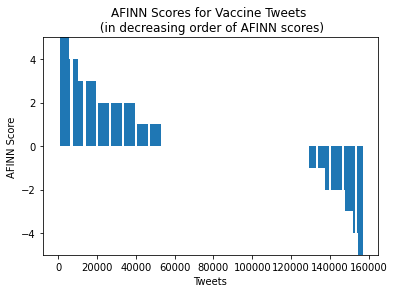

In [39]:
import matplotlib.pyplot as plt

pos_reviews_scored = df['scores']
plt.bar(range(0, len(df['scores'])),pos_reviews_scored.sort_values(ascending=False))
plt.ylim(-5,5)
plt.xlabel("Tweets")
plt.ylabel("AFINN Score")
plt.title("AFINN Scores for Vaccine Tweets \n (in decreasing order of AFINN scores)")
plt.show()

How many tweets are there in each of the sentiment class:

In [40]:
df['sentiments'].value_counts()

C:\Users\HUAWEI\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


neutral     75362
positive    53749
negative    27660
Name: sentiments, dtype: int64

Proportion of each sentiment class:

C:\Users\HUAWEI\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


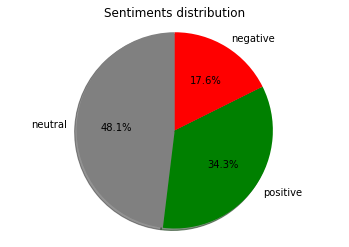

In [41]:
# Pie chart, where the slices will be ordered and plotted counter-clockwise:
labels = ['neutral', 'positive', 'negative']
sizes = df['sentiments'].value_counts().to_list()
colors = ['grey', 'green', 'red']

fig1, ax1 = plt.subplots()
ax1.pie(sizes, labels=labels, colors = colors, autopct='%1.1f%%',
        shadow=True, startangle=90)
ax1.axis('equal')

plt.title("Sentiments distribution")
plt.show()

### Monthly sentiment trend

Here we explore the change in people's attitudes toward vaccines every month.

In [43]:
# Extract the month and the date from the data
data_less_than_50['date'] = pd.to_datetime(data_less_than_50['date'])
data_less_than_50['month'] = data_less_than_50.date.dt.to_period('M')
data_less_than_50['day'] = data_less_than_50.date.dt.to_period('D')

C:\Users\HUAWEI\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [71]:
data_less_than_50.head()

C:\Users\HUAWEI\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,user_name,date,normalized_text,month,day
0,Amy,2021-03-15 16:08:02,first vaccine,2021-03,2021-03-15
1,Amy,2021-03-30 14:46:18,everyone book vaccine friday side effect rest ...,2021-03,2021-03-30
2,Amy,2021-04-14 22:46:56,level mucosal iga antibodies high second dose ...,2021-04,2021-04-14
3,Amy,2021-04-12 14:19:28,second day post moderna shot arm feel like som...,2021-04,2021-04-12
4,Amy,2021-04-18 15:04:24,got shot moderna side effect,2021-04,2021-04-18


In [72]:
# Group the data by months
data_monthly = (
    data_less_than_50.
    groupby('month').
    apply(lambda x:np.array(x.normalized_text)).
    reset_index(name ='Total text'))

C:\Users\HUAWEI\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [73]:
data_monthly.head()

C:\Users\HUAWEI\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,month,Total text
0,2020-12,[real news tiffany p dover old pic sell new on...
1,2021-01,[israel already inject pfizer biontech vaccine...
2,2021-02,[fda data show single shot percent effective t...
3,2021-03,"[first vaccine, everyone book vaccine friday s..."
4,2021-04,[level mucosal iga antibodies high second dose...


In [74]:
data_monthly.loc[0, 'Total text']

C:\Users\HUAWEI\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


array(['real news tiffany p dover old pic sell new one fb account cancel today',
       'one news',
       'vaccine go communication nightmare due rush government pressure rel',
       ..., 'imagine pizzeria liable damage get pie poison damage',
       'systemic report within day injection dose data',
       'happy moment wife texting vaccinate covid'], dtype=object)

Sentiment analysis for tweets in each month

In [75]:
data_monthly['score'] = data_monthly.apply(lambda row:[afn.score(sen) for sen in row['Total text']], axis=1)
    #([afn.score(sen) for sen in row['text']])
data_monthly['positive'] = data_monthly.apply(lambda row:sum( i>0 for i in row.score),axis=1)
data_monthly['neutral'] = data_monthly.apply(lambda row:sum( i==0 for i in row.score),axis=1)
data_monthly['negative'] = data_monthly.apply(lambda row:sum( i<0 for i in row.score),axis=1)
data_monthly['positive_score'] = data_monthly.apply(lambda row:sum( (i+abs(i))/2 for i in row.score),axis=1)
data_monthly['negative_score'] = data_monthly.apply(lambda row:sum( (i-abs(i))/2 for i in row.score),axis=1)
data_monthly.head()

C:\Users\HUAWEI\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,month,Total text,score,positive,neutral,negative,positive_score,negative_score
0,2020-12,[real news tiffany p dover old pic sell new on...,"[-1.0, 0.0, -1.0, 0.0, 1.0, 0.0, 0.0, 1.0, 3.0...",638,918,273,1752.0,-603.0
1,2021-01,[israel already inject pfizer biontech vaccine...,"[0.0, 0.0, -1.0, -2.0, -3.0, -4.0, -2.0, 1.0, ...",1071,1184,642,3089.0,-1492.0
2,2021-02,[fda data show single shot percent effective t...,"[2.0, 2.0, 5.0, -1.0, 6.0, 4.0, -2.0, 2.0, -1....",3109,4057,1560,8121.0,-3659.0
3,2021-03,"[first vaccine, everyone book vaccine friday s...","[0.0, 0.0, 1.0, 2.0, 0.0, -1.0, -2.0, -3.0, 4....",8398,11076,4044,22520.0,-9696.0
4,2021-04,[level mucosal iga antibodies high second dose...,"[0.0, 2.0, 0.0, 3.0, -4.0, 2.0, 0.0, 2.0, 1.0,...",7731,10589,4333,19901.0,-10242.0


Output the data to do visualization in Tableau

In [76]:
data_monthly.to_csv('afinn_monthly.csv',index = False)

C:\Users\HUAWEI\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


## NRC

In [77]:
# Install the package
!{sys.executable} -m pip install NRCLex
!{sys.executable} -m textblob.download_corpora
from nrclex import NRCLex

C:\Users\HUAWEI\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Finished.


[nltk_data] Downloading package brown to
[nltk_data]     C:\Users\HUAWEI\AppData\Roaming\nltk_data...
[nltk_data]   Package brown is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\HUAWEI\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\HUAWEI\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\HUAWEI\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package conll2000 to
[nltk_data]     C:\Users\HUAWEI\AppData\Roaming\nltk_data...
[nltk_data]   Package conll2000 is already up-to-date!
[nltk_data] Downloading package movie_reviews to
[nltk_data]     C:\Users\HUAWEI\AppData\Roaming\nltk_data...
[nltk_data]   Package movie_reviews is already up-to

In [78]:
# emotion of each tweet
for sen in normalized_text:
    emotion = NRCLex(sen)
    emotion.top_emotions
    print(emotion.top_emotions)

C:\Users\HUAWEI\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[('positive', 1.0)]
[('positive', 1.0)]
[('trust', 0.5), ('positive', 0.5)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('surprise', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('positive', 0.5), ('negative', 0.5)]
[('fear', 0.25), ('positive', 0.25), ('negative', 0.25), ('sadness', 0.25)]
[('positive', 0.5)]
[('trust', 0.5), ('anticipation', 0.5)]
[('negative', 0.375)]
[('fear', 0.25), ('anger', 0.25), ('negative', 0.25), ('anticipation', 0.25)]
[('positive', 1.0)]
[('positive', 0.6)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 0.4)]
[('positive', 0.4444444444444444)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadn

[('fear', 0.2857142857142857), ('anger', 0.2857142857142857)]
[('fear', 0.2857142857142857), ('anger', 0.2857142857142857)]
[('fear', 0.2857142857142857), ('anger', 0.2857142857142857)]
[('fear', 0.2857142857142857), ('anger', 0.2857142857142857)]
[('fear', 0.2857142857142857), ('anger', 0.2857142857142857)]
[('fear', 0.14285714285714285), ('anger', 0.14285714285714285), ('trust', 0.14285714285714285), ('surprise', 0.14285714285714285), ('negative', 0.14285714285714285), ('sadness', 0.14285714285714285), ('disgust', 0.14285714285714285)]
[('fear', 0.14285714285714285), ('anger', 0.14285714285714285), ('trust', 0.14285714285714285), ('surprise', 0.14285714285714285), ('negative', 0.14285714285714285), ('sadness', 0.14285714285714285), ('disgust', 0.14285714285714285)]
[('fear', 0.14285714285714285), ('anger', 0.14285714285714285), ('trust', 0.14285714285714285), ('surprise', 0.14285714285714285), ('negative', 0.14285714285714285), ('sadness', 0.14285714285714285), ('disgust', 0.14285714

[('anticipation', 0.3)]
[('anticipation', 1.0)]
[('fear', 0.3333333333333333), ('negative', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('positive', 0.2), ('negative', 0.2)]
[('fear', 0.14285714285714285), ('trust', 0.14285714285714285), ('positive', 0.14285714285714285), ('negative', 0.14285714285714285), ('sadness', 0.14285714285714285), ('joy', 0.14285714285714285), ('anticipation', 0.14285714285714285)]
[('trust', 0.375)]
[('fear', 0.2), ('anger', 0.2), ('positive', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('positive', 0.4)]
[('trust', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('sadness', 0.16666666666666666), ('joy', 0.16666666666666666), ('anticipation', 0.16666666666666666)]
[('negative', 0.6666666666666666)]
[('anger', 0.25), ('negative', 0.25), ('disgust', 0.25)]
[('negative', 0.5)]
[('positive', 0.3333333333333333)]
[('fear', 0.5), ('negative', 0.5)]
[('positive', 1.0)]
[('fear', 0.25), ('negative', 0.25), (

[('positive', 0.6666666666666666)]
[('fear', 0.5), ('anticipation', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.14285714285714285), ('trust', 0.14285714285714285), ('surprise', 0.14285714285714285), ('positive', 0.14285714285714285), ('negative', 0.14285714285714285), ('joy', 0.14285714285714285), ('anticipation', 0.14285714285714285)]
[('positive', 1.0)]
[('fear', 0.2222222222222222)]
[('positive', 0.42857142857142855)]
[('fear', 0.16666666666666666), ('trust', 0.16666666666666666), ('surprise', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666), ('anticipation', 0.16666666666666666)]
[('trust', 0.3333333333333333), ('positive', 0.3

[('positive', 1.0)]
[('fear', 0.16666666666666666), ('trust', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666)]
[('positive', 0.6666666666666666)]
[('positive', 0.8)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.6666666666666666)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 0.375)]
[('negative', 0.6666666666666666)]
[('positive', 0.5)]
[('positive', 0.5), ('anticipation', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.3333333333333333), ('trust', 0.3333333333333333), ('sadness', 0.3333333333333333)]
[('trust', 0.5), ('positive', 0.5)

[('trust', 0.2), ('surprise', 0.2), ('positive', 0.2), ('joy', 0.2), ('anticipation', 0.2)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.5), ('anticipation', 0.5)]
[('trust', 0.5), ('positive', 0.5)]
[('surprise', 0.5), ('disgust', 0.5)]
[('negative', 0.5), ('anticipation', 0.5)]
[('anticipation', 1.0)]
[('positive', 0.5)]
[('positive', 1.0)]
[('positive', 0.5)]
[('positive', 1.0)]
[('fear', 0.18181818181818182), ('anger', 0.18181818181818182), ('negative', 0.18181818181818182)]
[('positive', 0.42857142857142855)]
[('positive', 0.5)]
[('anticipation', 1.0)]
[('fear', 0.25), ('anger', 0.25), ('positive', 0.25), ('negative', 0.25)]
[('anticipation', 1.0)]
[('fear', 0.2), ('anger', 0.2), ('negative', 0.2), ('sadness', 0.2), ('disgust', 0.2)]
[('fear', 0.125), ('anger', 0.125), ('trust', 0.125), ('positive', 0.125), ('negative', 0.125), ('sadness', 0.

[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), (

[('anticipation', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('negative', 0.5)]
[('fear', 0.25), ('anger', 0.25), ('negative', 0.25), ('sadness', 0.25)]
[('positive', 0.3)]
[('trust', 0.5)]
[('trust', 0.18181818181818182), ('positive', 0.18181818181818182)]
[('positive', 0.6666666666666666)]
[('positive', 0.3333333333333333)]
[('fear', 0.2), ('anger', 0.2), ('trust', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('fear', 0.2857142857142857), ('negative', 0.2857142857142857)]
[('fear', 0.125), ('trust', 0.125), ('surprise', 0.125), ('positive', 0.125), ('negative', 0.125), ('sadness', 0.125), ('joy', 0.125), ('anticipation', 0.125)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.6666666666666666)]
[('positive', 0.4

[('positive', 0.5), ('anticipation', 0.5)]
[('trust', 0.5), ('positive', 0.5)]
[('anticipation', 1.0)]
[('anticipation', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 1.0)]
[('trust', 0.5)]
[('fear', 0.125), ('trust', 0.125), ('surprise', 0.125), ('positive', 0.125), ('negative', 0.125), ('sadness', 0.125), ('joy', 0.125), ('anticipation', 0.125)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('anticipation', 1.0)]
[('trust', 0.25), ('positive', 0.25), ('negative', 0.25), ('anticipation', 0.25)]
[('positive', 0.5), ('anticipation', 0.5)]
[('trust', 

[('fear', 0.3333333333333333), ('trust', 0.3333333333333333), ('negative', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('negative', 0.4444444444444444)]
[('negative', 0.25)]
[('positive', 0.2857142857142857), ('anticipation', 0.2857142857142857)]
[('positive', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.3333333333333333), ('negative', 0.3333333333333333), ('sadness', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), 

[('positive', 1.0)]
[('trust', 0.2), ('positive', 0.2), ('joy', 0.2), ('anticipation', 0.2)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.18181818181818182), ('positive', 0.18181818181818182), ('joy', 0.18181818181818182)]
[('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('positive', 0.5)]
[('positive', 0.5)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('fear', 0.25), ('anger', 0.25), ('trust', 0.25), ('negative'

[('negative', 1.0)]
[('negative', 1.0)]
[('negative', 1.0)]
[('negative', 1.0)]
[('negative', 0.4)]
[('positive', 0.3333333333333333)]
[('fear', 0.2), ('positive', 0.2), ('negative', 0.2), ('sadness', 0.2), ('disgust', 0.2)]
[('positive', 0.25), ('anticipation', 0.25)]
[('anticipation', 0.3333333333333333)]
[('positive', 0.2222222222222222)]
[('fear', 0.25), ('trust', 0.25), ('positive', 0.25), ('negative', 0.25)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 1.0)]
[('trust', 0.2), ('surprise', 0.2), ('positive', 0.2), ('joy', 0.2), ('anticipation', 0.2)]
[('anticipation', 1.0)]
[('positive', 0.4444444444444444)]
[('positive', 1.0)]
[('fear', 0.18181818181818182), ('anger', 0.18181818181818182), ('negative', 0.18181818181818182), ('sadness', 0.18181818181818182), ('disgust', 0.18181818181818182)]
[('anticipation', 1.0)]
[('fear', 0.0), ('anger', 0.0),

[('anticipation', 1.0)]
[('trust', 0.5), ('positive', 0.5)]
[('trust', 0.5), ('positive', 0.5)]
[('trust', 0.5), ('positive', 0.5)]
[('trust', 0.5), ('positive', 0.5)]
[('trust', 0.5), ('positive', 0.5)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 0.6666666666666666)]
[('trust', 0.5), ('positive', 0.5)]
[('trust', 0.5), ('positive', 0.5)]
[('trust', 0.5), ('positive', 0.5)]
[('trust', 0.5), ('positive', 0.5)]
[('trust', 0.5), ('positive', 0.5)]
[('trust', 0.5), ('positive', 0.5)]
[('trust', 0.5), ('positive', 0.5)]
[('trust', 0.5), ('positive', 0.5)]
[('trust', 0.5), ('positive', 0.5)]
[('trust', 0.5), ('positive', 0.5)]
[('trust', 0.5), ('positive', 0.5)]
[('trust', 0.5), ('positive', 0.5)]
[('trust', 0.5), ('positive', 0.5)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 0.5), ('anticipation', 0.5)]
[('negative', 0.2857142857142857)]
[('negative', 0.2857142857142857)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('ne

[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.3333333333333333), ('surprise', 0.3333333333333333), ('negative', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('negative', 1.0)]
[('positive', 0.3333333333333333)]
[('trust', 0.5), ('negative', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('negative', 0.5), ('disgust', 0.5)]
[('fear', 0.25), ('trust', 0.25), ('positive', 0.25), ('negative', 0.25)]
[('positive', 1.0)]
[('fear', 0.25), ('trust', 0.25), ('positive', 0.25), ('negative', 0.25)]
[('positive', 0.5), ('anticipation', 0.5)]
[('negative', 0.666666

[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 0.5)]
[('positive', 1.0)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.5), ('negative', 0.5)]
[('positive', 1.0)]
[('trust', 0.2222222222222222), ('positive', 0.2222222222222222), ('joy', 0.2222222222222222), ('anticipation', 0.2222222222222222)]
[('positive', 1.0)]
[('positive', 0.2857142857142857)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333

[('positive', 1.0)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.3333333333333333), ('negative', 0.3333333333333333), ('sadness', 0.3333333333333333)]
[('fear', 0.3333333333333333), ('negative', 0.3333333333333333), ('sadness', 0.3333333333333333)]
[('fear', 0.3333333333333333), ('negative', 0.3333333333333333), ('sadness', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.375)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('

[('positive', 0.5), ('sadness', 0.5)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('sadness', 0.3333333333333333)]
[('positive', 0.4)]
[('sadness', 1.0)]
[('positive', 0.3333333333333333)]
[('fear', 0.14285714285714285), ('anger', 0.14285714285714285), ('trust', 0.14285714285714285), ('surprise', 0.14285714285714285), ('negative', 0.14285714285714285), ('sadness', 0.14285714285714285), ('anticipation', 0.14285714285714285)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('fear', 0.2222222222222222), ('negative', 0.2222222222222222)]
[('fear', 0.2222222222222222), ('negative', 0.2222222222222222)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sa

[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('positive', 0.6666666666666666)]
[('anticipation', 0.4)]
[('positive', 0.4)]
[('anticipation', 1.0)]
[('trust', 0.5), ('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.5), ('anticipation', 0.5)]
[('trust', 0.25), ('po

[('positive', 0.42857142857142855)]
[('positive', 0.42857142857142855)]
[('positive', 0.42857142857142855)]
[('positive', 0.42857142857142855)]
[('positive', 0.5)]
[('positive', 1.0)]
[('positive', 0.42857142857142855)]
[('positive', 0.42857142857142855)]
[('positive', 0.42857142857142855)]
[('positive', 0.42857142857142855)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('positive', 0.42857142857142855)]
[('positive', 0.42857142857142855)]
[('positive', 0.42857142857142855)]
[('positive', 0.42857142857142855)]
[('positive', 0.5)]
[('positive', 0.42857142857142855)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 

[('negative', 0.25)]
[('positive', 0.5)]
[('positive', 0.3)]
[('anticipation', 0.2857142857142857)]
[('anticipation', 1.0)]
[('positive', 0.23076923076923078)]
[('fear', 0.4), ('negative', 0.4)]
[('fear', 0.25), ('trust', 0.25), ('positive', 0.25), ('sadness', 0.25)]
[('positive', 0.6666666666666666)]
[('positive', 0.2857142857142857)]
[('fear', 0.25), ('trust', 0.25), ('negative', 0.25), ('sadness', 0.25)]
[('trust', 0.25), ('positive', 0.25), ('joy', 0.25)]
[('positive', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.2), ('positive', 0.2), ('negative', 0.2)]
[('positive', 0.5), ('anticipation', 0.5)]
[('negative', 0.375)]
[('positive', 0.6666666666666666)]
[('negative', 1.0)]
[('fear', 0.2), ('trust', 0.2), ('positive', 0.2), ('negative', 0.2), ('joy', 0.2)]
[('fear', 0.2857142857142857), ('positive', 0.2857142857142857), ('neg

[('positive', 0.5), ('negative', 0.5)]
[('positive', 0.5)]
[('positive', 0.5)]
[('positive', 0.5)]
[('positive', 0.5)]
[('positive', 0.5)]
[('positive', 0.5)]
[('positive', 0.5)]
[('positive', 0.5)]
[('positive', 0.5)]
[('positive', 0.5)]
[('positive', 0.5)]
[('positive', 0.5)]
[('positive', 0.5)]
[('positive', 0.5)]
[('positive', 0.5)]
[('positive', 0.5)]
[('positive', 0.5)]
[('positive', 0.5)]
[('positive', 0.5)]
[('positive', 0.5)]
[('positive', 0.5)]
[('positive', 0.5)]
[('positive', 0.5)]
[('positive', 0.5)]
[('positive', 0.5)]
[('positive', 0.5)]
[('positive', 0.5)]
[('positive', 0.3333333333333333)]
[('positive', 0.5)]
[('positive', 0.36363636363636365)]
[('fear', 0.5), ('positive', 0.5)]
[('fear', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 0.4)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positiv

[('trust', 0.25), ('surprise', 0.25), ('negative', 0.25), ('sadness', 0.25)]
[('trust', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('joy', 0.16666666666666666), ('anticipation', 0.16666666666666666)]
[('negative', 0.5)]
[('positive', 1.0)]
[('negative', 0.5), ('disgust', 0.5)]
[('anger', 0.2222222222222222)]
[('fear', 0.3333333333333333), ('trust', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('trust', 1.0)]
[('fear', 0.25), ('positive', 0.25), ('negative', 0.25), ('sadness', 0.25)]
[('trust', 0.25), ('surprise', 0.25), ('negative', 0.25), ('sadness', 0.25)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('surprise', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('

[('trust', 0.5), ('positive', 0.5)]
[('fear', 0.14285714285714285), ('trust', 0.14285714285714285), ('positive', 0.14285714285714285), ('negative', 0.14285714285714285), ('sadness', 0.14285714285714285), ('disgust', 0.14285714285714285)]
[('trust', 0.5), ('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 1.0)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 0.2857142857142857)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.5)]
[('positive', 0.5), ('anticipation', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.3333333333333333), ('negative', 0.3333333333

[('anger', 0.16666666666666666), ('trust', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('joy', 0.16666666666666666), ('anticipation', 0.16666666666666666)]
[('anger', 0.16666666666666666), ('trust', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('joy', 0.16666666666666666), ('anticipation', 0.16666666666666666)]
[('anger', 0.16666666666666666), ('trust', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('joy', 0.16666666666666666), ('anticipation', 0.16666666666666666)]
[('anger', 0.16666666666666666), ('trust', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('joy', 0.16666666666666666), ('anticipation', 0.16666666666666666)]
[('anger', 0.16666666666666666), ('trust', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('joy', 0.16666666666666666), ('anticipation', 0.

[('positive', 1.0)]
[('positive', 0.3333333333333333)]
[('positive', 0.3333333333333333)]
[('positive', 0.3333333333333333)]
[('trust', 0.3333333333333333), ('negative', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('trust', 0.3333333333333333), ('negative', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('trust', 0.3333333333333333), ('negative', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('positive', 1.0)]
[('trust', 0.3333333333333333), ('negative', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('trust', 0.3333333333333333), ('negative', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('positive', 1.0)]
[('trust', 0.3333333333333333), ('negative', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('positive', 0.6666666666666666)]
[('positive', 0.6666666666666666)]
[('positive', 0.6666666666666666)]
[('trust', 0.25), ('positive', 0.25)]
[('positive', 0.5)]
[('anticipation', 1.0)]
[('positive', 0.66666666

[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('fear', 0.125), ('anger', 0.125), ('surprise', 0.125), ('positive', 0.125), ('negative', 0.125), ('sadness', 0.125), ('disgust', 0.125), ('anticipation', 0.125)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('anticipation', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.5), ('positive', 0.5)]
[('trust', 0.5), ('positive', 0.5)]
[('fear', 0.25), ('trust', 0.25)]
[('positive', 0.25), ('anticipation', 0.25)]
[('positive', 0.2222222222222222)]
[('positive', 1.0)]
[('positive', 0.3333333333333333)]
[('positive', 0.5)]
[('po

[('fear', 0.3333333333333333)]
[('negative', 0.5), ('sadness', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.75)]
[('positive', 0.375)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.15384615384615385), ('positive', 0.15384615384615385), ('negative', 0.15384615384615385), ('joy', 0.15384615384615385), ('anticipation', 0.15384615384615385)]
[('positive', 1.0)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 1.0)]
[('fear', 0.2857142857142857), ('negative', 0.2857142857142857)]
[('fear', 0.3333333333333333), ('negative', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('positive', 1.0)]
[('anger', 0.5), ('positive', 0.5)]
[('fear', 0.16666666666666666), ('trust', 0.16666666666666666), ('surpr

[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.6666666666666666)]
[('positive', 0.5)]
[('fear', 0.2), ('anger', 0.2), ('positive', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('trust', 0.75)]
[('fear', 0.5), ('negative', 0.5)]
[('anticipation', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('trust', 0.2857142857142857)]
[('anger', 0.14285714285714285), ('trust', 0.14285714285714285), ('positive', 0.14285714285714285), ('negative', 0.14285714285714285), ('joy', 0.14285714285714285)]
[('positive', 1.0)]
[('trust', 0.2), ('positive', 0.2), ('anticipation', 0.2)]
[('positive', 0.23076923076923078)]
[('negative', 0.5), ('disgust', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), (

[('positive', 0.6666666666666666)]
[('positive', 0.6666666666666666)]
[('positive', 0.6666666666666666)]
[('positive', 0.6666666666666666)]
[('positive', 0.6666666666666666)]
[('positive', 0.6666666666666666)]
[('positive', 0.6666666666666666)]
[('positive', 0.6666666666666666)]
[('positive', 0.6666666666666666)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333)]
[('positive', 0.6666666666666666)]
[('positive', 0.6666666666666666)]
[('positive', 0.6666666666666666)]
[('positive', 0.6666666666666666)]
[('positive', 0.6666666666666666)]
[('positive', 0.6666666666666666)]
[('positive', 0.6666666666666666)]
[('positive', 0.6666666666666666)]
[('positive', 0.6666666666666666)]
[('positive', 0.6666666666666666)]
[('positive', 0.6666666666666666)]
[('positive', 0.42857142857142855)]
[('positive', 0.6666666666666666)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('jo

[('fear', 0.25), ('anger', 0.25), ('positive', 0.25), ('anticipation', 0.25)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('anticipation', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 0.2727272727272727)]
[('positive', 0.5), ('joy', 0.5)]
[('positive', 0.4), ('anticipation', 0.4)]
[('positive', 0.6666666666666666)]
[('anticipation', 1.0)]
[('anticipation', 0.6666666666666666)]
[('positive', 1.0)]
[('positive', 0.5), ('anticipation', 0.5)]
[('positive', 0.2727272727272727)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0),

[('positive', 0.36363636363636365)]
[('positive', 0.6666666666666666)]
[('positive', 0.5714285714285714)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 0.4)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.4444444444444444)]
[('trust', 0.5), ('positive', 0.5)]
[('anger', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('positive', 0.42857142857142855)]
[('fear', 0.14285714285714285), ('trust', 0.14285714285714285), ('surprise', 0.14285714285714285), ('positive', 0.14285714285714285), ('negative', 0.14285714285714285), ('sadness', 0.14285714285714285), ('joy', 0.14285714285714285)]
[('positive', 0.5), ('anticipation', 0.5)]
[('anger', 0.6666666666666666)]
[('positive', 0.375)]
[('fear', 0.25), (

[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.2857142857142857)]
[('trust', 0.25), ('positive', 0.25), ('joy', 0.25), ('anticipa

[('positive', 0.42857142857142855)]
[('positive', 0.5)]
[('positive', 0.5)]
[('negative', 0.3333333333333333)]
[('trust', 0.25)]
[('positive', 0.5), ('anticipation', 0.5)]
[('trust', 0.4), ('positive', 0.4)]
[('positive', 0.2222222222222222), ('negative', 0.2222222222222222), ('sadness', 0.2222222222222222)]
[('positive', 0.5)]
[('positive', 0.5)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.4)]
[('positive', 0.5)]
[('positive', 0.25), ('anticipation', 0.25)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('anticipation', 0.333333333333

[('trust', 1.0)]
[('positive', 0.6666666666666666)]
[('anticipation', 1.0)]
[('anticipation', 1.0)]
[('positive', 0.2222222222222222)]
[('anger', 0.4)]
[('fear', 0.14285714285714285), ('anger', 0.14285714285714285), ('trust', 0.14285714285714285), ('surprise', 0.14285714285714285), ('positive', 0.14285714285714285), ('negative', 0.14285714285714285), ('sadness', 0.14285714285714285)]
[('positive', 1.0)]
[('positive', 1.0)]
[('negative', 1.0)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 0.4)]
[('trust', 0.6666666666666666)]
[('anticipation', 1.0)]
[('fear', 0.14285714285714285), ('anger', 0.14285714285714285), ('trust', 0.14285714285714285), ('positive', 0.14285714285714285), ('negative', 0.14285714285714285), ('sadness', 0.14285714285714285), ('joy', 0.14285714285714285)]
[('positive', 0.6666666666666666)]
[('positive', 1.0)]
[('positive', 1.0)]
[('anticipation', 0.5)]
[('fear', 0.3)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 0.5), ('anticipation',

[('anticipation', 0.4)]
[('positive', 1.0)]
[('positive', 1.0)]
[('trust', 0.42857142857142855), ('positive', 0.42857142857142855)]
[('fear', 0.2), ('anger', 0.2), ('positive', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('positive', 0.75)]
[('negative', 0.5), ('sadness', 0.5)]
[('surprise', 0.25), ('positive', 0.25), ('joy', 0.25), ('anticipation', 0.25)]
[('positive', 1.0)]
[('positive', 0.5), ('anticipation', 0.5)]
[('positive', 1.0)]
[('positive', 0.6666666666666666)]
[('positive', 0.6666666666666666)]
[('positive', 0.8)]
[('positive', 0.4), ('anticipation', 0.4)]
[('positive', 0.4)]
[('fear', 0.14285714285714285), ('anger', 0.14285714285714285), ('surprise', 0.14285714285714285), ('positive', 0.14285714285714285), ('negative', 0.14285714285714285), ('sadness', 0.14285714285714285), ('anticipation', 0.14285714285714285)]
[('fear', 0.25), ('positive', 0.25), ('negative', 0.25), ('anticipation', 0.25)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0

[('positive', 0.5714285714285714)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('fear', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('positive', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.6666666666666666)]
[('fear', 0.25), ('surprise', 0.25), ('positive', 0.25), ('joy', 0.25)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]


[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('anticipation', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('fear', 0.25), ('trust', 0.25), ('positive', 0.25), ('sadness', 0.25)]
[('fear', 0.25), ('trust', 0.25), ('positive', 0.25), ('sadness', 0.25)]
[('positive', 0.3333333333333333)]
[('positive', 0.25), ('anticipation', 0.25)]
[('fear', 0.3333333333333333), ('positive', 0.3333333333333333), ('negative', 0.3333333333333333)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('surprise', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666), ('anticipation', 0.16666666666666666)]
[('positive', 0.6666666666666666)]
[('trust', 0.5), ('posi

[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('anticipation', 0.5)]
[('trust', 0.6666666666666666)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.3333333333333333), ('negative', 0.3333333333333333), ('sadness', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness',

[('positive', 0.5), ('anticipation', 0.5)]
[('anticipation', 1.0)]
[('positive', 0.5), ('anticipation', 0.5)]
[('anger', 1.0)]
[('positive', 0.5)]
[('fear', 0.2), ('surprise', 0.2), ('positive', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('fear', 0.1875), ('anger', 0.1875), ('negative', 0.1875), ('sadness', 0.1875)]
[('fear', 0.5), ('negative', 0.5)]
[('negative', 1.0)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0

[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 0.6666666666666666)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.2), ('positive', 0.2), ('negative', 0.2), ('joy', 0.2), ('anticipation', 0.2)]
[('positive', 0.4)]
[('anticipation', 1.0)]
[('trust', 0.25), ('positive', 0.25), ('joy', 0.25), ('anticipation', 0.25)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]


[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 

[('positive', 1.0)]
[('positive', 0.4444444444444444)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('anticipation', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.3)]
[('positive', 0.5)]
[('positive', 0.5714285714285714)]
[('trust', 0.2857142857142857), ('positive', 0.2857142857142857)]
[('positive', 0.6666666666666666)]
[('positive', 0.6666666666666666)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 0.6666666666666666)]
[('positive', 0.6666666666666666)]
[('trust', 0.5), ('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0)

[('anger', 0.2), ('negative', 0.2), ('sadness', 0.2), ('disgust', 0.2)]
[('negative', 0.4)]
[('trust', 0.36363636363636365), ('positive', 0.36363636363636365)]
[('positive', 1.0)]
[('fear', 0.2), ('anger', 0.2), ('negative', 0.2), ('sadness', 0.2), ('disgust', 0.2)]
[('fear', 0.2222222222222222), ('anger', 0.2222222222222222), ('surprise', 0.2222222222222222), ('negative', 0.2222222222222222)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('trust', 1.0)]
[('trust', 0.6666666666666666)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('fear', 0.25), ('anger', 0.25), ('negative', 0.25), ('sadness', 0.25)]
[('positive', 0.17647058823529413)]
[('pos

[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.25), ('anticipation', 0.25)]
[('trust', 0.5), ('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('anger', 0.2857142857142857)]
[('positive', 0.25), ('joy', 0.25), ('anticipation', 0.25)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('positive', 0.4)]
[('fear', 0.0), ('anger', 0

[('positive', 0.4)]
[('positive', 0.5)]
[('positive', 0.5), ('anticipation', 0.5)]
[('positive', 0.375)]
[('positive', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('positive', 0.5)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 0.42857142857142855)]
[('trust', 0.2)]
[('fear', 0.2727272727272727)]
[('positive', 0.5)]
[('positive', 0.5), ('anticipation', 0.5)]
[('negative', 0.3333333333333333), ('sadness', 0.3333333333333333)]
[('positive', 0.6)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666)]
[('positive', 1.0)]
[('positive', 0.42857142857142855)]
[('trust', 0.5), ('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust',

[('anticipation', 1.0)]
[('trust', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666), ('joy', 0.16666666666666666)]
[('positive', 0.5), ('negative', 0.5)]
[('fear', 0.25), ('positive', 0.25), ('negative', 0.25), ('sadness', 0.25)]
[('positive', 1.0)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.6666666666666666)]
[('negative', 0.5)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.3125)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('negative', 0.3333333333333333)]
[('positive', 0.75)]
[('posit

[('positive', 0.2857142857142857)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.6)]
[('positive', 0.5), ('anticipation', 0.5)]
[('positive', 0.2222222222222222)]
[('positive', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('fear', 0.25), ('trust', 0.25), ('negative', 0.25), ('sadness', 0.25)]
[('trust', 0.5), ('positive', 0.5)]
[('fear', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('positive', 0.3333333333333333), ('negative', 0.3333333333333333), ('sadness', 0.3333333333333333)]
[('trust', 0.5), ('negative', 0.5)]
[('positive', 0.6666666666666666)]
[('positive', 0.6666666666666666)]
[('fear', 0.2), ('anger', 0.2), ('positive', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surpris

[('fear', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('fear', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('positive', 0.5)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0

[('trust', 0.5), ('positive', 0.5)]
[('positive', 0.6666666666666666)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.2), ('trust', 0.2), ('positive', 0.2), ('joy', 0.2), ('anticipation', 0.2)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.6666666666666666)]
[('positive', 0.5)]
[('trust', 0.25), ('positive', 0.25), ('joy', 0.25), ('anticipation', 0.25)]
[('trust', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise',

[('positive', 0.7142857142857143)]
[('positive', 0.4)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('positive', 0.6)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('anger', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('trust', 0.5)]
[('positive', 0.6666666666666666)]
[('positive', 0.4444444444444444)]
[('anger', 0.25), ('negative', 0.25), ('sadness', 0.25), ('disgust', 0.25)]
[('positive', 0.6666666666666666)]
[('positive', 1.0)]
[('positive', 0.75)]
[('negative', 0.4)]
[('positive', 1.0)]
[('positive', 0

[('positive', 0.5), ('anticipation', 0.5)]
[('positive', 0.6666666666666666)]
[('anticipation', 0.6666666666666666)]
[('anger', 1.0)]
[('positive', 0.5), ('anticipation', 0.5)]
[('anticipation', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('fear', 0.25), ('positive', 0.25), ('negative', 0.25), ('sadness', 0.25)]
[('fear', 0.25), ('positive', 0.25), ('negative', 0.25), ('sadness', 0.25)]
[('positive', 1.0)]
[('positive', 0.4)]
[('negative', 0.2857142857142857), ('sadness', 0.2857142857142857)]
[('positive', 0.4)]
[('negative', 0.2857142857142857), ('sadness', 0.2857142857142857)]
[('negative', 0.2857142857142857)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('fear', 0.1875), ('negative'

[('positive', 0.25)]
[('positive', 0.6666666666666666)]
[('positive', 0.6)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('negative', 0.25)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.36363636363636365)]
[('positive', 0.2857142857142857)]
[('positive', 0.3)]
[('fear', 0.2222222222222222), ('negative', 0.2222222222222222)]
[('anticipation', 0.6666666666666666)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666), ('disgust', 0.16666666666666666), ('anticipation', 0.166

[('trust', 0.5), ('positive', 0.5)]
[('anger', 1.0)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('negative', 0.6666666666666666)]
[('positive', 0.36363636363636365)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.4), ('positive', 0.4)]
[('trust', 0.4), ('positive', 0.4)]
[('anticipation', 0.6666666666666666)]
[('trust', 0.5), ('positive', 0.5)]
[('trust', 0.2), ('surprise', 0.2), ('positive', 0.2), ('joy', 0.2), ('anticipation', 0.2)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger

[('positive', 0.6)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('anger', 0.5), ('negative', 0.5)]
[('trust', 0.18181818181818182), ('positive', 0.18181818181818182), ('negative', 0.18181818181818182)]
[('negative', 0.4)]
[('positive', 0.6666666666666666)]
[('positive', 0.4), ('anticipation', 0.4)]
[('positive', 0.5714285714285714)]
[('fear', 0.2), ('anger', 0.2), ('positive', 0.2), ('negative', 0.2), ('disgust', 0.2)]
[('trust', 0.5), ('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.5), ('joy', 0.5)]
[('positive', 1.0)]
[('positive', 0.4)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 1.0)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.333333333333333

[('fear', 0.25), ('anger', 0.25), ('negative', 0.25), ('anticipation', 0.25)]
[('fear', 0.25), ('negative', 0.25), ('sadness', 0.25)]
[('positive', 0.5)]
[('trust', 0.5), ('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.6666666666666666)]
[('positive', 1.0)]
[('positive', 0.375)]
[('trust', 0.5), ('positive', 0.5)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('positive', 0.5)]
[('positive', 1.0)]
[('positive', 0.75)]
[('fear', 0.2), ('anger', 0.2), ('negative', 0.2), ('sadness', 0.2), ('anticipation', 0.2)]
[('positive', 0.3333333333333333), ('joy', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('fear', 0.2857142857142857), ('trust', 0.2857142857142857), ('sadness', 0.2857142857142857)]
[('positive', 0.4)]
[('positive', 0.3333333333333333), ('joy', 0.33333

[('anger', 0.2857142857142857)]
[('positive', 0.3333333333333333), ('negative', 0.3333333333333333)]
[('positive', 0.3333333333333333)]
[('trust', 0.6666666666666666)]
[('trust', 0.5), ('positive', 0.5)]
[('trust', 0.3333333333333333)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('positive', 0.8)]
[('positive', 0.75)]
[('positive', 0.75)]
[('anticipation', 0.6666666666666666)]
[('fear', 0.14285714285714285), ('anger', 0.14285714285714285), ('positive', 0.14285714285714285), ('negative', 0.14285714285714285), ('sadness', 0.14285714285714285), ('disgust', 0.14285714285714285), ('anticipation', 0.14285714285714285)]
[('anger', 0.5), ('positive', 0.5)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 0.75)]
[('positive', 0.6666666666666666)]
[('positive', 0.23076923076923078)]
[('positive', 0.4)]
[('positive', 0.25), ('anticipation', 0.25)]
[('positive', 0.375)]
[('

[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('anger', 0.5), ('trust', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0

[('negative', 1.0)]
[('fear', 0.2), ('anger', 0.2), ('negative', 0.2), ('sadness', 0.2), ('disgust', 0.2)]
[('trust', 0.25), ('positive', 0.25), ('joy', 0.25), ('anticipation', 0.25)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('negative', 0.6666666666666666)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0),

[('positive', 0.3)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('anger', 0.5), ('positive', 0.5)]
[('positive', 1.0)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.375)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.5)]
[('trust', 0.5), ('positive', 0.5)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666), ('di

[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.4), ('negative', 0.4)]
[('fear', 0.16666666666666666), ('trust', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666)]
[('positive', 0.5), ('anticipation', 0.5)]
[('positive', 0.3)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.8)]
[('anticipation', 1.0)]
[('anger', 0.5), ('positive', 0.5)]
[('positive', 0.5), ('anticipation', 0.5)]
[('fear', 0.25), ('negative', 0.25), ('sadness', 0.25)]
[('fear', 0.3333333333333333), ('negative', 0.3333333333333333), ('sadness', 0.3333333333333333)]
[('trust', 0.6666666666666666)]
[('trust', 0.66666666666

[('negative', 0.4)]
[('positive', 0.6)]
[('positive', 0.6)]
[('positive', 0.4)]
[('positive', 0.3333333333333333)]
[('negative', 0.2857142857142857), ('disgust', 0.2857142857142857)]
[('anger', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('fear', 0.25), ('positive', 0.25), ('negative', 0.25), ('sadness', 0.25)]
[('surprise', 0.2222222222222222)]
[('anger', 0.2), ('trust', 0.2), ('positive', 0.2), ('negative', 0.2), ('disgust', 0.2)]
[('positive', 1.0)]
[('positive', 0.42857142857142855)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('positive', 0.2857142857142857)]
[('negative', 0.23076923076923078)]
[('anger', 0.25), ('trust', 0.25), ('positive', 0.25), ('anticipation', 0.25)]
[('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('s

[('negative', 0.3333333333333333)]
[('positive', 0.5)]
[('positive', 1.0)]
[('positive', 1.0)]
[('negative', 0.2222222222222222)]
[('fear', 0.125), ('anger', 0.125), ('surprise', 0.125), ('positive', 0.125), ('negative', 0.125), ('sadness', 0.125), ('disgust', 0.125), ('anticipation', 0.125)]
[('negative', 0.25)]
[('negative', 0.25)]
[('positive', 0.5), ('negative', 0.5)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('trust', 0.25), ('positive', 0.25), ('joy', 0.25), ('anticipation', 0.25)]
[('fear', 0.5), ('positive', 0.5)]
[('negative', 0.3333333333333333)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('negative', 1.0)]
[('positive', 0.2857142857142857), ('negative', 0.2857142857142857)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust

[('negative', 0.5), ('sadness', 0.5)]
[('negative', 0.5)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666), ('disgust', 0.16666666666666666)]
[('positive', 0.2857142857142857)]
[('trust', 0.2222222222222222)]
[('positive', 0.2857142857142857), ('negative', 0.2857142857142857)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.5), ('anticipation', 0.5)]
[('trust', 0.25), ('positive', 0.25), ('joy', 0.25), ('anticipation', 0.25)]
[('anticipation', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('anger', 0.2), ('trust', 0.2), ('negative', 0.2), ('sadness', 0.2), ('disgust', 0.2)]
[('fear', 0.2), ('anger', 

[('anger', 0.4), ('negative', 0.4)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.25), ('anticipation', 0.25)]
[('negative', 0.375)]
[('positive', 0.3333333333333333)]
[('positive', 1.0)]
[('positive', 0.5)]
[('positive', 0.3333333333333333)]
[('positive', 0.2857142857142857)]
[('fear', 0.5), ('negative', 0.5)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 0.4)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.5), ('positive

[('positive', 1.0)]
[('negative', 0.5), ('disgust', 0.5)]
[('positive', 0.5)]
[('negative', 1.0)]
[('negative', 0.5), ('sadness', 0.5)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('anticipation', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('negative', 0.4)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('negative', 0.2857142857142857)]
[('trust', 0.2), ('positive', 0.2), ('anticipation', 0.2)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('anticipation', 1.0)]
[('anticipation', 0.3333333333333333)]
[('anger', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive

[('positive', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('trust', 0.25), ('positive', 0.25), ('joy', 0.25), ('anticipation', 0.25)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0

[('positive', 1.0)]
[('positive', 0.2222222222222222), ('anticipation', 0.2222222222222222)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('anticipation', 1.0)]
[('fear', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 0.25)]
[('fear', 0.5), ('positive', 0.5)]
[('positive', 0.4)]
[('positive', 1.0)]
[('anger', 0.2), ('trust', 0.2), ('negative', 0.2), ('sadness', 0.2), ('disgust', 0.2)]
[('positive', 0.4444444444444444)]
[('positive', 0.23076923076923078)]
[('positive', 0.4)]
[('positive', 0.25), ('anticipation', 0.25)]
[('positive', 1.0)]
[('positive', 0.375)]
[('positive', 0.75)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 0.3333333333333333), ('antic

[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 0.6666666666666666)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 1.0)]
[('positive', 0.3333333333333333), ('joy', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('positive', 0.2857142857142857)]
[('anger', 1.0)]
[('positive', 0.6)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.3)]
[('fear', 0.2), ('anger', 0.2), ('positive', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('positive', 0.4)]
[('positive', 0.3333333333333333)]
[('positive', 0.3)]
[('positive', 1.0)]
[('fear', 0.25)]
[('fear', 0.18181818181818182), ('negative', 0.18181818181818182)]
[('anticipation', 0.2857142857142857)]
[('trust', 0.3333333333333333)]
[('negative', 0.2727272727272727)]
[('positive', 1.0)]
[('positive', 1.0)]
[('fear', 1.0)]
[('positive', 0.42857142857142855)]
[('anticipation',

[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.3333333333333333)]
[('anger', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 1.0)]
[('fear', 0.1111111111111111), ('trust', 0.1111111111111111), ('surprise', 0.1111111111111111), ('positive', 0.1111111111111111), ('negative', 0.1111111111111111), ('sadness', 0.1111111111111111), ('disgust', 0.1111111111111111), ('joy', 0.1111111111111111), ('anticipation', 0.1111111111111111)]
[('trust', 0.5), ('positive', 0.5)]
[('fear', 0.2), ('anger', 0.2), ('negative', 0.2), ('sadness', 0.2), ('disgust'

[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('trust', 0.2), ('surprise', 0.2), ('positive', 0.2), ('joy', 0.2), ('anticipation', 0.2)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.3333333333333333)]
[('trust', 0.5), ('positive', 0.5)]
[('trust', 0.5), ('negative', 0.5)]
[('trust', 1.0)]
[('anger', 1.0)]
[('anger', 0.16666666666666666), ('trust', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('joy', 0.16666666666666666), ('anticipation', 0.16666666666666666)]
[('positive', 0.6666666666666666)]
[('positive', 0.3333333333333333), ('negative', 0.3333333333333333), ('sadness', 0.3333333333333333)]
[('positive', 0.5)]
[('positive', 0.375), ('anticipation', 0.375)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 0.3333333333333333)]
[('trust', 1.0)]

[('anticipation', 0.25)]
[('anticipation', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('negative', 0.5), ('disgust', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.14285714285714285), ('anger', 0.14285714285714285), ('positive', 0.14285714285714285), ('negative', 0.14285714285714285), ('sadness', 0.14285714285714285), ('disgust', 0.14285714285714285), ('anticipation', 0.14285714285714285)]
[('positive', 0.6666666666666666)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('trust', 0.4)]
[('positive', 1.0)]
[('positive', 0.66666

[('positive', 0.25)]
[('fear', 0.14285714285714285), ('anger', 0.14285714285714285), ('trust', 0.14285714285714285), ('positive', 0.14285714285714285), ('negative', 0.14285714285714285), ('sadness', 0.14285714285714285), ('anticipation', 0.14285714285714285)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.3333333333333333)]
[('anger', 1.0)]
[('anticipation', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadn

[('positive', 1.0)]
[('positive', 0.5)]
[('positive', 1.0)]
[('positive', 0.6)]
[('positive', 0.5)]
[('positive', 0.375)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('sur

[('positive', 0.5)]
[('positive', 1.0)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333)]
[('negative', 1.0)]
[('trust', 0.5), ('positive', 0.5)]
[('trust', 0.2), ('surprise', 0.2), ('positive', 0.2), ('joy', 0.2), ('anticipation', 0.2)]
[('positive', 0.3333333333333333)]
[('positive', 0.5)]
[('positive', 0.5)]
[('trust', 0.2), ('surprise', 0.2), ('positive', 0.2), ('joy', 0.2), ('anticipation', 0.2)]
[('positive', 0.3333333333333333)]
[('positive', 0.3333333333333333)]
[('positive', 0.42857142857142855)]
[('fear', 0.3333333333333333), ('negative', 0.3333333333333333), ('sadness', 0.3333333333333333)]
[('negative', 0.5)]
[('fear', 0.25)]
[('fear', 0.3333333333333333), ('negative', 0.3333333333333333), ('sadness', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[

[('positive', 0.5)]
[('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.5)]
[('negative', 0.5), ('disgust', 0.5)]
[('fear', 0.14285714285714285), ('trust', 0.14285714285714285), ('surprise', 0.14285714285714285), ('positive', 0.14285714285714285), ('negative', 0.14285714285714285), ('sadness', 0.14285714285714285), ('joy', 0.14285714285714285)]
[('fear', 0.25), ('negative', 0.25), ('sadness', 0.25), ('anticipation', 0.25)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333)]
[('positive', 1.0)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.

[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 

[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('negative', 0.5)]
[('anticipation', 1.0)]
[('fear', 0.2222222222222222), ('negative', 0.2222222222222222), ('sadness', 0.2222222222222222)]
[('positive', 0.25), ('negative', 0.25), ('disgust', 0.25), ('anticipation', 0.25)]
[('negative', 0.5)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666)]
[('positive', 1.0)]
[('positive', 0.4166666666666667)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333)]
[('positive', 0.2857142857142857)]
[('trust', 0.2222222222222222)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('anger', 1.0)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0),

[('trust', 0.5), ('positive', 0.5)]
[('trust', 0.25), ('positive', 0.25), ('negative', 0.25), ('anticipation', 0.25)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('anticipation', 0.375)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.3333333333333333)]
[('anticipation', 0.36363636363636365)]
[('positive', 0.15384615384615385), ('negative', 0.15384615384615385), ('joy', 0.15384615384615385), ('anticipation', 0.15384615384615385)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.4)]
[('fear', 0.2222222222222222), ('negative', 0.2222222222222222)]
[('positive', 0.3333333333333333), ('joy', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('anticipati

[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 1.0)]
[('positive', 1.0)]
[('trust', 0.5), ('surprise', 0.5)]
[('negative', 1.0)]
[('negative', 0.5)]
[('trust', 0.5)]
[('anger', 0.14285714285714285), ('surprise', 0.14285714285714285), ('positive', 0.14285714285714285), ('negative', 0.14285714285714285), ('disgust', 0.14285714285714285), ('joy', 0.14285714285714285), ('anticipation', 0.14285714285714285)]
[('positive', 0.375)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.2222222222222222), ('anticipation', 0.2222222222222222)]
[('trust', 0.25), ('positive', 0.25), ('negative', 0.25), ('disgust', 0.25)]
[('negative', 0.25)]
[('positive', 0.3333333333333333)]
[('positive', 1.0)]
[('negative', 0.2857142857142857)]


[('trust', 0.2857142857142857)]
[('trust', 0.25), ('negative', 0.25)]
[('trust', 0.25), ('negative', 0.25)]
[('trust', 0.25), ('negative', 0.25)]
[('trust', 0.25), ('negative', 0.25)]
[('trust', 0.25), ('negative', 0.25)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), 

[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666)]
[('positive', 0.6666666666666666)]
[('positive', 1.0)]
[('positive', 1.0)]
[('trust', 0.5), ('positive', 0.5)]
[('anticipation', 0.5)]
[('positive', 0.2)]
[('negative', 0.2), ('anticipation', 0.2)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('positive', 0.42857142857142855)]
[('positive', 1.0)]
[('negative', 1.0)]
[('fear', 0.2), ('trust', 0.2), ('negative', 0.2), ('sadness', 0.2), ('anticipation', 0.2)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('surprise', 0.21428571428571427), ('positive', 0.21428571428571427), ('joy', 0.21428571428571427), ('anticipation', 0.21428571428571427)]
[('negative', 

[('positive', 1.0)]
[('positive', 0.6666666666666666)]
[('positive', 0.3)]
[('positive', 0.5)]
[('positive', 0.5)]
[('positive', 0.5)]
[('positive', 0.5)]
[('positive', 0.5)]
[('positive', 0.5)]
[('positive', 0.5)]
[('positive', 0.5)]
[('anticipation', 1.0)]
[('positive', 0.6666666666666666)]
[('anticipation', 1.0)]
[('anticipation', 0.4)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('surprise', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666), ('disgust', 0.16666666666666666)]
[('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.21428571428571427), ('negative', 0.21428571428571427)]
[('fear', 0.0), ('anger

[('fear', 0.16666666666666666), ('trust', 0.16666666666666666), ('sadness', 0.16666666666666666)]
[('fear', 0.2222222222222222), ('negative', 0.2222222222222222)]
[('fear', 0.2222222222222222), ('negative', 0.2222222222222222)]
[('positive', 1.0)]
[('positive', 0.6666666666666666)]
[('positive', 0.3333333333333333)]
[('fear', 0.25), ('positive', 0.25), ('negative', 0.25), ('sadness', 0.25)]
[('positive', 0.6)]
[('positive', 1.0)]
[('anger', 1.0)]
[('positive', 0.6666666666666666)]
[('positive', 0.42857142857142855)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.3333333333333333), ('trust', 0.3333333333333333), ('sadness', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('ant

[('fear', 0.18181818181818182), ('positive', 0.18181818181818182), ('negative', 0.18181818181818182), ('anticipation', 0.18181818181818182)]
[('positive', 0.5)]
[('trust', 0.5), ('negative', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.25), ('positive', 0.25), ('joy', 0.25), ('anticipation', 0.25)]
[('negative', 0.4)]
[('fear', 0.25), ('negative', 0.25)]
[('trust', 0.25), ('surprise', 0.25), ('positive', 0.25), ('anticipation', 0.25)]
[('trust', 0.25), ('surprise', 0.25), ('positive', 0.25), ('anticipation', 0.25)]
[('trust', 0.25), ('surprise', 0.25), ('positive', 0.25), ('anticipation', 0.25)]
[('trust', 0.25), ('surprise', 0.25), ('positive', 0.25), ('anticipation', 0.25)]
[('trust', 0.25), ('surprise', 0.25), ('positive', 0.25), ('anticipation', 0.25)]
[('trust', 0.25), ('surprise', 0.25), ('positive', 0.25), ('anticipation', 0.25)]
[('t

[('anger', 0.3333333333333333), ('negative', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('positive', 0.6666666666666666)]
[('anticipation', 0.6666666666666666)]
[('trust', 0.5), ('positive', 0.5)]
[('anger', 0.3333333333333333), ('negative', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('negative', 0.2857142857142857), ('sadness', 0.2857142857142857)]
[('fear', 0.26666666666666666), ('negative', 0.26666666666666666)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('fear', 0.125), ('anger', 0.125), ('trust', 0.125), ('surprise', 0.125), ('positive', 0.125), ('negative', 0.125), ('joy', 0.125), ('anticipation', 0.125)]
[('positive', 0.18181818181818182), ('negative', 0.18181818181818182)]
[('fear', 0.1875), ('anger', 0.1875), ('surprise', 0.1875), ('negative', 0.1875), ('sadness', 0.1875)]
[('negative', 0.2857142857142857), ('sadness', 0.2857142857142857)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negati

[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.2), ('surprise', 0.2), ('positive', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('fear', 0.25), ('anger', 0.25), ('positive', 0.25), ('negative', 0.25)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.5), ('negative', 0.5)]
[('fear', 0.5), ('negative', 0.5)]
[('fear', 0.0

[('negative', 0.6)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 0.6666666666666666)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('anger', 0.5), ('surprise', 0.5)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 0.75)]
[('anticipation', 0.6666666666666666)]
[('surprise', 0.2)]
[('trust', 0.5), ('positive', 0.5)]
[('fear', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('j

[('positive', 0.4), ('anticipation', 0.4)]
[('fear', 0.25), ('positive', 0.25), ('negative', 0.25), ('sadness', 0.25)]
[('positive', 0.4), ('anticipation', 0.4)]
[('trust', 0.2), ('surprise', 0.2), ('positive', 0.2), ('joy', 0.2), ('anticipation', 0.2)]
[('positive', 0.75)]
[('positive', 0.75)]
[('positive', 1.0)]
[('anger', 0.5), ('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 0.3333333333333333)]
[('trust', 0.25)]
[('trust', 0.4), ('positive', 0.4)]
[('positive', 0.375)]
[('positive', 0.3333333333333333), ('negative', 0.3333333333333333), ('sadness', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.3333333333333333), ('negative', 0.333

[('positive', 1.0)]
[('positive', 1.0)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('trust', 0.25), ('positive', 0.25), ('joy', 0.25), ('anticipation', 0.25)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.5), ('anticipation', 0.5)]
[('positive', 0.25)]
[('fear', 0.3333333333333333), ('trust', 0.3333333333333333), ('sadness', 0.3333333333333333)]
[('positive', 0.6)]
[('positive', 0.6)]
[('positive', 1.0)]
[('trust', 0.25), ('negative', 0.25), ('disgust', 0.25), ('anticipation', 0.25)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0

[('trust', 0.5), ('positive', 0.5)]
[('positive', 0.375)]
[('positive', 0.4444444444444444)]
[('positive', 0.25)]
[('positive', 1.0)]
[('positive', 0.5)]
[('positive', 0.6666666666666666)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333)]
[('positive', 0.5)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('trust', 0.5), ('disgust', 0.5)]
[('negative', 0.5), ('disgust', 0.5)]
[('positive', 0.5), ('anticipation', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgu

[('fear', 0.16666666666666666), ('trust', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666), ('disgust', 0.16666666666666666)]
[('positive', 1.0)]
[('positive', 1.0)]
[('negative', 0.5), ('anticipation', 0.5)]
[('positive', 0.5)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.3333333333333333), ('anger', 0.3333333333333333), ('negative', 0.3333333333333333)]
[('trust', 0.3333333333333333), ('positi

[('fear', 0.3333333333333333), ('positive', 0.3333333333333333), ('negative', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.5), ('positive', 0.5)]
[('anticipation', 0.6666666666666666)]
[('positive', 0.5), ('anticipation', 0.5)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 0.6666666666666666)]
[('positive', 0.3333333333333333)]
[('positive', 1.0)]
[('positive', 0.3333333333333333)]
[('positive', 0.3333333333333333)]
[('positive', 0.3333333333333333)]
[('positive', 1.0)]
[('trust'

[('negative', 0.5), ('disgust', 0.5)]
[('negative', 0.5)]
[('positive', 0.6)]
[('positive', 0.3333333333333333)]
[('trust', 0.5), ('positive', 0.5)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 0.6666666666666666)]
[('positive', 0.6666666666666666)]
[('positive', 1.0)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666), ('disgust', 0.16666666666666666)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.16666666666666666), ('trust', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666), ('anticip

[('positive', 0.25)]
[('positive', 0.5), ('anticipation', 0.5)]
[('positive', 0.6)]
[('positive', 0.4)]
[('positive', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('anger', 0.23076923076923078), ('negative', 0.23076923076923078), ('sadness', 0.23076923076923078)]
[('fear', 0.2857142857142857), ('negative', 0.2857142857142857)]
[('negative', 0.2727272727272727)]
[('anger', 0.2), ('positive', 0.2), ('negative', 0.2), ('sadness', 0.2), ('joy', 0.2)]
[('anger', 0.5)]
[('anger', 0.25), ('trust', 0.25), ('positive', 0.25), ('anticipation', 0.25)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.25)]
[('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('positive', 1.0)]
[('anticipation', 0.375)]
[('fear', 0.2222222222222222), ('negative', 0.2222222222222222), ('anticipation', 0.2222222222222222)]
[('fear', 0

[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('negative', 0.3)]
[('trust', 0.2222222222222222), ('positive', 0.2222222222222222), ('joy', 0.2222222222222222)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.14285714285714285), ('anger', 0.14285714285714285), ('trust', 0.14285714285714285), ('negative', 0.14285714285714285), ('sadness', 0.14285714285714285), ('disgust', 0.14285714285714285), ('anticipation', 0.14285714285714285)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positiv

[('positive', 0.3333333333333333)]
[('anger', 0.25), ('negative', 0.25), ('sadness', 0.25), ('disgust', 0.25)]
[('positive', 0.5), ('anticipation', 0.5)]
[('anger', 0.25), ('negative', 0.25), ('sadness', 0.25), ('disgust', 0.25)]
[('negative', 0.4)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('anger', 0.16666666666666666), ('trust', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('joy', 0.16666666666666666), ('anticipation', 0.16666666666666666)]
[('positive', 1.0)]
[('anger', 0.3333333333333333)]
[('positive', 0.6666666666666666)]
[('positive', 0.3333333333333333)]
[('fear', 0.2), ('surprise', 0.2), ('positive', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('positive', 0.4)]
[('fear', 0.18181818181818182), ('positive', 0.18181818181818182), 

[('fear', 0.14285714285714285), ('anger', 0.14285714285714285), ('trust', 0.14285714285714285), ('positive', 0.14285714285714285), ('negative', 0.14285714285714285), ('sadness', 0.14285714285714285), ('disgust', 0.14285714285714285)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('surprise', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666), ('anticipation', 0.16666666666666666)]
[('anticipation', 1.0)]
[('anticipation', 1.0)]
[('anticipation', 0.6666666666666666)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.3333333333333333), ('negative', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('

[('positive', 0.2857142857142857), ('anticipation', 0.2857142857142857)]
[('positive', 0.5), ('anticipation', 0.5)]
[('anger', 0.25), ('trust', 0.25), ('positive', 0.25), ('joy', 0.25)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 0.5)]
[('negative', 0.4), ('sadness', 0.4)]
[('negative', 0.42857142857142855)]
[('negative', 0.25)]
[('positive', 0.6)]
[('fear', 0.15384615384615385), ('anger', 0.15384615384615385), ('negative', 0.15384615384615385), ('sadness', 0.15384615384615385), ('disgust', 0.15384615384615385)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.3333333333333333), ('positive', 0.3333333333333333), (

[('fear', 0.14285714285714285), ('trust', 0.14285714285714285), ('surprise', 0.14285714285714285), ('positive', 0.14285714285714285), ('negative', 0.14285714285714285), ('sadness', 0.14285714285714285), ('joy', 0.14285714285714285)]
[('anger', 0.3333333333333333), ('negative', 0.3333333333333333), ('sadness', 0.3333333333333333)]
[('fear', 0.14285714285714285), ('trust', 0.14285714285714285), ('surprise', 0.14285714285714285), ('positive', 0.14285714285714285), ('negative', 0.14285714285714285), ('sadness', 0.14285714285714285), ('joy', 0.14285714285714285)]
[('trust', 0.2), ('positive', 0.2)]
[('positive', 0.2857142857142857)]
[('fear', 0.16666666666666666), ('trust', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666)]
[('trust', 0.5), ('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('

[('positive', 0.75)]
[('positive', 1.0)]
[('fear', 0.2222222222222222), ('negative', 0.2222222222222222)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.5), ('anticipation', 0.5)]
[('positive', 0.5), ('anticipation', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.18181818181818182), ('positive', 0.18181818181818182), ('joy', 0.18181818181818182)]
[('positive', 1.0)]
[('positive', 1.0)]
[('anticipation', 1.0)]
[('positive', 1.0)]
[('positive', 0.75)]
[('positive', 0.375)]
[('trust', 0.4), ('positive', 0.4)]
[('negative', 0.375)]
[('positive', 0.5714285714285714)]
[('positive', 0.8)]
[('fear', 0.5), ('anticipation', 0.5)]
[('surprise', 1.0)]
[('anticipation', 1.0)]
[('fear', 0.2), ('negative', 0.2)]
[('fea

[('fear', 0.4)]
[('fear', 0.375)]
[('fear', 0.18181818181818182), ('anger', 0.18181818181818182), ('positive', 0.18181818181818182)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.25), ('sadness', 0.25)]
[('positive', 1.0)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.3333333333333333)]
[('negative', 0.2857142857142857)]
[('fear', 0.2), ('surprise', 0.2), ('positive', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('positive', 0.4)]
[('trust', 0.25), ('positive', 0.25), ('joy', 0.25), ('anticipation', 0.25)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 0.5), ('joy', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 

[('trust', 0.18181818181818182)]
[('fear', 0.25), ('anger', 0.25), ('negative', 0.25), ('sadness', 0.25)]
[('positive', 0.5), ('anticipation', 0.5)]
[('positive', 0.6666666666666666)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.6666666666666666)]
[('positive', 0.3333333333333333)]
[('positive', 0.2857142857142857), ('negative', 0.2857142857142857), ('anticipation', 0.2857142857142857)]
[('positive', 0.5)]
[('positive', 1.0)]
[('positive', 1.0)]
[('negative', 0.2), ('disgust', 0.2)]
[('positive', 1.0)]
[('positive', 1.0)]
[('negative', 0.2727272727272727)]
[('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 0.3333333333333333), ('joy', 0.333333333333333

[('positive', 0.5)]
[('fear', 0.3333333333333333), ('positive', 0.3333333333333333), ('negative', 0.3333333333333333)]
[('negative', 0.4)]
[('positive', 0.3333333333333333)]
[('positive', 0.5)]
[('negative', 0.25), ('sadness', 0.25)]
[('positive', 1.0)]
[('fear', 0.25)]
[('positive', 0.6)]
[('positive', 1.0)]
[('positive', 0.5)]
[('positive', 0.2), ('negative', 0.2), ('sadness', 0.2), ('joy', 0.2), ('anticipation', 0.2)]
[('positive', 0.42857142857142855)]
[('positive', 1.0)]
[('positive', 0.6666666666666666)]
[('fear', 0.14285714285714285), ('anger', 0.14285714285714285), ('positive', 0.14285714285714285), ('negative', 0.14285714285714285), ('sadness', 0.14285714285714285), ('joy', 0.14285714285714285), ('anticipation', 0.14285714285714285)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surpri

[('anger', 0.3333333333333333), ('positive', 0.3333333333333333), ('negative', 0.3333333333333333)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 0.6)]
[('positive', 1.0)]
[('fear', 0.3333333333333333), ('negative', 0.3333333333333333), ('sadness', 0.3333333333333333)]
[('negative', 0.3333333333333333), ('sadness', 0.3333333333333333), ('disgust', 0.3333333333333333)]
[('negative', 0.2857142857142857)]
[('trust', 0.2), ('positive', 0.2), ('negative', 0.2), ('sadness', 0.2), ('joy', 0.2)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.

[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('negative', 0.4)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('anticipation', 0.3333333333333333)]
[('trust', 0.6666666666666666)]
[('anger', 0.5)]
[('anger', 1.0)]
[('anger', 0.5), ('positive', 0.5)]
[('anger', 0.14285714285714285), ('trust', 0.14285714285714285), ('surprise', 0.14285714285714285), ('positive', 0.142857142857

[('trust', 0.5), ('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.4)]
[('trust', 0.4), ('positive', 0.4)]
[('anticipation', 1.0)]
[('positive', 0.4)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]

[('positive', 0.3333333333333333)]
[('fear', 0.5), ('negative', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.2857142857142857)]
[('trust', 0.25), ('positive', 0.25)]
[('trust', 0.2727272727272727), ('positive', 0.2727272727272727)]
[('positive', 0.4)]
[('fear', 0.125), ('anger', 0.125), ('surprise', 0.125), ('positive', 0.125), ('negative', 0.125), ('sadness', 0.125), ('joy', 0.125), ('anticipation', 0.125)]
[('negative', 0.38461538461538464)]
[('trust', 0.2), ('surprise', 0.2), ('positive', 0.2), ('joy', 0.2), ('anticipation', 0.2)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 1.0)]
[('positive', 1.0)]
[('negative', 0.3)]
[('fear', 0.5), ('negative', 0.5)]
[('positive', 0.5), ('anticipation', 0.5)]
[('positive', 1.0)]
[('positive', 0.6)]
[('positive', 0.25), ('negative', 0.25)]
[('negative', 0.5), ('sadness', 0.5)]
[('positive', 0.3

[('positive', 1.0)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666)]
[('surprise', 0.2)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.125), ('anger', 0.125), ('trust', 0.125), ('positive', 0.125), ('negative', 0.125), ('sadness', 0.125), ('disgust', 0.125), ('joy', 0.125)]
[('trust', 0.5), ('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.42857142857142855)]
[('positive', 1.0)]
[('negative', 0.3333333333333333)]
[('positive', 0.2857142857142857)]
[('fear', 0.25), ('surprise', 0.25), ('negative', 0.25), ('sadness', 0.25)]
[('positive', 1.0)]
[

[('fear', 0.25), ('anger', 0.25), ('negative', 0.25), ('sadness', 0.25)]
[('positive', 1.0)]
[('fear', 0.15789473684210525)]
[('positive', 1.0)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('fear', 0.18181818181818182), ('anger', 0.18181818181818182), ('surprise', 0.18181818181818182), ('negative', 0.18181818181818182), ('sadness', 0.18181818181818182)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.5), ('negative', 0.5)]
[('fear', 0.2857142857142857), ('sadness', 0.2857142857142857)]
[('fear', 0.2), ('anger', 0.2), ('trust', 0.2), ('positive', 0.2), ('negative', 0.2)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 0.375)]
[('positive', 0.5), ('anticipation', 0.5)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 

[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 0.5), ('negative', 0.5)]
[('fear', 0.2727272727272727), ('negative', 0.2727272727272727)]
[('positive', 0.6666666666666666)]
[('positive', 0.3333333333333333)]
[('negative', 0.25)]
[('positive', 0.4)]
[('positive', 0.5), ('negative', 0.5)]
[('fear', 0.2), ('surprise', 0.2), ('positive', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('positive', 0.5), ('negative', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 

[('fear', 0.23529411764705882), ('negative', 0.23529411764705882)]
[('fear', 0.3333333333333333), ('positive', 0.3333333333333333), ('negative', 0.3333333333333333)]
[('positive', 0.3333333333333333)]
[('fear', 0.3333333333333333), ('negative', 0.3333333333333333), ('sadness', 0.3333333333333333)]
[('trust', 0.42857142857142855), ('positive', 0.42857142857142855)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 0.4)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666), ('disgust', 0.16666666666666666)]
[('surprise', 1.0)]
[('negative', 0.3333333333333333), ('sadness', 0.3333333333333333)]
[('positive', 0.42857142857142855)]
[('anticipation', 1.0)]
[('anger', 0.25), ('trust', 0.25), ('positive', 0.25), ('negative

[('trust', 0.25), ('positive', 0.25), ('joy', 0.25), ('anticipation', 0.25)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.2857142857142857), ('negative', 0.2857142857142857)]
[('fear', 0.2), ('trust', 0.2), ('positive', 0.2), ('negative', 0.2)]
[('trust', 0.4), ('positive', 0.4)]
[('negative', 0.4)]
[('negative', 1.0)]
[('trust', 0.2857142857142857), ('positive', 0.2857142857142857)]
[('positive', 0.26666666666666666)]
[('positive', 0.6666666666666666)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive'

[('positive', 0.5)]
[('positive', 0.6666666666666666)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2), ('disgust', 0.2)]
[('fear', 0.2727272727272727)]
[('positive', 0.4), ('anticipation', 0.4)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 0.5)]
[('positive', 0.75)]
[('positive', 0.5)]
[('positive', 0.375)]
[('positive', 0.6666666666666666)]
[('trust', 0.5), ('positive', 0.5)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 0.3333333333333333)]
[('positive', 0.5), ('negative', 0.5)]
[('fear', 0.4), ('negative', 0.4)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666), ('disgust', 0.16666666666666666)]
[('fear', 0.16666666666666666), ('anger', 0.166666

[('trust', 0.2), ('positive', 0.2), ('joy', 0.2), ('anticipation', 0.2)]
[('positive', 1.0)]
[('anticipation', 1.0)]
[('negative', 0.4)]
[('negative', 0.4)]
[('fear', 0.2857142857142857), ('negative', 0.2857142857142857)]
[('anticipation', 1.0)]
[('positive', 0.6666666666666666)]
[('positive', 0.5), ('joy', 0.5)]
[('anticipation', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.4)]
[('trust', 0.6666666666666666)]
[('sadness', 0.3)]
[('trust', 0.36363636363636365)]
[('negative', 1.0)]
[('negative', 0.23076923076923078)]
[('trust', 0.25), ('positive', 0.25), ('joy', 0.25), ('anticipation', 0.25)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 0.2222222222222222)]
[('positive', 1.0)]
[('negative', 0.2857142857142857), ('sadness', 0.2857142857142857)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('

[('surprise', 0.2)]
[('positive', 1.0)]
[('negative', 0.3333333333333333), ('sadness', 0.3333333333333333)]
[('trust', 0.4), ('positive', 0.4)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('positive', 0.5)]
[('positive', 0.3333333333333333)]
[('trust', 1.0)]
[('positive', 1.0)]
[('positive', 0.6666666666666666)]
[('positive', 1.0)]
[('positive', 0.5)]
[('positive', 0.25)]
[('positive', 0.5), ('anticipation', 0.5)]
[('positive', 0.5), ('anticipation', 0.5)]
[('positive', 0.5), ('anticipation', 0.5)]
[('positive', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('trust', 0.2), ('surprise', 0.2), ('positive', 0.2), ('joy', 0.2), ('anticipation', 0.2)]
[('sadness', 0.3333333333333333)]
[('anger', 0.2857142857142857), ('negative', 0.2857142857142857)]
[('fea

[('positive', 0.3333333333333333)]
[('positive', 1.0)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('negative', 0.3333333333333333)]
[('positive', 0.6666666666666666)]
[('trust', 0.5), ('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.5)]
[('fear', 0.25), ('positive', 0.25), ('negative', 0.25), ('sadness', 0.25)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('j

[('negative', 0.3333333333333333)]
[('positive', 0.6666666666666666)]
[('positive', 1.0)]
[('positive', 0.5)]
[('fear', 0.125), ('anger', 0.125), ('surprise', 0.125), ('positive', 0.125), ('negative', 0.125), ('sadness', 0.125), ('joy', 0.125), ('anticipation', 0.125)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 0.4)]
[('positive', 0.5), ('anticipation', 0.5)]
[('positive', 0.5)]
[('positive', 0.25)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 1.0)]
[('positive', 1.0)]
[('trust', 0.42857142857142855)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.5), ('negative', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('positive', 0.5)]
[('positive', 1.0)]
[('fear', 0.3333333333333333), ('positi

[('fear', 0.3333333333333333), ('anger', 0.3333333333333333), ('negative', 0.3333333333333333)]
[('anticipation', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.6)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 0.5), ('negative', 0.5)]
[('anger', 0.5), ('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('negative', 0.4444444444444444)]
[('positive', 0.5)]
[('fear', 0.25), ('anger', 0.25), ('negative', 0.25), ('sadness', 0.25)]
[('positive', 0.2857142857142857)]
[('fear', 0.5), ('negative', 0.5)]
[('positive', 0.4)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 0.3333333333333333)]
[('negative', 1.0)]
[('trust', 0.5), ('negative', 0.5)]
[('anger',

[('positive', 0.6666666666666666)]
[('positive', 0.2222222222222222), ('anticipation', 0.2222222222222222)]
[('positive', 0.2222222222222222), ('anticipation', 0.2222222222222222)]
[('positive', 0.2222222222222222), ('anticipation', 0.2222222222222222)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('fear', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.25), ('surprise', 0.25), ('positive', 0.25), ('anticipation', 0.25)]
[('negative', 0.5), ('anticipation', 0.5)]
[('negative', 1.0)]
[('trust', 0.4), ('positive', 0.4)]
[('trust', 0.25), ('positive', 0.25), ('negative', 0.25), ('anticipation', 0.25)]
[('fear', 0.0), (

[('trust', 0.5), ('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.6666666666666666)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('surprise', 0.2)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.2222222222222222)]
[('positive', 0.5), ('anticipation', 0.5)]
[('anticipation', 1.0)]
[('positive', 0.3333333333333333)]
[('anger', 0.5), ('negative', 0.5)]
[('positive', 0.75)]
[('positive', 1.0)]
[('positive', 0.8)]
[('positive', 0.5), ('anticipation', 0.5)]
[('positive', 0.5), ('anticipation', 0.5)]
[('positive', 1.0)]
[('trust',

[('fear', 0.4)]
[('negative', 0.5), ('anticipation', 0.5)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('negative', 0.3333333333333333)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('negative', 0.3333333333333333)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('negative', 0.3333333333333333)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('negative', 0.3333333333333333)]
[('positive', 0.6666666666666666)]
[('fear', 0.18181818181818182), ('anticipation', 0.18181818181818182)]
[('anticipation', 0.4)]
[('trust', 0.3333333333333333)]
[('positive', 0.6666666666666666)]
[('positive', 1.0)]
[('positive', 0.375)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadn

[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('negative', 1.0)]
[('negative', 1.0)]
[('anticipation', 1.0)]
[('trust', 0.2), ('surprise', 0.2), ('positive', 0.2), ('joy', 0.2), ('anticipation', 0.2)]
[('trust', 0.4)]
[('trust', 0.4), ('positive', 0.4)]
[('trust', 0.2), ('surprise', 0.2), ('positive', 0.2), ('joy', 0.2), ('anticipation', 0.2)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('trust', 0.3333

[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('trust', 0.4), ('positive', 0.4)]
[('fear', 0.3333333333333333), ('negative', 0.3333333333333333), ('disgust', 0.3333333333333333)]
[('negative', 0.5), ('sadness', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.25), ('surprise', 0.25), ('positive', 0.25), ('joy', 0.25)]
[('positive', 0.5), ('anticipation', 0.5)]
[('positive', 0.5), ('anticipation', 0.5)]
[('fear', 0.2), ('anger', 0.2), ('positive', 0.2), ('negative', 0.2), ('anticipation', 0.2)]
[('positive', 0.5714285714285714)]
[('trust', 0.4), ('positive', 0.4)]
[('positive', 0.4)]
[('trust', 0.5), ('positive', 0.5)]
[('fear',

[('trust', 0.5), ('positive', 0.5)]
[('positive', 0.4)]
[('negative', 0.2)]
[('positive', 0.2857142857142857)]
[('trust', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('joy', 0.16666666666666666), ('anticipation', 0.16666666666666666)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 0.5), ('anticipation', 0.5)]
[('positive', 1.0)]
[('positive', 1.0)]
[('trust', 0.5), ('positive', 0.5)]
[('fear', 1.0)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.3333333333333333)]
[('positive', 0.4)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 0.6666666666666666)]
[('positive', 0.4)]
[('negative', 1.0)]
[('trust', 0.5), ('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative',

[('negative', 0.36363636363636365)]
[('anger', 0.23076923076923078), ('negative', 0.23076923076923078), ('sadness', 0.23076923076923078)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('joy', 0.16666666666666666), ('anticipation', 0.16666666666666666)]
[('negative', 0.5)]
[('positive', 0.42857142857142855)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.25), ('positive', 0.25), ('joy', 0.25)]
[('negative', 0.2857142857142857), ('sadness', 0.2857142857142857)]
[('trust', 0.4)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.

[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.2857142857142857), ('positive', 0.2857142857142857)]
[('trust', 0.25), ('positive', 0.25)]
[('positive', 0.5)]
[('positive', 0.6666666666666666)]
[('positive', 0.5714285714285714)]
[('anticipation', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.5), ('negative', 0.5)]
[('surprise', 0.25)]
[('trust', 0.2857142857142857), ('positive', 0.2857142857142857)]
[('positive', 0.5)]
[('positive', 0.5)]
[('positive', 0.5), ('anticipation', 0.5)]
[('fear', 0.5)]
[('anticipation', 0.5)]
[('surprise', 1.0)]
[('positive', 0.4)]
[('trust', 0.5), ('positive', 0.5)]
[('negative', 0.5), ('disgust', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise'

[('anticipation', 0.375)]
[('negative', 0.5)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('positive', 0.4)]
[('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('

[('fear', 0.5)]
[('trust', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('fear', 0.25), ('trust', 0.25), ('positive', 0.25), ('anticipation', 0.25)]
[('anger', 0.3333333333333333), ('negative', 0.3333333333333333)]
[('positive', 0.2727272727272727)]
[('positive', 0.375)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.2857142857142857)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('trust', 0.2), ('surprise', 0.2), ('positive', 0.2), ('joy', 0.2), ('anticipation', 0.2)]
[('anger', 0.16666666666666666), ('trust', 0.16

[('surprise', 0.25), ('positive', 0.25), ('negative', 0.25), ('sadness', 0.25)]
[('trust', 1.0)]
[('trust', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.42857142857142855)]
[('positive', 0.375)]
[('fear', 0.3333333333333333), ('positive', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('fear', 0.3333333333333333), ('positive', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('fear', 0.3333333333333333), ('positive', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('positive', 0.6666666666666666)]
[('positive', 1.0)]
[('trust', 0.5), ('anticipation', 0.5)]
[('positive', 0.3), ('anticipation', 0.3)]
[('trust', 1.0)]
[('positive', 0.3333333333333333)]
[('positive', 0.5)]
[('trust', 0.2222222222222222)]
[('fear',

[('positive', 0.2857142857142857)]
[('trust', 0.5)]
[('anticipation', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('negative', 1.0)]
[('positive', 0.42857142857142855)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('anger', 0.2), ('positive', 0.2), ('negative', 0.2), ('joy', 0.2), ('anticipation', 0.2)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('trust', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), (

[('positive', 0.2857142857142857)]
[('fear', 0.2), ('anger', 0.2), ('negative', 0.2), ('sadness', 0.2), ('disgust', 0.2)]
[('trust', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('negative', 0.5), ('sadness', 0.5)]
[('trust', 0.5), ('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surpris

[('positive', 0.5), ('anticipation', 0.5)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 0.6666666666666666)]
[('trust', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('joy', 0.16666666666666666), ('anticipation', 0.16666666666666666)]
[('surprise', 0.18181818181818182), ('positive', 0.18181818181818182)]
[('negative', 0.3333333333333333)]
[('negative', 0.375)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.25), ('positive', 0.25), ('negative', 0.25), ('disgust', 0.25)]
[('positive', 0.2857142857142857), ('anticipation', 0.2857142857142857)]
[('positive', 0.5), ('anticipation', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust'

[('positive', 0.3333333333333333)]
[('surprise', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('trust', 0.25), ('positive', 0.25), ('negative', 0.25), ('sadness', 0.25)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('positive', 0.4)]
[('anticipation', 0.4)]
[('fear', 0.25), ('negative', 0.25), ('sadness', 0.25)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('negative', 0.3333333333333333)]
[('positive', 0.5)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 1.0)]
[('surprise', 1.0)]
[('positive', 0.75)]
[('negative', 0.6666666666666666)]
[('negative', 0.25), ('sadness', 0.25), ('disgust', 0.25), ('anticipation', 0.25)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust'

[('negative', 0.4)]
[('anticipation', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('anticipation', 0.2857142857142857)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.6666666666666666)]
[('fear', 0.2), ('anger', 0.2), ('negative', 0.2), ('sadness', 0.2), ('anticipation', 0.2)]
[('positive', 0.5)]
[('negative', 0.25)]
[('trust', 0.5), ('positive', 0.5)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 0.5)]
[('negative', 0.5), ('anticipation', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('j

[('positive', 0.6666666666666666)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('anticipation', 1.0)]
[('anticipation', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('

[('fear', 0.16666666666666666), ('surprise', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666)]
[('trust', 0.3), ('positive', 0.3)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.3)]
[('positive', 0.5)]
[('positive', 0.2857142857142857)]
[('positive', 0.6666666666666666)]
[('positive', 0.75)]
[('positive', 0.3333333333333333), ('negative', 0.3333333333333333), ('sadness', 0.3333333333333333)]
[('positive', 0.2857142857142857)]
[('positive', 1.0)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666

[('positive', 0.2727272727272727)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('trust', 1.0)]
[('negative', 0.5), ('disgust', 0.5)]
[('positive', 1.0)]
[('positive', 0.3333333333333333)]
[('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('anticipation', 1.0)]
[('anticipation', 1.0)]
[('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.3333333333333333)]
[('fear', 0.2), ('anger', 0.2), ('trust', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('fear', 0.25), ('posit

[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.2), ('positive', 0.2), ('negative', 0.2), ('joy', 0.2), ('anticipation', 0.2)]
[('fear', 0.2), ('anger', 0.2), ('positive', 0.2), ('negative', 0.2)]
[('positive', 0.42857142857142855)]
[('positive', 0.5)]
[('positive', 0.2857142857142857), ('negative', 0.2857142857142857), ('anticipation', 0.2857142857142857)]
[('anticipation', 1.0)]
[('positive', 0.6666666666666666)]
[('fear', 0.18181818181818182), ('anger', 0.18181818181818182), ('surprise', 0.18181818181818182), ('negative', 0.18181818181818182)]
[('fear', 0.2), ('anger', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666), ('disgust', 0.16666666666666666)]
[('positive', 0.4)]
[('trust', 0.22222

[('anticipation', 1.0)]
[('fear', 0.3333333333333333), ('positive', 0.3333333333333333), ('negative', 0.3333333333333333)]
[('positive', 0.3333333333333333), ('negative', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('positive', 0.375)]
[('positive', 0.18181818181818182)]
[('trust', 0.25), ('positive', 0.25), ('joy', 0.25), ('anticipation', 0.25)]
[('positive', 0.2)]
[('negative', 0.3333333333333333)]
[('fear', 0.3333333333333333), ('negative', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('positive', 1.0)]
[('trust', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('disgust', 0.16666666666666666), ('joy', 0.16666666666666666), ('anticipation', 0.16666666666666666)]
[('positive', 0.5)]
[('surprise', 0.25)]
[('trust', 0.4)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('fear', 0.25), ('anger', 0.25), ('negative', 0.25), ('sadness', 0.25)]
[('positive', 0.6666666666666666)]
[('fear', 0.0), ('anger',

[('trust', 0.25), ('positive', 0.25)]
[('positive', 1.0)]
[('negative', 0.75)]
[('positive', 0.4)]
[('positive', 0.3333333333333333), ('negative', 0.3333333333333333), ('disgust', 0.3333333333333333)]
[('negative', 0.2727272727272727)]
[('positive', 0.5)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333)]
[('negative', 0.25), ('sadness', 0.25)]
[('positive', 0.3333333333333333)]
[('positive', 0.6)]
[('trust', 0.25), ('positive', 0.25), ('joy', 0.25), ('anticipation', 0.25)]
[('positive', 1.0)]
[('positive', 1.0)]
[('trust', 0.8)]
[('trust', 0.25), ('positive', 0.25), ('negative', 0.25), ('anticipation', 0.25)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.25), ('anger', 0.25), ('negative', 0.25), ('sadness', 0.25)]
[('positive', 0.3333333333333333)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333

[('positive', 0.5), ('anticipation', 0.5)]
[('positive', 0.6666666666666666)]
[('trust', 0.4), ('positive', 0.4)]
[('positive', 0.5), ('anticipation', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('positive', 0.5)]
[('positive', 0.42857142857142855)]
[(

[('negative', 0.2857142857142857)]
[('fear', 0.2222222222222222), ('trust', 0.2222222222222222), ('positive', 0.2222222222222222), ('negative', 0.2222222222222222)]
[('positive', 0.2222222222222222), ('anticipation', 0.2222222222222222)]
[('anger', 0.2), ('trust', 0.2), ('positive', 0.2), ('negative', 0.2), ('joy', 0.2)]
[('anger', 0.2222222222222222), ('negative', 0.2222222222222222), ('sadness', 0.2222222222222222)]
[('positive', 1.0)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('positive', 0.3333333333333333)]
[('surprise', 0.6666666666666666)]
[('anger', 0.3), ('negative', 0.3)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666), ('disgust', 0.166666666

[('fear', 0.2), ('trust', 0.2), ('positive', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('trust', 0.25), ('positive', 0.25)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.2857142857142857), ('negative', 0.2857142857142857)]
[('anticipation', 0.4)]
[('positive', 1.0)]
[('positive', 0.5), ('anticipation', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 0.5), ('anticipation', 0.5)]
[('positive', 0.5)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 

[('positive', 0.5), ('anticipation', 0.5)]
[('anger', 0.25), ('positive', 0.25), ('negative', 0.25), ('sadness', 0.25)]
[('positive', 0.6666666666666666)]
[('negative', 0.5), ('sadness', 0.5)]
[('positive', 0.6666666666666666)]
[('positive', 0.5), ('anticipation', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('negative', 0.2857142857142857), ('sadness', 0.2857142857142857), ('disgust', 0.2857142857142857)]
[('anticipation', 1.0)]
[('fear', 0.3333333333333333), ('trust', 0.3333333333333333), ('sadness', 0.333333333

[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('positive', 1.0)]
[('positive', 0.21428571428571427)]
[('trust', 0.5), ('negative', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.2857142857142857)]
[('trust', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('disgust', 0.16666666666666666), ('joy', 0.16666666666666666), ('anticipation', 0.16666666666666666)]
[('anger', 1.0)]
[('positive', 0.4)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 1.0)]
[('fear', 0.3333333333333333), ('trust', 0.3333333333333333), ('positive', 0.3333333333333333)]
[('anger', 0.25), ('positive', 0.25), ('negative', 0.25), ('sadn

[('trust', 0.4), ('positive', 0.4)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('positive', 0.4)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('surprise', 0.2)]
[('positive', 0.3333333333333333)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('negative', 0.3333333333333333)]
[('positive', 0.5)]
[('positive', 0.5), ('anticipation', 0.5)]
[('positive', 0.5), ('anticipation', 0.5)]
[('positive', 0.5), ('anticipation', 0.5)]
[('positive', 1.0)]
[('positive', 0.5), ('anticipation', 0.5)]
[('trust', 0.2), ('surprise', 0.2), ('

[('positive', 0.4)]
[('positive', 1.0)]
[('positive', 0.2222222222222222)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.2), ('negative', 0.2)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 0.5)]
[('trust', 0.5), ('anticipation', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.14285714285714285), ('anger', 0.14285714285714285), ('surprise', 0.14285714285714285), ('positive', 0.14285714285714285), ('negative', 0.14285714285714285), ('sadness', 0.14285714285714285), ('anticipation', 0.14285714285714285)]
[('fear', 0.0), ('anger', 0.0

[('positive', 0.2857142857142857)]
[('positive', 1.0)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('negative', 0.6)]
[('negative', 0.2)]
[('negative', 0.375)]
[('fear', 0.3333333333333333)]
[('positive', 0.5)]
[('fear', 0.3333333333333333), ('positive', 0.3333333333333333), ('negative', 0.3333333333333333)]
[('trust', 0.25), ('positive', 0.25), ('joy', 0.25), ('anticipation', 0.25)]
[('fear', 0.3333333333333333), ('positive', 0.3333333333333333), ('negative', 0.3333333333333333)]
[('negative', 1.0)]
[('positive', 1.0)]
[('anticipation', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.5), ('positive', 0.5)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('anticipation', 0.333333

[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.3333333333333333)]
[('positive', 0.4)]
[('positive', 0.5), ('negative', 0.5)]
[('negative', 0.25), ('sadness', 0.25)]
[('positive', 0.6)]
[('positive', 1.0)]
[('negative', 0.4), ('sadness', 0.4)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.5), ('negative', 0.5)]
[('negative', 0.5), ('anticipation', 0.5)]
[('trust', 0.25), ('positive', 0.25), ('joy', 0.25), ('anticipation', 0.25)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('nega

[('anticipation', 0.3333333333333333)]
[('fear', 0.2857142857142857), ('negative', 0.2857142857142857)]
[('positive', 0.5)]
[('anticipation', 0.5)]
[('trust', 0.4), ('positive', 0.4)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('anger', 0.125), ('trust', 0.125), ('surprise', 0.125), ('positive', 0.125), ('negative', 0.125), ('disgust', 0.125), ('joy', 0.125), ('anticipation', 0.125)]
[('positive', 1.0)]
[('negative', 0.5), ('sadness', 0.5)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.45454545454545453)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.5)]
[('positive', 0.5)]
[('positive', 0.5)]
[('anticipation', 0.3333333333333333)]
[

[('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('positive', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('trust', 0.18181818181818182), ('positive', 0.18181818181818182)]
[('anticipation', 0.6666666666666666)]
[('negative', 0.5), ('anticipation', 0.5)]
[('positive', 0.23076923076923078)]
[('positive', 0.6666666666666666)]
[('negative', 0.3333333333333333)]
[('positive', 1.0)]
[('anger', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('negative', 0.5), ('anticipation', 0.5)]
[('sadness', 0.2)]
[('fear', 0.3333333333333333), ('negative', 0.3333333333333333), ('sadness', 0.3333333333333333)]
[('positive', 1.0)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear',

[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.25), ('surprise', 0.25), ('positive', 0.25), ('joy', 0.25)]
[('positive', 0.4)]
[('positive', 1.0)]
[('positive', 0.5), ('anticipation', 0.5)]
[('positive', 0.5), ('anticipation', 0.5)]
[('positive', 1.0)]
[('positive', 1.0)]
[('fear', 0.3333333333333333), ('negative', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666)]
[('positive', 0

[('fear', 0.3333333333333333), ('positive', 0.3333333333333333), ('negative', 0.3333333333333333)]
[('trust', 0.2857142857142857), ('positive', 0.2857142857142857)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.5), ('anticipation', 0.5)]
[('trust', 0.25), ('positive', 0.25), ('joy', 0.25), ('anticipation', 0.25)]
[('trust', 0.25), ('positive', 0.25), ('joy', 0.25), ('anticipation', 0.25)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('negative', 0.2857142857142857)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 

[('positive', 1.0)]
[('negative', 1.0)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666)]
[('negative', 0.2727272727272727)]
[('positive', 1.0)]
[('positive', 0.5), ('negative', 0.5)]
[('positive', 1.0)]
[('anger', 0.18181818181818182), ('positive', 0.18181818181818182), ('negative', 0.18181818181818182), ('disgust', 0.18181818181818182)]
[('fear', 0.14285714285714285), ('anger', 0.14285714285714285), ('positive', 0.14285714285714285), ('negative', 0.14285714285714285), ('disgust', 0.14285714285714285)]
[('positive', 0.6)]
[('fear', 0.25), ('trust', 0.25), ('positive', 0.25), ('sadness', 0.25)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.2), ('anger', 0.2), ('positive', 0.2), ('negative', 0.2), ('

[('anger', 0.23076923076923078), ('negative', 0.23076923076923078), ('sadness', 0.23076923076923078)]
[('positive', 0.2857142857142857)]
[('positive', 0.5)]
[('surprise', 0.25), ('positive', 0.25), ('joy', 0.25), ('anticipation', 0.25)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('positive', 0.6666666666666666)]
[('anticipation', 0.6666666666666666)]
[('anticipation', 0.3333333333333333)]
[('fear', 0.2), ('surprise', 0.2), ('positive', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('fear', 0.2), ('surprise', 0.2), ('positive', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0)

[('positive', 1.0)]
[('positive', 0.6666666666666666)]
[('positive', 0.2727272727272727)]
[('positive', 1.0)]
[('fear', 0.3333333333333333), ('positive', 0.3333333333333333), ('negative', 0.3333333333333333)]
[('fear', 0.3333333333333333), ('positive', 0.3333333333333333), ('negative', 0.3333333333333333)]
[('positive', 1.0)]
[('trust', 0.3), ('positive', 0.3)]
[('fear', 0.2), ('trust', 0.2), ('positive', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('positive', 0.2727272727272727)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666)]
[('trust', 0.5), ('positive', 0.5)]
[('trust', 0.5), ('positive', 0.5)]
[('fear', 0.4), ('negative', 0.4)]
[('fear', 0.25), ('anger', 0.25), ('negative', 0.25), ('sadness', 0.25)]
[('positive', 1.0)]
[('positive', 0.6666666666666666)]
[('fear', 0.3333333333333333), ('anger', 0.3333333333333333), ('negative', 

[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('anger', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 0.3333333333333333)]
[('positive', 0.3333333333333333)]
[('negative', 0.25)]
[('fear', 0.21428571428571427)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.4), ('positive', 0.4)]
[('positive', 0.5), ('anticipation', 0.5)]
[('trust', 0.2), ('surpris

[('fear', 0.18181818181818182), ('anger', 0.18181818181818182), ('surprise', 0.18181818181818182)]
[('positive', 0.5), ('joy', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('surprise', 0.5), ('negative', 0.5)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('negative', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.2), ('positive', 0.2), ('negative', 0.2), ('anticipation', 0.2)]
[('positive', 0.5), ('negative', 0.5)]
[('anticipation', 1.0)]
[('positive', 0.3333333333333333)]
[('anger', 1.0)]
[('anticipation', 1.0)]
[('positive', 0.6666666666666666)]
[('anticipation', 0.3333333333333333)]
[('trust', 0.4), ('positive', 0.4)]
[('trust', 0.2), ('positive', 0.2), ('joy', 0.2)]
[('tr

[('fear', 0.18181818181818182), ('anger', 0.18181818181818182), ('negative', 0.18181818181818182), ('sadness', 0.18181818181818182)]
[('fear', 0.16666666666666666), ('trust', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('joy', 0.16666666666666666), ('anticipation', 0.16666666666666666)]
[('anger', 0.5), ('negative', 0.5)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 0.2857142857142857), ('joy', 0.2857142857142857), ('anticipation', 0.2857142857142857)]
[('positive', 0.25)]
[('fear', 0.25), ('positive', 0.25), ('negative', 0.25), ('disgust', 0.25)]
[('positive', 0.5), ('joy', 0.5)]
[('positive', 0.35714285714285715)]
[('trust', 0.25)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333)]
[('negative', 0.4)]
[('positive', 0.2222222222222222), ('negative', 0.2222222222222222)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 0.2857142857142857)]
[('positive', 0.2222222222222222), ('anticipation', 0.2222222222222222)]
[('fea

[('positive', 0.4)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.4)]
[('positive', 0.3333333333333333)]
[('positive', 1.0)]
[('positive', 0.3125)]
[('fear', 1.0)]
[('fear', 0.3333333333333333), ('trust', 0.3333333333333333), ('positive', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.2), ('surprise', 0.2), ('positive', 0.2), ('joy', 0.2), ('anticipation', 0.2)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.25)]
[('anger', 0.2), ('trust', 0.2), ('positive', 0.2), ('negative', 0.2), ('joy', 0.2)]
[('fear', 0.2), ('trust', 0.2), (

[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('surprise', 0.18181818181818182)]
[('fear', 0.2), ('anger', 0.2), ('positive', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('positive', 1.0)]
[('positive', 0.6)]
[('negative', 0.3), ('sadness', 0.3)]
[('negative', 0.2857142857142857), ('sadness', 0.2857142857142857)]
[('positive', 1.0)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('positive', 0.25), ('negative', 0.25), ('anticipation', 0.25)]
[('fear', 0.14285714285714285), ('anger', 0.14285714285714285), ('surprise', 0.14285714285714285), ('positive', 0.14285714285714285), ('negative', 0.14285714285714285), ('sadness', 0.14285714285714285), ('anticipation', 0.14285714285714285)]
[('positive', 0.6666666666666666)]
[('anticipation', 1.0)]
[('trust', 0.5), ('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('antici

[('positive', 0.4)]
[('positive', 0.4)]
[('positive', 0.4)]
[('positive', 0.6666666666666666)]
[('positive', 1.0)]
[('positive', 0.75)]
[('anticipation', 0.25)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.4)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('fear', 0.125), ('anger', 0.125), ('surprise', 0.125), ('positive', 0.125), ('negative', 0.125), ('sadness', 0.125), ('disgust', 0.125), ('anticipation', 0.125)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise

[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('negative', 0.5), ('anticipation', 0.5)]
[('anger', 1.0)]
[('positive', 0.6666666666666666)]
[('fear', 0.2), ('anger', 0.2), ('positive', 0.2), ('negative', 0.2), ('disgust', 0.2)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('negative', 0.5), ('anticipation', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.5714285714285714)]
[('fear', 0.0), ('anger', 0

[('anticipation', 1.0)]
[('trust', 0.2), ('surprise', 0.2), ('positive', 0.2), ('joy', 0.2), ('anticipation', 0.2)]
[('positive', 0.2222222222222222)]
[('anger', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.42857142857142855)]
[('positive', 0.42857142857142855)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 1.0)]
[('fear', 0.3333333333333333), 

[('fear', 0.375), ('negative', 0.375)]
[('positive', 0.4)]
[('fear', 0.2), ('anger', 0.2), ('positive', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.3)]
[('positive', 1.0)]
[('trust', 0.4)]
[('positive', 0.5), ('joy', 0.5)]
[('trust', 0.25), ('positive', 0.25), ('joy', 0.25), ('anticipation', 0.25)]
[('positive', 1.0)]
[('fear', 0.25), ('negative', 0.25)]
[('trust', 0.2857142857142857), ('positive', 0.2857142857142857)]
[('positive', 0.5)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('positive', 0.23529411764705882)]
[('trust', 0.5), ('surprise', 0.5)]
[('fear', 1.0)]
[('positive', 0.6666666666666666)]
[('fear', 0.14285714285714285), ('trust', 0.14285714285714285), ('surprise', 0.14285714285714285), ('positive', 0.14285714285714285), ('negative', 0.142857142

[('surprise', 0.21428571428571427)]
[('anger', 0.2857142857142857), ('negative', 0.2857142857142857)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('anger', 0.14285714285714285), ('trust', 0.14285714285714285), ('positive', 0.14285714285714285), ('negative', 0.14285714285714285), ('sadness', 0.14285714285714285), ('disgust', 0.14285714285714285), ('joy', 0.14285714285714285)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.2222222222222222)]
[('anger', 0.14285714285714285), ('tru

[('trust', 0.2857142857142857), ('positive', 0.2857142857142857)]
[('positive', 0.25)]
[('negative', 0.4)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.3333333333333333), ('negative', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('fear', 0.2222222222222222), ('positive', 0.2222222222222222), ('joy', 0.2222222222222222)]
[('positive', 1.0)]
[('positive', 0.5), ('anticipation', 0.5)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.5)]
[('anger', 1.0)]
[('fear', 0.2), ('anger', 0.2), ('surprise'

[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.5), ('joy', 0.5)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666)]
[('trust', 0.5), ('anticipation', 0.5)]
[('negative', 0.375)]
[('positive', 0.2857142857142857)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 0.42857142857142855)]
[('negative', 0.25), ('sadness', 0.25)]
[('positive', 0.2857142857142857)]
[('trust', 0.3333333333333333), ('positiv

[('positive', 1.0)]
[('positive', 0.6666666666666666)]
[('trust', 0.18181818181818182), ('surprise', 0.18181818181818182), ('positive', 0.18181818181818182)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.2727272727272727), ('negative', 0.2727272727272727)]
[('positive', 1.0)]
[('trust', 0.25), ('positive', 0.25), ('joy', 0.25), ('anticipation', 0.25)]
[('negative', 0.25), ('anticipation', 0.25)]
[('trust', 0.5), ('positive', 0.5)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('fear', 0.2857142857142857), ('negative', 0.2857142857142857), ('sadness', 0.2857142857142857)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('surprise', 0.5), ('negative', 0.5)]
[('trust', 0.333333333333333

[('positive', 0.4)]
[('positive', 0.4)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('trust', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('joy', 0.16666666666666666)]
[('fear', 0.3333333333333333), ('anger', 0.3333333333333333), ('negative', 0.3333333333333333)]
[('positive', 0.5), ('anticipation', 0.5)]
[('anger', 0.4)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('positive', 0.5), ('anticipation', 0.5)]
[('positive', 0.4)]
[('positive', 0.3333333333333333)]
[('positive', 0.3333333333333333)]
[('positive', 0.75)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.5), ('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('s

[('positive', 1.0)]
[('positive', 0.3333333333333333)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('positive', 0.3)]
[('fear', 0.18181818181818182), ('surprise', 0.18181818181818182), ('negative', 0.18181818181818182)]
[('trust', 1.0)]
[('trust', 0.2857142857142857), ('positive', 0.2857142857142857)]
[('fear', 0.18181818181818182), ('anger', 0.18181818181818182), ('negative', 0.18181818181818182), ('sadness', 0.18181818181818182)]
[('anger', 0.16666666666666666), ('trust', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('joy', 0.16666666666666666), ('anticipation', 0.16666666666666666)]
[('negative', 0.5), ('anticipation', 0.5)]
[('positive', 0.5), ('joy', 0.5)]
[('positive', 0.3333333333333333)]
[('fear', 0.125), ('anger', 0.125), ('trust', 0.125), ('surprise', 0.125), ('positive', 0.125), ('negative', 0.125), ('disgust', 0.125), ('joy', 0.125)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), 

[('positive', 1.0)]
[('positive', 0.25)]
[('fear', 0.3333333333333333), ('trust', 0.3333333333333333), ('sadness', 0.3333333333333333)]
[('fear', 0.3333333333333333), ('trust', 0.3333333333333333), ('sadness', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip

[('positive', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('fear', 0.25), ('surprise', 0.25), ('negative', 0.25), ('sadness', 0.25)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.375)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0),

[('positive', 1.0)]
[('trust', 1.0)]
[('trust', 0.5), ('negative', 0.5)]
[('fear', 0.2), ('anger', 0.2), ('negative', 0.2), ('sadness', 0.2), ('disgust', 0.2)]
[('fear', 0.2), ('anger', 0.2), ('negative', 0.2), ('sadness', 0.2), ('disgust', 0.2)]
[('anger', 0.2), ('positive', 0.2), ('negative', 0.2)]
[('negative', 0.2857142857142857)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('anticipation', 1.0)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 0.5), ('anticipation', 0.5)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('surprise', 0.16666666666666666), ('negative', 0.16666666666666666)]
[('positive', 0.2222222222222222), ('anticipation', 0.2222222222222222)]
[('negative', 0.5), ('anticipation', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negati

[('trust', 0.5), ('positive', 0.5)]
[('trust', 0.5), ('positive', 0.5)]
[('anticipation', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 0.6666666666666666)]
[('positive', 1.0)]
[('positive', 0.375)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('surprise', 0.3333333333333333)]
[('surprise', 0.3333333333333333), ('positive', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('trust', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('disgust', 0.1666666666666

[('positive', 0.4)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666)]
[('positive', 1.0)]
[('trust', 0.25), ('positive', 0.25), ('joy', 0.25), ('anticipation', 0.25)]
[('positive', 0.5)]
[('positive', 1.0)]
[('positive', 0.5), ('anticipation', 0.5)]
[('fear', 0.1), ('anger', 0.1), ('trust', 0.1), ('surprise', 0.1), ('positive', 0.1), ('negative', 0.1), ('sadness', 0.1), ('disgust', 0.1), ('joy', 0.1), ('anticipation', 0.1)]
[('trust', 0.2857142857142857), ('positive', 0.2857142857142857)]
[('fear', 0.25), ('anger', 0.25), ('negative', 0.25), ('disgust', 0.25)]
[('negative', 0.23529411764705882)]
[('positive', 1.0)]
[('fear', 0.2857142857142857), ('negative', 0.2857142857142857)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), 

[('anticipation', 1.0)]
[('positive', 0.6666666666666666)]
[('positive', 0.5), ('anticipation', 0.5)]
[('positive', 0.5)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.5), ('positive', 0.5)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('anger', 0.25), ('negative', 0.25), ('sadness', 0.25), ('anticipation', 0.25)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 0.3333333333333333)]
[('negative', 0.2), ('sadness', 0.2)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surp

[('anticipation', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.4444444444444444)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333)]
[('fear', 0.25), ('anger', 0.25), ('positive', 0.25), ('negative', 0.25)]
[('fear', 0.2), ('anger', 0.2), ('positive', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('anger', 0.2727272727272727)]
[('negative', 0.42857142857142855)]
[('positive', 1.0)]
[('anticipation', 1.0)]
[('fear', 0.3333333333333333), ('positive', 0.3333333333333333), ('negative', 0.3333333333333333)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 0.75)]
[('trust', 0.5), ('positive', 0.5)]
[('fear', 0.25), ('negative', 0.25), ('sadness', 0.25), ('disgust', 0.25)]
[('positive', 0.3333333333333333), ('negative', 0.3333333333333333), ('disgust', 0.3333333333333333)]
[('anticipation', 0.4)]
[('anticipation', 0.

[('positive', 0.5)]
[('trust', 0.25), ('positive', 0.25), ('joy', 0.25), ('anticipation', 0.25)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.5), ('positive', 0.5)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 0.6)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.375)]
[('positive', 0.2857142857142857)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666), ('anticipation', 0.16666666666666666)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.363636363636363

[('surprise', 0.18181818181818182), ('positive', 0.18181818181818182)]
[('positive', 0.6666666666666666)]
[('positive', 0.6)]
[('anger', 0.16666666666666666), ('trust', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('joy', 0.16666666666666666), ('anticipation', 0.16666666666666666)]
[('negative', 0.5), ('anticipation', 0.5)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.6666

[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('negative', 1.0)]
[('positive', 0.25), ('negative', 0.25), ('sadness', 0.25), ('joy', 0.25)]
[('fear', 0.16666666666666666), ('negative', 0.16666666666666666), ('anticipation', 0.16666666666666666)]
[('anger', 0.3333333333333333), ('negative', 0.3333333333333333), ('sadness', 0.3333333333333333)]
[('trust', 0.5), ('positive', 0.5)]
[('trust', 1.0)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('trust', 0.

[('trust', 0.3333333333333333), ('surprise', 0.3333333333333333), ('positive', 0.3333333333333333)]
[('negative', 0.3333333333333333)]
[('trust', 0.5), ('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.2), ('anger', 0.2), ('negative', 0.2), ('sadness', 0.2), ('anticipation', 0.2)]
[('anger', 1.0)]
[('anger', 0.3333333333333333), ('positive', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.25), ('negative', 0.25), ('sadness', 0.25), ('anticipation', 0.25)]
[('positive', 1.0

[('trust', 0.4), ('surprise', 0.4)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('negative', 0.4), ('sadness', 0.4)]
[('negative', 0.2222222222222222), ('anticipation', 0.2222222222222222)]
[('trust', 0.5), ('positive', 0.5)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('positive', 1.0)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('positive', 1.0)]
[('anticipation', 0.3076923076923077)]
[('positive', 0.4)]
[('p

[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('positive', 0.5)]
[('trust', 1.0)]
[('positive', 1.0)]
[('positive', 0.6666666666666666)]
[('positive', 0.5)]
[('positive', 0.3333333333333333)]
[('positive', 0.75)]
[('positive', 1.0)]
[('positive', 0.2)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('positive', 0.3333333333333333)]
[('positive', 0.5)]
[('fear', 0.23076923076923078), ('negative', 0.23076923076923078), ('sadness', 0.23076923076923078)]
[('fear', 0.125), ('anger', 0.125), ('trust', 0.125), ('surprise', 0.125), ('positive', 0.125), ('negative', 0.125), ('disgust', 0.125), ('joy', 0.125)]
[('fear', 1.0)]
[('anger', 0.3333333333333333), ('trust', 0.3333333333333333)

[('positive', 1.0)]
[('positive', 0.3333333333333333)]
[('positive', 0.6666666666666666)]
[('fear', 0.3333333333333333), ('positive', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('negative', 0.5), ('sadness', 0.5)]
[('positive', 0.6666666666666666)]
[('positive', 1.0)]
[('positive', 0.4), ('joy', 0.4)]
[('positive', 1.0)]
[('negative', 1.0)]
[('negative', 0.2857142857142857)]
[('anger', 0.5)]
[('positive', 0.6666666666666666)]
[('positive', 0.6)]
[('positive', 0.4), ('anticipation', 0.4)]
[('positive', 0.2857142857142857)]
[('positive', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surpri

[('fear', 0.25), ('trust', 0.25), ('negative', 0.25), ('sadness', 0.25)]
[('trust', 0.25), ('positive', 0.25), ('sadness', 0.25)]
[('positive', 0.4), ('anticipation', 0.4)]
[('negative', 0.4)]
[('positive', 0.6666666666666666)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('trust', 0.25), ('positive', 0.25), ('joy', 0.25), ('anticipation', 0.25)]
[('positive', 0.3333333333333333), ('negative', 0.3333333333333333), ('sadness', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('negative', 0.5), ('sadness', 0.5)]
[('trust', 0.5), ('positive', 0.5)]
[('fear', 0.

[('trust', 0.3333333333333333), ('positive', 0.3333333333333333)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('trust', 0.4), ('positive', 0.4)]
[('trust', 0.4), ('positive', 0.4)]
[('positive', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.5)]
[('positive', 0.75)]
[('fear', 0.6)]
[('positive', 0.3)]
[('fear', 0.3333333333333333), ('anger', 0.3333333333333333), ('negative', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.75)]
[('fear', 0.0), ('a

[('anger', 0.5)]
[('positive', 0.6666666666666666)]
[('negative', 0.3333333333333333)]
[('positive', 0.6666666666666666)]
[('fear', 0.3333333333333333), ('negative', 0.3333333333333333), ('sadness', 0.3333333333333333)]
[('positive', 0.5)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('trust', 0.2857142857142857)]
[('positive', 0.4)]
[('positive', 0.42857142857142855)]
[('positive', 1.0)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('negative', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.5), ('anticipation', 0.5)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 0.4)]
[('fear', 0.3333333333333333), ('negative', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), (

[('positive', 0.5)]
[('fear', 0.5), ('anticipation', 0.5)]
[('negative', 0.2)]
[('trust', 0.2), ('surprise', 0.2), ('positive', 0.2), ('joy', 0.2), ('anticipation', 0.2)]
[('fear', 0.2), ('anger', 0.2), ('positive', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('surprise', 0.2222222222222222)]
[('positive', 0.2857142857142857)]
[('positive', 0.3)]
[('positive', 0.5)]
[('fear', 1.0)]
[('trust', 0.5), ('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('positive', 0.42857142857142855)]
[('trust', 0.25), ('positive', 0.25), ('joy', 0.25), ('anticipation', 0.25)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.3333333333333333)]
[('positive', 0.3333333333333333), ('negative', 0.333333333333333

[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('positive', 0.3)]
[('trust', 0.2), ('positive', 0.2), ('negative', 0.2), ('disgust', 0.2), ('joy', 0.2)]
[('positive', 1.0)]
[('positive', 1.0)]
[('trust', 0.5), ('positive', 0.5)]
[('anger', 0.125), ('trust', 0.125), ('surprise', 0.125), ('positive', 0.125), ('negative', 0.125), ('sadness', 0.125), ('joy', 0.125), ('anticipation', 0.125)]
[('trust', 0.5), ('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.

[('positive', 0.5714285714285714)]
[('trust', 0.5), ('positive', 0.5)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 0.3), ('anticipation', 0.3)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.14285714285714285), ('anger', 0.14285714285714285), ('trust', 0.14285714285714285), ('surprise', 0.14285714285714285), ('positive', 0.14285714285714285), ('negative', 0.14285714285714285), ('sadness', 0.14285714285714285)]
[('negative', 0.38461538461538464)]
[('positive', 1.0)]
[('anticipation', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 0.5)]
[('trust', 0.2857142857142857)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.

[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('trust', 0.16666666666666666), ('surprise', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666)]
[('positive', 1.0)]
[('negative', 0.25), ('sadness', 0.25), ('disgust', 0.25)]
[('positive', 0.6666666666666666)]
[('fear', 0.25), ('positive', 0.25), ('negative', 0.25), ('sadness', 0.25)]
[('positive', 0.23076923076923078)]
[('fear', 0.25), ('trust', 0.25), ('positive', 0.25), ('sadness', 0.25)]
[('trust', 0.16666666666666666), ('positive', 0.16666666666666666), ('anticipation', 0.16666666666666666)]
[('positive', 0.4)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('negative', 0.2727272727272727)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise',

[('fear', 1.0)]
[('positive', 1.0)]
[('positive', 0.3333333333333333), ('negative', 0.3333333333333333), ('disgust', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.5)]
[('positive', 0.3333333333333333)]
[('positive', 0.3333333333333333)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 0.36363636363636365)]
[('positive', 1.0)]
[('positive', 0.2), ('negative', 0.2)]
[('trust', 0.5), ('positive', 0.5)]
[('trust', 0.2), ('positi

[('positive', 0.5)]
[('positive', 0.42857142857142855)]
[('positive', 0.42857142857142855)]
[('trust', 0.5), ('positive', 0.5)]
[('negative', 0.5), ('anticipation', 0.5)]
[('positive', 0.2), ('anticipation', 0.2)]
[('negative', 1.0)]
[('fear', 0.3333333333333333), ('negative', 0.3333333333333333)]
[('positive', 0.6666666666666666)]
[('trust', 0.2), ('surprise', 0.2), ('positive', 0.2), ('joy', 0.2), ('anticipation', 0.2)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('negative', 0.2), ('sadness', 0.2)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('positive', 0.25), ('negative', 0.25)]
[('negative', 0.25), ('sadness', 0

[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('anger', 0.3333333333333333), ('negative', 0.3333333333333333), ('sadness', 0.3333333333333333)]
[('anger', 0.25), ('negative', 0.25)]
[('surprise', 0.25), ('negative', 0.25)]
[('trust', 0.5), ('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.16666666666666666), ('trust', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666), ('anticipation', 0.16666666666666666)]
[('positive', 0.5), ('anticipation', 0.5)]
[('trust', 0.4), ('positive', 0.4)]
[('positive', 0.5)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('fear', 0.3333333333333333), ('trust', 0.3333333333333333), ('sadness', 0.3333333333333333)]
[('fear', 0.33333333

[('trust', 0.5), ('positive', 0.5)]
[('fear', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('joy', 0.16666666666666666), ('anticipation', 0.16666666666666666)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('positive', 1.0)]
[('positive', 0.5714285714285714)]
[('fear', 0.2), ('anger', 0.2), ('negative', 0.2), ('sadness', 0.2), ('disgust', 0.2)]
[('positive', 1.0)]
[('positive', 0.2857142857142857)]
[('negative', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('trust', 0.6)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0),

[('fear', 0.21428571428571427), ('positive', 0.21428571428571427)]
[('fear', 1.0)]
[('anger', 0.2857142857142857), ('negative', 0.2857142857142857)]
[('negative', 0.3333333333333333)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666)]
[('anticipation', 1.0)]
[('positive', 1.0)]
[('negative', 0.3333333333333333)]
[('fear', 0.2), ('positive', 0.2)]
[('surprise', 0.2)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust'

[('fear', 0.25), ('surprise', 0.25), ('negative', 0.25), ('sadness', 0.25)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333)]
[('negative', 0.2222222222222222), ('sadness', 0.2222222222222222)]
[('fear', 0.14285714285714285), ('anger', 0.14285714285714285), ('surprise', 0.14285714285714285), ('positive', 0.14285714285714285), ('negative', 0.14285714285714285), ('sadness', 0.14285714285714285), ('disgust', 0.14285714285714285)]
[('negative', 0.5714285714285714)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('trust', 0.5), ('positive', 0.5)]
[('trust', 0.5), ('positive', 0.5)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.2222222222222222)]
[('positive', 0.2222222222222222)]
[('positive', 0.4)]
[('trust', 0.25), ('positive'

[('fear', 0.13333333333333333), ('anger', 0.13333333333333333), ('positive', 0.13333333333333333), ('negative', 0.13333333333333333), ('sadness', 0.13333333333333333), ('disgust', 0.13333333333333333)]
[('positive', 0.5), ('joy', 0.5)]
[('trust', 0.25), ('positive', 0.25), ('joy', 0.25)]
[('trust', 1.0)]
[('positive', 1.0)]
[('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 

[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.3333333333333333), ('negative', 0.3333333333333333), ('disgust', 0.3333333333333333)]
[('negative', 0.2857142857142857), ('disgust', 0.2857142857142857)]
[('trust', 0.5), ('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('positive', 0.3333333333333333), ('negative', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('positive', 1.0)]
[('anger', 1.

[('fear', 0.18181818181818182), ('anger', 0.18181818181818182), ('surprise', 0.18181818181818182), ('negative', 0.18181818181818182), ('sadness', 0.18181818181818182)]
[('negative', 0.25)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('anticipation', 0.2857142857142857)]
[('positive', 0.5)]
[('positive', 0.3333333333333333)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.2222222222222222)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust',

[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.2857142857142857)]
[('positive', 0.18181818181818182)]
[('positive', 0.6666666666666666)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('anticipation', 0.6666666666666666)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3

[('negative', 1.0)]
[('trust', 1.0)]
[('positive', 0.25)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.3333333333333333)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('surprise', 0.16666666666666666), ('anticipation', 0.16666666666666666)]
[('positive', 0.375)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('negative', 0.3333333333333333)]
[('negative', 0.25)]
[('anger', 0.16666666666666666), ('trust', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('joy', 0.16666666666666666), ('anticipation', 0.16666666666666666)]
[('positive', 0.2727272727272727)]
[('trust', 0.25)]
[('positive', 1.0)]
[('anger', 1.0)]
[('positive', 0.3)]
[('anger', 0.14285714285714285)

[('anger', 0.2), ('anticipation', 0.2)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.5)]
[('positive', 0.2857142857142857)]
[('positive', 0.2222222222222222)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('anger', 1.0)]
[('positive', 1.0)]
[('negative', 0.375), ('sadness', 0.375)]
[('positive', 0.42857142857142855)]
[('positive', 0.6666666666666666)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('positive', 0.5), ('anticipation', 0.5)]
[('positive', 0.6666666666666666)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0),

[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.2), ('anger', 0.2), ('negative', 0.2), ('sadness', 0.2), ('disgust', 0.2)]
[('fear', 0.2857142857142857), ('negative', 0.2857142857142857)]
[('trust', 0.5), ('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('positive', 0.4444444444444444)]
[('negative', 0.4)]
[('positive', 0.6)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.666666666666

[('negative', 0.5), ('anticipation', 0.5)]
[('positive', 0.2)]
[('fear', 0.14285714285714285), ('surprise', 0.14285714285714285), ('positive', 0.14285714285714285), ('negative', 0.14285714285714285), ('sadness', 0.14285714285714285), ('joy', 0.14285714285714285), ('anticipation', 0.14285714285714285)]
[('positive', 1.0)]
[('trust', 1.0)]
[('trust', 0.5), ('positive', 0.5)]
[('anticipation', 0.2857142857142857)]
[('positive', 1.0)]
[('fear', 0.2), ('anger', 0.2), ('negative', 0.2), ('sadness', 0.2), ('disgust', 0.2)]
[('negative', 0.4)]
[('fear', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('anticipation', 1.0)]
[('positive', 1.0)]
[('fear', 0.2), ('trust', 0.2), ('positive', 0.2), ('negative', 0.2), ('joy', 0.2)]
[('negative', 0.5), ('sadness', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.2), ('surprise', 0.2), ('positive', 0.2), ('joy', 0.2

[('fear', 0.3333333333333333), ('negative', 0.3333333333333333)]
[('anticipation', 0.18181818181818182)]
[('trust', 0.5), ('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.2), ('anger', 0.2), ('trust', 0.2), ('surprise', 0.2), ('negative', 0.2)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.14285714285714285), ('anger', 0.14285714285714285), ('trust', 0.14285714285714285), ('surprise', 0.14285714285714285), ('positive', 0.14285714285714285), ('negative', 0.14285714285714285), ('sadness', 0.14285714285714285)]

[('trust', 0.25), ('positive', 0.25), ('negative', 0.25), ('sadness', 0.25)]
[('positive', 0.5), ('anticipation', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 1.0)]
[('positive', 0.38461538461538464)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.375), ('positive', 0.375)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0

[('trust', 0.5), ('negative', 0.5)]
[('positive', 0.5)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('positive', 0.5)]
[('anger', 1.0)]
[('negative', 0.5), ('anticipation', 0.5)]
[('fear', 0.16666666666666666), ('trust', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666), ('joy', 0.16666666666666666)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('surprise', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666), ('anticipation', 0.16666666666666666)]
[('trust', 0.5), ('positive', 0.5)]
[('surprise', 0.1875), ('positive', 0.1875), ('joy', 0.1875), ('anticipation', 0.1875)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.6666666666666666)]
[('anticipation', 1.0)]
[('trust', 1.0)

[('fear', 0.16666666666666666), ('trust', 0.16666666666666666), ('positive', 0.16666666666666666), ('sadness', 0.16666666666666666), ('joy', 0.16666666666666666), ('anticipation', 0.16666666666666666)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('trust', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('disgust', 0.16666666666666666), ('joy', 0.16666666666666666), ('anticipation', 0.16666666666666666)]
[('surprise', 0.2)]
[('positive', 1.0)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('anticipation', 0.16666666666666666)]
[('

[('positive', 0.5)]
[('trust', 0.5), ('positive', 0.5)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666)]
[('fear', 0.2), ('positive', 0.2), ('negative', 0.2), ('sadness', 0.2), ('disgust', 0.2)]
[('trust', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('disgust', 0.16666666666666666), ('joy', 0.16666666666666666), ('anticipation', 0.16666666666666666)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.42857142857142855)]
[('fear', 0.0), ('anger

[('positive', 0.75)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('surprise', 1.0)]
[('positive', 0.5), ('negative', 0.5)]
[('positive', 0.5)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('anger', 0.25), ('positive', 0.25), ('negative', 0.25), ('disgust', 0.25)]
[('anger', 0.25), ('positive', 0.25), ('negative', 0.25), ('sadness', 0.25)]
[('positive', 1.0)]
[('positive', 0.4444444444444444)]
[('anger', 0.25), ('trust', 0.25), ('negative', 0.25), ('anticipation', 0.25)]
[('positive', 1.0)]
[('positive', 0.4)]
[('positive', 0.3333333333333333), ('negative', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('positive', 0.4)]
[('anger', 0.5), ('trust', 0.5)]
[('tru

[('fear', 0.2222222222222222), ('negative', 0.2222222222222222), ('sadness', 0.2222222222222222)]
[('positive', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('positive', 0.5), ('anticipation', 0.5)]
[('positive', 0.4)]
[('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.5), ('anticipation', 0.5)]
[('fear', 0.17647058823529413), ('negative', 0.17647058823529413), ('sadness', 0.17647058823529413)]
[('fear', 0.0), ('anger', 0.0), (

[('surprise', 0.6666666666666666)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('negative', 0.3333333333333333)]
[('fear', 0.3333333333333333), ('positive', 0.3333333333333333), ('negative', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('anger', 0.3333333333333333), ('negative', 0.3333333333333333), ('sadness', 0.3333333333333333)]
[('positive', 0.3333333333333333), ('negative', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('anger', 0.2222222222222222), ('negative', 0.2222222222222222), ('sadness', 0.2222222222222222)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive

[('positive', 0.42857142857142855)]
[('fear', 0.2), ('anger', 0.2), ('negative', 0.2), ('sadness', 0.2), ('disgust', 0.2)]
[('trust', 1.0)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 0.5)]
[('fear', 0.13333333333333333), ('anger', 0.13333333333333333), ('surprise', 0.13333333333333333), ('negative', 0.13333333333333333), ('sadness', 0.13333333333333333)]
[('positive', 0.375)]
[('positive', 0.42857142857142855)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('positive', 0.375)]
[('trust', 0.2), ('surprise', 0.2), ('positive', 0.2), ('joy', 0.2), ('anticipation', 0.2)]
[('surprise', 0.2222222222222222)]
[('positive', 1.0)]
[('positive', 0.5)]
[('negative', 0.5), ('anticipation', 0.5)]
[('fear', 0.125), ('anger', 0.125), ('trust', 0.125), ('surprise', 0.125), ('positive', 0.125), ('negative', 0.125), ('sadness', 0.12

[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666)]
[('positive', 0.75)]
[('positive', 1.0)]
[('anger', 0.25), ('negative', 0.25), ('sadness', 0.25), ('anticipation', 0.25)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.2222222222222222)]
[('trust', 0.21428571428571427), ('positive', 0.21428571428571427)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 0.2222222222222222)]
[('disgust', 0.2857142857142857)]
[('positive', 1.0)]
[('positive', 0.2727272727272727)]
[('positive', 0.5)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('surprise', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666), ('anticipation', 0.16666666

[('positive', 0.6666666666666666)]
[('negative', 0.2857142857142857)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.21739130434782608), ('joy', 0.21739130434782608)]
[('positive', 1.0)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('positive', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.2), ('negative', 0.2)]
[('negative', 0.6666666666666666)]
[('trust', 0.21428571428

[('anger', 0.25), ('positive', 0.25), ('negative', 0.25), ('sadness', 0.25)]
[('anger', 1.0)]
[('anticipation', 1.0)]
[('trust', 0.2), ('surprise', 0.2), ('positive', 0.2), ('joy', 0.2), ('anticipation', 0.2)]
[('trust', 0.5), ('positive', 0.5)]
[('fear', 0.25), ('anger', 0.25), ('negative', 0.25)]
[('positive', 0.5), ('anticipation', 0.5)]
[('positive', 0.38461538461538464)]
[('positive', 0.3333333333333333), ('joy', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('anticipation', 0.5)]
[('positive', 1.0)]
[('fear', 0.25), ('anger', 0.25), ('negative', 0.25), ('sadness', 0.25)]
[('trust', 0.2222222222222222), ('positive', 0.2222222222222222), ('anticipation', 0.2222222222222222)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), (

[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('surprise', 0.25), ('positive', 0.25), ('joy', 0.25), ('anticipation', 0.25)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('negative', 0.3)]
[('fear', 0.2), ('anger', 0.2), ('trust', 0.2), ('negative', 0.2), ('disgust', 0.2)]
[('fear', 0.3333333333333333), ('anger', 0.3333333333333333), ('negative', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.25), ('positive', 0.25)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('j

[('positive', 0.5)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('negative', 0.3333333333333333)]
[('fear', 0.23076923076923078)]
[('positive', 0.5), ('anticipation', 0.5)]
[('fear', 0.3333333333333333), ('trust', 0.3333333333333333), ('negative', 0.3333333333333333)]
[('positive', 0.36363636363636365)]
[('trust', 0.4), ('positive', 0.4)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 0.5), ('anticipation', 0.5)]
[('positive', 0.5), ('anticipation', 0.5)]
[('trust', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('anger', 0.5), ('negative', 0.5)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('fear', 0.25), ('trust', 0.25), ('negative', 0.25)]
[('trust', 0.5), ('positive', 0.5)]
[('negative', 0.2727272727272727)]
[('anticipation', 1.0)]
[('positive', 0.666666666666

[('positive', 0.3333333333333333)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 0.4444444444444444)]
[('positive', 0.3333333333333333), ('negative', 0.3333333333333333), ('disgust', 0.3333333333333333)]
[('trust', 0.25), ('positive', 0.25), ('negative', 0.25), ('disgust', 0.25)]
[('anticipation', 1.0)]
[('positive', 0.3), ('negative', 0.3)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666), ('disgust', 0.16666666666666666)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('surprise', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666), ('disgust', 0.16666666666666666)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.5)]
[('fear', 0.25), ('anger', 0.25), ('negative', 0.25), (

[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('positive', 0.6666666666666666)]
[('trust', 0.2), ('surprise', 0.2), ('positive', 0.2), ('joy', 0.2), ('anticipation', 0.2)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.4)]
[('positive', 0.3)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('disgust', 0.16666666666666666), ('joy', 0.16666666666666666), ('anticipation', 0.16666666666666666)]
[('positive', 0.

[('trust', 0.6666666666666666)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 0.6666666666666666)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('positive', 0.3333333333333333)]
[('positive', 0.25)]
[('positive', 0.42857142857142855)]
[('anger', 0.2222222222222222), ('negative', 0.2222222222222222)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.2), ('anger', 0.2), ('positive', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('fear', 0.2), ('anger', 0.2), ('negative', 0.2), ('sadness', 0.2), ('disgust', 0.2)]
[('positive', 0.2), ('anticipation', 0.2)]
[('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0

[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.35294117647058826)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('trust', 0.25), ('positive', 0.25), ('joy', 0.25), ('anticipation', 0.25)]
[('positive', 0.2857142857142857)]
[('fear', 0.3), ('negative', 0.3)]
[('negative', 0.2222222222222222)]
[('positive', 1.0)]
[('positive', 1.0)]
[('trust', 0.2), ('surprise', 0.2), ('positive', 0.2), ('joy', 0.2), ('anticipation', 0.2)]
[('trust', 0.5), ('positive', 0.5)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333)]
[('anticipation', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0)

[('positive', 1.0)]
[('negative', 0.29411764705882354)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('anger', 0.5)]
[('trust', 0.25), ('positive', 0.25), ('joy', 0.25), ('anticipation', 0.25)]
[('positive', 0.5), ('joy', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.5), ('positive', 0.5)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('positive', 1.0)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('negative', 0.2857142857142857)]
[('fear', 0.0), 

[('positive', 0.3)]
[('fear', 1.0)]
[('trust', 0.5)]
[('trust', 0.5), ('positive', 0.5)]
[('anger', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.2857142857142857)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 0.2222222222222222)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.5), ('anticipation', 0.5)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('surprise', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666), ('anticipation', 0.16666666666666666)]
[('surprise', 0.18181818181818182), ('positive', 0.18181818181818182)]
[('positive', 0.5), ('joy', 0.5)]
[('positive', 1.0)]
[('positive', 0.6666666666666666)]
[('negative', 1.0

[('positive', 1.0)]
[('positive', 0.5), ('anticipation', 0.5)]
[('negative', 0.3333333333333333), ('sadness', 0.3333333333333333)]
[('positive', 0.4)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.5), ('anticipation', 0.5)]
[('anger', 0.5), ('positive', 0.5)]
[('positive', 0.4)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('negative', 0.42857142857142855)]
[(

[('positive', 0.6666666666666666)]
[('fear', 0.15384615384615385), ('positive', 0.15384615384615385), ('negative', 0.15384615384615385), ('sadness', 0.15384615384615385)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 0.4), ('anticipation', 0.4)]
[('positive', 1.0)]
[('fear', 0.1111111111111111), ('anger', 0.1111111111111111), ('trust', 0.1111111111111111), ('surprise', 0.1111111111111111), ('positive', 0.1111111111111111), ('negative', 0.1111111111111111), ('sadness', 0.1111111111111111), ('joy', 0.1111111111111111), ('anticipation', 0.1111111111111111)]
[('anticipation', 1.0)]
[('positive', 0.375), ('anticipation', 0.375)]
[('positive', 1.0)]
[('positive', 0.42857142857142855)]
[('trust', 0.5), ('positive', 0.5)]
[('trust', 0.75)]
[('negative', 0.375)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trus

[('positive', 1.0)]
[('trust', 0.25), ('positive', 0.25), ('joy', 0.25), ('anticipation', 0.25)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('anger', 0.23529411764705882), ('negative', 0.23529411764705882)]
[('trust', 0.5), ('positive', 0.5)]
[('trust', 0.5), ('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.5), ('anticipat

[('fear', 0.14285714285714285), ('anger', 0.14285714285714285), ('surprise', 0.14285714285714285), ('positive', 0.14285714285714285), ('negative', 0.14285714285714285), ('sadness', 0.14285714285714285), ('disgust', 0.14285714285714285)]
[('trust', 0.5), ('positive', 0.5)]
[('fear', 0.14285714285714285), ('trust', 0.14285714285714285), ('surprise', 0.14285714285714285), ('positive', 0.14285714285714285), ('negative', 0.14285714285714285), ('sadness', 0.14285714285714285), ('joy', 0.14285714285714285)]
[('positive', 0.2222222222222222)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 1.0)]
[('positive', 0.21428571428571427), ('joy', 0.21428571428571427)]
[('positive', 1.0)]
[('anger', 0.25), ('trust', 0.25), ('positive', 0.25), ('negative', 0.25)]
[('positive', 0.3333333333333333), ('negative', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 

[('fear', 0.25), ('trust', 0.25), ('positive', 0.25), ('sadness', 0.25)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.6666666666666666)]
[('fear

[('fear', 0.16666666666666666), ('trust', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666), ('joy', 0.16666666666666666)]
[('fear', 0.21428571428571427), ('negative', 0.21428571428571427), ('sadness', 0.21428571428571427)]
[('positive', 1.0)]
[('positive', 0.6666666666666666)]
[('trust', 0.2222222222222222), ('positive', 0.2222222222222222), ('joy', 0.2222222222222222)]
[('positive', 0.42857142857142855)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('anticipation', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust

[('negative', 0.4)]
[('positive', 1.0)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('surprise', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666), ('anticipation', 0.16666666666666666)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.3333333333333333)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('anger', 0.17391304347826086)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('trust', 0.16666666666666666), ('surprise', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness

[('positive', 0.4), ('joy', 0.4)]
[('negative', 0.3333333333333333)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.16666666666666666), ('trust', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666), ('anticipation', 0.16666666666666666)]
[('positive', 0.4)]
[('negative', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('disgust', 0.16666666666666666), ('joy', 0.16666666666666666), ('anticipation', 0.16666666666666666)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negati

[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('positive', 0.6666666666666666)]
[('positive', 1.0)]
[('surprise', 0.5), ('negative', 0.5)]
[('trust', 0.5), ('positive', 0.5)]
[('anger', 0.16666666666666666), ('trust', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('joy', 0.16666666666666666), ('anticipation', 0.16666666666666666)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333)]
[('negative', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 

[('trust', 0.4), ('positive', 0.4)]
[('positive', 0.5)]
[('anger', 0.14285714285714285), ('trust', 0.14285714285714285), ('positive', 0.14285714285714285), ('negative', 0.14285714285714285), ('sadness', 0.14285714285714285), ('joy', 0.14285714285714285), ('anticipation', 0.14285714285714285)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.3333333333333333)]
[('trust', 0.5), ('positive', 0.5)]
[('negative', 0.2857142857142857), ('sadness', 0.2857142857142857), ('disgust', 0.2857142857142857)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.5)]
[('trust', 0.25), ('positive', 0.25), ('joy', 0.25), ('anticipation', 0.25)]
[('negative', 0.2857142857142857)]
[('negative', 0.2857142857142857)]
[('fear', 0.4)]
[('trust'

[('fear', 0.3333333333333333), ('positive', 0.3333333333333333), ('negative', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('fear', 0.14285714285714285), ('surprise', 0.14285714285714285), ('positive', 0.14285714285714285), ('negative', 0.14285714285714285), ('sadness', 0.14285714285714285), ('joy', 0.14285714285714285), ('anticipation', 0.14285714285714285)]
[('fear', 0.125), ('anger', 0.125), ('trust', 0.125), ('surprise', 0.125), ('positive', 0.125), ('negative', 0.125), ('sadness', 0.125), ('anticipation', 0.125)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.5), ('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive',

[('trust', 0.5), ('positive', 0.5)]
[('anger', 1.0)]
[('positive', 0.6666666666666666)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('negative', 0.25)]
[('fear', 0.3333333333333333), ('anger', 0.3333333333333333), ('negative', 0.3333333333333333)]
[('trust', 0.5)]
[('fear', 0.3333333333333333), ('negative', 0.3333333333333333), ('sadness', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('negative', 0.2727272727272727), ('sadness', 0.2727272727272727)]
[('surprise', 0.16666666666666666), ('positive', 0.16666666666666666)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('trust', 0.5), ('

[('fear', 0.25)]
[('positive', 0.375)]
[('trust', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('anger', 0.3333333333333333), ('positive', 0.3333333333333333), ('negative', 0.3333333333333333)]
[('negative', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.15384615384615385), ('disgust', 0.15384615384615385), ('anticipation', 0.15384615384615385)]
[('fear', 0.16666666666666666), ('trust', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666), ('anticipation', 0.16666666666666666)]
[('positive', 0.5), ('anticipation', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('po

[('negative', 1.0)]
[('fear', 0.3333333333333333), ('positive', 0.3333333333333333), ('negative', 0.3333333333333333)]
[('fear', 0.3333333333333333), ('negative', 0.3333333333333333), ('sadness', 0.3333333333333333)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666), ('anticipation', 0.16666666666666666)]
[('fear', 0.2857142857142857)]
[('positive', 1.0)]
[('positive', 0.2)]
[('trust', 0.5), ('anticipation', 0.5)]
[('positive', 1.0)]
[('negative', 0.6666666666666666)]
[('trust', 0.25), ('positive', 0.25), ('joy', 0.25), ('anticipation', 0.25)]
[('trust', 0.5), ('positive', 0.5)]
[('anger', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.5), ('anticipation', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0)

[('fear', 0.3333333333333333), ('negative', 0.3333333333333333), ('sadness', 0.3333333333333333)]
[('negative', 0.375)]
[('negative', 0.23076923076923078), ('sadness', 0.23076923076923078)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('trust', 0.16666666666666666), ('surprise', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666)]
[('positive', 0.4)]
[('trust', 0.2222222222222222), ('positive', 0.2222222222222222), ('joy', 0.2222222222222222)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgus

[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('anticipation', 0.42857142857142855)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.6666666666666666)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('negative', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('negative', 0.42857142857142855)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333)]
[('fear', 1.0)]
[('positive', 1.0)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative',

[('positive', 1.0)]
[('positive', 1.0)]
[('negative', 0.25)]
[('positive', 0.2857142857142857)]
[('surprise', 0.25), ('positive', 0.25), ('joy', 0.25), ('anticipation', 0.25)]
[('positive', 0.4)]
[('trust', 0.25), ('positive', 0.25), ('negative', 0.25), ('anticipation', 0.25)]
[('positive', 0.2222222222222222)]
[('trust', 0.25), ('positive', 0.25), ('joy', 0.25), ('anticipation', 0.25)]
[('positive', 1.0)]
[('positive', 0.25), ('negative', 0.25)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.6666666666666666)]
[('positive', 0.5), ('joy', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('surprise', 0.16666666666666666), ('negative', 0.16666666666666666), 

[('trust', 1.0)]
[('positive', 1.0)]
[('positive', 0.2222222222222222)]
[('fear', 0.25), ('trust', 0.25), ('negative', 0.25), ('sadness', 0.25)]
[('positive', 0.5), ('negative', 0.5)]
[('positive', 0.2222222222222222)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 0.25), ('negative', 0.25), ('joy', 0.25), ('anticipation', 0.25)]
[('negative', 0.5)]
[('positive', 0.2222222222222222)]
[('positive', 0.5), ('anticipation', 0.5)]
[('positive', 0.3333333333333333), ('joy', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('anger', 0.5), ('negative', 0.5)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666)]
[('trust', 0.3333333333333333)]
[('fear', 0.2857142857142857), ('negative', 0.2857142857142857)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('neg

[('trust', 1.0)]
[('trust', 0.4), ('positive', 0.4)]
[('positive', 1.0)]
[('positive', 0.5714285714285714)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666)]
[('trust', 0.2), ('surprise', 0.2), ('positive', 0.2), ('joy', 0.2), ('anticipation', 0.2)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise',

[('trust', 0.5), ('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('positive', 0.4)]
[('positive', 0.5), ('negative', 0.5)]
[('positive', 0.6666666666666666)]
[('positive', 0.5), ('negative', 0.5)]
[('negative', 0.2222222222222222), ('sadness', 0.2222222222222222)]
[('fear', 1.0)]
[('negative', 0.4)]
[('positive', 1.0)]
[('fear', 1.0)]
[('negative', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.5), ('anticipation', 0.5)]
[('positive', 1.0)]
[('anticipation', 1.0)]
[('trust', 1.0)]
[('anger', 0.5), ('positive'

[('positive', 0.4)]
[('trust', 0.25), ('positive', 0.25), ('joy', 0.25), ('anticipation', 0.25)]
[('fear', 0.18181818181818182), ('surprise', 0.18181818181818182), ('negative', 0.18181818181818182), ('sadness', 0.18181818181818182)]
[('trust', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666)]
[('negative', 0.18181818181818182)]
[('anticipation', 1.0)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('anger', 0.3333333333333333), ('negative', 0.3333333333333333), ('sadness', 0.3333333333333333)]
[('positive', 0.5), ('anticipation', 0.5)]
[('negative', 0.5)]
[('anticipation', 1.0)]
[('fear', 0.2), ('anger', 0.2), ('surpri

[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.2857142857142857)]
[('positive', 1.0)]
[('positive', 0.5)]
[('trust', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('disgust', 0.16666666666666666), ('joy', 0.16666666666666666), ('anticipation', 0.16666666666666666)]
[('anticipation', 0.5)]
[('fear', 0.25)]
[('positive', 0.4444444444444444)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.375)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0

[('positive', 1.0)]
[('negative', 0.3333333333333333)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.15), ('surprise', 0.15), ('positive', 0.15), ('joy', 0.15), ('anticipation', 0.15)]
[('trust', 0.2), ('positive', 0.2), ('negative', 0.2), ('joy', 0.2), ('anticipation', 0.2)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.25), ('positive', 0.25), ('joy', 0.25), ('anticipation', 0.25)]
[('positive', 0.6)]
[('surprise', 0.18181818181818182)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.

[('positive', 1.0)]
[('positive', 0.75)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('disgust', 0.2)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('surprise', 0.2222222222222222)]
[('fear', 1.0)]
[('positive', 0.2727272727272727)]
[('positive', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('positive', 0.4), ('anticipation', 0.4)]
[('negative', 0.6)]
[('positive', 1.0)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('positive', 1.0)]
[('surprise', 0.3333333333333333), ('positive', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip

[('positive', 0.18181818181818182), ('negative', 0.18181818181818182), ('anticipation', 0.18181818181818182)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('anticipation', 0.4)]
[('trust', 0.14285714285714285), ('surprise', 0.14285714285714285), ('positive', 0.14285714285714285), ('negative', 0.14285714285714285), ('disgust', 0.14285714285714285), ('joy', 0.14285714285714285), ('anticipation', 0.14285714285714285)]
[('trust', 0.5), ('positive', 0.5)]
[('anticipation', 0.3333333333333333)]
[('positive', 0.2222222222222222)]
[('surprise', 0.25), ('negative', 0.25), ('sadness', 0.25)]
[('anger', 1.0)]
[('positive', 0.2), ('joy', 0.2), ('anticipation', 0.2)]
[('negative', 0.3333333333333333), ('disgust', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('positive', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), (

[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('anticipation', 1.0)]
[('fear', 0.2), ('anger', 0.2), ('positive', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('positive', 1.0)]
[('positive', 1.0)]
[('fear', 0.2), ('anger', 0.2), ('trust', 0.2), ('positive', 0.2), ('negative', 0.2)]
[('positive', 0.5), ('anticipation', 0.5)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('positive', 1.0)]
[('fear', 0.25), ('anger', 0.25), ('trust', 0.25), ('negative', 0.25)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.6666666666666666)]
[('fear', 0.14285714285714285), ('trust', 0.14285714285714285), ('surprise', 0.14285714285714285), ('positive', 0.14285714285714285), ('negativ

[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('surprise', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666)]
[('positive', 0.3)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('positive', 0.25), ('negative', 0.25), ('sadness', 0.25)]
[('positive', 1.0)]
[('positive', 1.0)]
[('anticipation', 1.0)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666

[('positive', 0.4444444444444444)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 1.0)]
[('anticipation', 1.0)]
[('trust', 0.26666666666666666), ('positive', 0.26666666666666666)]
[('fear', 0.25), ('negative', 0.25), ('sadness', 0.25), ('anticipation', 0.25)]
[('negative', 1.0)]
[('fear', 0.2), ('positive', 0.2), ('negative', 0.2), ('sadness', 0.2), ('anticipation', 0.2)]
[('fear', 0.2222222222222222)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('fear', 0.3333333333333333), ('positive', 0.3333333333333333), ('negative', 0.3333333333333333)]
[('negative', 0.3333333333333333)]
[('

[('anticipation', 0.5)]
[('positive', 0.3333333333333333)]
[('fear', 0.5), ('positive', 0.5)]
[('fear', 0.5), ('positive', 0.5)]
[('negative', 1.0)]
[('positive', 0.25)]
[('positive', 0.25), ('negative', 0.25)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.36363636363636365)]
[('positive', 0.25), ('anticipation', 0.25)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.25), ('positive', 0.25)]
[('positive', 0.3333333333333333), ('joy', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('positive', 1.0)]
[('positive', 0.2857142857142

[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.5), ('positive', 0.5)]
[('trust', 0.5), ('anticipation', 0.5)]
[('trust', 0.2857142857142857), ('positive', 0.2857142857142857)]
[('trust', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('disgust', 0.16666666666666666),

[('trust', 0.2857142857142857), ('positive', 0.2857142857142857)]
[('fear', 0.14285714285714285), ('anger', 0.14285714285714285), ('trust', 0.14285714285714285), ('surprise', 0.14285714285714285), ('positive', 0.14285714285714285), ('negative', 0.14285714285714285), ('sadness', 0.14285714285714285)]
[('positive', 1.0)]
[('trust', 0.25), ('positive', 0.25), ('negative', 0.25), ('disgust', 0.25)]
[('positive', 0.6666666666666666)]
[('positive', 1.0)]
[('positive', 0.1875)]
[('fear', 0.3)]
[('positive', 0.3333333333333333)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.5), ('negative', 0.5)]
[('anger', 1.0)]
[('positive', 0.5), ('anticipation', 0.5)

[('positive', 0.6666666666666666)]
[('fear', 0.25), ('positive', 0.25), ('negative', 0.25), ('anticipation', 0.25)]
[('negative', 0.5), ('sadness', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('anticipation', 1.0)]
[('surprise', 0.18181818181818182), ('positive', 0.18181818181818182), ('joy', 0.18181818181818182), ('anticipation', 0.18181818181818182)]
[('positive', 0.3076923076923077)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('fear', 0.2), ('trust', 0.2), ('positive', 0.2), ('joy', 0.2), ('anticipation', 0.2)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.5)]


[('anticipation', 0.25)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('anger', 0.25), ('negative', 0.25)]
[('sadness', 0.3333333333333333)]
[('fear', 0.5), ('anticipation', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('negative', 0.4)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('trust', 0.5), ('positive', 0.5)]
[('trust', 0.5), ('positive', 0.5)]
[('anger', 0.15384615384615385), ('positive', 0.153846153846

[('anger', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.25), ('positive', 0.25)]
[('trust', 0.5), ('positive', 0.5)]
[('anger', 1.0)]
[('fear', 0.2), ('surprise', 0.2), ('positive', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.5), ('joy', 0.5)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.5), ('positive', 0.5)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 0.5)]
[('surprise', 0.16666666666666666), ('anticipati

[('positive', 1.0)]
[('positive', 0.2222222222222222), ('anticipation', 0.2222222222222222)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.23809523809523808)]
[('positive', 0.5)]
[('anger', 0.5)]
[('positive', 0.2222222222222222)]
[('positive', 0.6666666666666666)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.25)]
[('positive', 0.2222222222222222)]
[('positive', 1.0)]
[('trust', 0.5)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('fear', 0.25), 

[('negative', 0.4)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('trust', 0.5), ('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('anticipation', 0.4)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.3333333333333333)]
[('positive', 0.5)]
[('trust', 0.18181818181818182), ('positive', 0.18181818181818182), ('joy', 0.18181818181818182), ('anticipation', 0.18181818181818182)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('surprise', 0.16666666666666666), ('negative', 0.1666

[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 0.5), ('anticipation', 0.5)]
[('surprise', 0.2)]
[('positive', 1.0)]
[('trust', 0.25), ('positive', 0.25), ('joy', 0.25), ('anticipation', 0.25)]
[('trust', 1.0)]
[('anger', 0.3333333333333333), ('negative', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('positive', 0.5), ('anticipation', 0.5)]
[('positive', 0.375)]
[('surprise', 0.2)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sad

[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('negative', 0.2727272727272727), ('sadness', 0.2727272727272727)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.3)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.6666666666666666)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666), ('disgust', 0.166

[('positive', 0.4)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('surprise', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666), ('anticipation', 0.16666666666666666)]
[('trust', 0.2), ('surprise', 0.2), ('positive', 0.2), ('joy', 0.2), ('anticipation', 0.2)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('anger', 0.3333333333333333)]
[('positive', 0.42857142857142855)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.4)]
[('positive', 0.2857142857142857)]
[('fear', 0.21428571428571427), ('negative', 0.21428571428571427)]
[('positive', 0.6)]
[('anticipation', 0.6)]
[('anticipation', 0.5)]
[('fear', 0.2), ('anger', 0.2), ('positive', 0.2), ('negative', 0.2), ('sadne

[('positive', 1.0)]
[('anticipation', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333)]
[('fear', 0.2), ('anger', 0.2), ('negative', 0.2), ('sadness', 0.2), ('disgust', 0.2)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.

[('trust', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('disgust', 0.16666666666666666), ('joy', 0.16666666666666666), ('anticipation', 0.16666666666666666)]
[('positive', 0.5), ('joy', 0.5)]
[('negative', 0.4)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('negative', 0.3333333333333333)]
[('positive', 0.5)]
[('trust', 0.2777777777777778), ('positive', 0.2777777777777778)]
[('positive', 0.6666666666666666)]
[('positive', 1.0)]
[('positive', 0.25)]
[('trust', 0.33333333333333

[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('anticipation', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger

[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('trust', 0.4), ('positive', 0.4)]
[('positive', 0.5)]
[('surprise', 0.16666666666666666), ('positive', 0.16666666666666666)]
[('fear', 0.2), ('anger', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('fear', 0.2), ('trust', 0.2), ('positive', 0.2), ('negative', 0.2), ('anticipation', 0.2)]
[('fear', 0.2), ('trust', 0.2), ('positive', 0.2), ('joy', 0.2), ('anticipation', 0.2)]
[('positive', 1.0)]
[('fear', 0.14285714285714285), ('anger', 0.14285714285714285), ('trust', 0.14285714285714285), ('surprise', 0.14285714285714285), ('positive', 0.14285714285714285), ('negative', 0.14285714285714285), ('sadness', 0.14285714285714285)]
[('positive', 0.6666666666666666)]
[('surprise', 0.18181818181818182), ('anticipation', 0.18181818181818182)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0

[('anger', 0.25), ('negative', 0.25), ('disgust', 0.25)]
[('positive', 1.0)]
[('fear', 0.125), ('anger', 0.125), ('trust', 0.125), ('surprise', 0.125), ('positive', 0.125), ('negative', 0.125), ('sadness', 0.125), ('joy', 0.125)]
[('fear', 0.3333333333333333), ('positive', 0.3333333333333333), ('negative', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.5), ('anticipation', 0.5)]
[('trust', 0.25), ('positive', 0.25), ('joy', 0.25)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.

[('positive', 0.4)]
[('positive', 1.0)]
[('trust', 0.2), ('positive', 0.2), ('negative', 0.2), ('sadness', 0.2), ('joy', 0.2)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 1.0)]
[('anticipation', 0.6666666666666666)]
[('positive', 0.2857142857142857)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.375)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('trust', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('anticipation', 0.16666666666666666)]
[('trust', 1.0)]
[('negative', 0.3333333333333333)]
[('anger', 1.0)]
[('positive', 1.0)]
[('anger', 0.25), ('negative', 0.25), ('sadness', 0.25), ('disgust', 0.25)]
[('fe

[('positive', 0.2222222222222222)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.3333333333333333), ('trust', 0.3333333333333333), ('positive', 0.3333333333333333)]
[('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.2727272727272727)]
[('anticipation', 1.0)]
[('positive', 1.0)]
[('positive', 0.6666666666666666)]
[('positive', 1.0)]
[('fear', 0.33333333333

[('fear', 0.25), ('negative', 0.25), ('sadness', 0.25), ('anticipation', 0.25)]
[('positive', 0.2857142857142857)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('negative', 0.375)]
[('positive', 1.0)]
[('trust', 0.2), ('positive', 0.2), ('negative', 0.2), ('disgust', 0.2), ('anticipation', 0.2)]
[('positive', 0.2857142857142857)]
[('trust', 0.5), ('positive', 0.5)]
[('negative', 0.25)]
[('positive', 0.3333333333333333), ('joy', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('negative', 0.21428571428571427)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2

[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('positive', 0.4)]
[('positive', 0.75)]
[('anticipation', 0.3333333333333333)]
[('positive', 0.3333333333333333)]
[('fear', 0.25), ('trust', 0.25), ('positive', 0.25), ('joy', 0.25)]
[('positive', 1.0)]
[('positive', 1.0)]
[('anticipation', 0.3333333333333333)]
[('negative', 0.4)]
[('trust', 0.375)]
[('positive', 0.5), ('joy', 0.5)]
[('fear', 0.125), ('anger', 0.125), ('trust', 0.125), ('positive', 0.125), ('negative', 0.125), ('sadness', 0.125), ('disgust', 0.125), ('joy', 0.125)]
[('positive', 1.0)]
[('positive', 0.4)]
[('positive', 0.3333333333333333)]
[('anger', 1.0)]
[('surprise', 0.25), ('positive', 0.25), ('joy', 0.25), ('anticipation', 0.25)]
[('trust', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('disgust', 0.16666666666666666), ('joy', 0.16666666666666666), ('anticipation', 0.16666666666666666)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.

[('positive', 0.4)]
[('anger', 0.3333333333333333), ('negative', 0.3333333333333333), ('disgust', 0.3333333333333333)]
[('fear', 0.2), ('anger', 0.2), ('negative', 0.2), ('sadness', 0.2), ('disgust', 0.2)]
[('positive', 1.0)]
[('fear', 0.25), ('anger', 0.25), ('negative', 0.25), ('sadness', 0.25)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.6666666666666666)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('fear', 0.25), ('anger', 0.25), ('negative', 0.25), ('anticipation', 0.25)]
[('positive', 0.42857142857142855)]
[('positive', 0.2727272727272727)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.

[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('negative', 0.25)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.3333333333333333), ('trust', 0.3333333333333333), ('positive', 0.3333333333333333)]
[('anger', 0.16666666666666666), ('negative', 0.16666666666666666), ('disgust', 0.16666666666666666), ('anticipation', 0.16666666666666666)]
[('positive', 1.0)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666

[('surprise', 0.2), ('positive', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('trust', 0.2), ('surprise', 0.2), ('positive', 0.2), ('negative', 0.2), ('anticipation', 0.2)]
[('negative', 0.5)]
[('negative', 1.0)]
[('negative', 0.3333333333333333)]
[('positive', 0.4)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.25)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 1.0)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadne

[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.2222222222222222)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 1.0)]
[('positive', 0.2857142857142857), ('joy', 0.2857142857142857)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('surprise', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666), ('anticipation', 0.16666666666666666)]
[('positive', 0.42857142857142855)]
[('positive', 0.42857142857142855)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 0.666666666666666

[('surprise', 0.2)]
[('positive', 1.0)]
[('anger', 0.3333333333333333), ('negative', 0.3333333333333333), ('disgust', 0.3333333333333333)]
[('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.3)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('anger', 0.25), ('negative', 0.25), ('sadness', 0.25)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.14285714285714285), ('anger', 0.14285714285714285), ('trust', 0.14285714285714285), ('surprise', 0.14285714285714285), ('positive', 0.14285714285714285), ('negative', 0.14285714285714285), ('sadness', 0.1428571428571

[('trust', 0.5), ('positive', 0.5)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('positive', 0.5), ('anticipation', 0.5)]
[('surprise', 0.2222222222222222), ('positive', 0.2222222222222222), ('joy', 0.2222222222222222), ('anticipation', 0.2222222222222222)]
[('positive', 0.3333333333333333)]
[('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.375)]
[('positive', 0.2857142857142857)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.6)]
[('fear', 0.25), ('positive', 0.25), ('negative', 0.25), ('anticipation', 0.25)]
[('positive', 1.0)]
[('anticip

[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('anticipation', 0.4)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('negative', 0.5)]
[('positive', 0.2857142857142857)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.5), ('anticipation', 0.5)]
[('negative', 0.25), ('sadness', 0.25)]
[('negative', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.3)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('positive', 0.6)

[('positive', 0.5), ('anticipation', 0.5)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('disgust', 0.16666666666666666), ('joy', 0.16666666666666666), ('anticipation', 0.16666666666666666)]
[('negative', 0.25)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('fear', 0.1111111111111111), ('anger', 0.1111111111111111), ('trust', 0.1111111111111111), ('surprise', 0.1111111111111111), ('positive', 0.1111111111111111), ('negative', 0.1111111111111111), ('sadness', 0.1111111111111111), ('joy', 0.1111111111111111), ('anticipation', 0.1111111111111111)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 0.2857142857142857), ('negati

[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.3333333333333333), ('joy', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.6666666666666666)]
[('trust', 0.42857142857142855)]
[('negative', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.18181818181818182)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('positive', 1.0)]
[('trust', 0.5), ('negative', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise

[('negative', 0.42857142857142855)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('disgust', 0.2)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('trust', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666)]
[('fear', 0.3333333333333333), ('negative', 0.3333333333333333)]
[('positive', 0.6666666666666666)]
[('positive', 1.0)]
[('trust', 0.4), ('anticipation', 0.4)]
[('positive', 0.2222222222222222)]
[('trust', 0.5), ('positive', 0.5)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('negative', 0.4)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666), ('disgust', 0.16666666666666666)]
[('positive', 0.5555555555555556)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 0.75)]
[('trust', 0.5), ('positive', 0.5)]


[('trust', 0.25), ('positive', 0.25), ('joy', 0.25)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('negative', 1.0)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.666666

[('positive', 0.4)]
[('positive', 1.0)]
[('negative', 0.375)]
[('positive', 0.6666666666666666)]
[('positive', 1.0)]
[('positive', 0.5)]
[('positive', 0.5), ('joy', 0.5)]
[('positive', 1.0)]
[('positive', 0.3333333333333333), ('negative', 0.3333333333333333), ('disgust', 0.3333333333333333)]
[('positive', 1.0)]
[('anger', 0.3333333333333333), ('negative', 0.3333333333333333), ('sadness', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 0.3333333333333333), ('negative', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('positive', 0.5)]
[('positive', 0.2222222222222222)]
[('negative', 0.375)]
[('positive', 0.2857142857142857)]
[('fear', 0.25), ('positive', 0.25), ('negative', 0.25), ('sadness', 0.25)]
[('positive', 0.2222222222222222)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0),

[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('negative', 0.5), ('sadness', 0.5)]
[('positive', 0.375)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.2222222222222222), ('negative', 0.2222222222222222), ('sadness', 0.2222222222222222)]
[('negative', 0.5)]
[('fear', 0.2), ('anger', 0.2), ('trust', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('fear', 0.18181818181818182), ('negative', 0.18181818181818182), ('sadness', 0.18181818181818182), ('disgust', 0.18181818181818182)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0

[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('positive', 0.4)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('positive', 0.6666666666666666)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.5), ('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negati

[('positive', 0.5), ('anticipation', 0.5)]
[('trust', 0.25), ('positive', 0.25), ('joy', 0.25), ('anticipation', 0.25)]
[('fear', 0.1875), ('negative', 0.1875)]
[('fear', 0.25), ('trust', 0.25), ('positive', 0.25), ('sadness', 0.25)]
[('positive', 0.4)]
[('positive', 1.0)]
[('positive', 1.0)]
[('negative', 0.5), ('sadness', 0.5)]
[('fear', 0.2857142857142857), ('negative', 0.2857142857142857)]
[('fear', 0.5), ('positive', 0.5)]
[('positive', 0.2222222222222222)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('fear', 0.25), ('negative', 0.25), ('sadness', 0.25), ('disgust', 0.25)]
[('trust', 0.5), ('positive', 0.5)]
[('fear', 0.2), ('negative', 0.2), ('anticipation', 0.2)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.2857142857142857)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative

[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('negative', 0.4)]
[('fear', 0.16666666666666666), ('trust', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('joy', 0.16666666666666666), ('anticipation', 0.16666666666666666)]
[('positive', 1.0)]
[('positive', 0.25)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.3333333333333333), ('negative', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('fear', 0.3333333333333333), ('surprise', 0.3333333333333333), ('negative', 0.3333333333333333)]
[('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('positive', 0.375)]
[('negative', 0.2777777777777778)]
[('positive', 0.6666666666666666)]
[('fear'

[('fear', 0.1111111111111111), ('anger', 0.1111111111111111), ('trust', 0.1111111111111111), ('surprise', 0.1111111111111111), ('positive', 0.1111111111111111), ('negative', 0.1111111111111111), ('disgust', 0.1111111111111111), ('joy', 0.1111111111111111), ('anticipation', 0.1111111111111111)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('anger', 0.2857142857142857), ('negative', 0.2857142857142857)]
[('positive', 0.5), ('anticipation', 0.5)]
[('fear', 0.14285714285714285), ('surprise', 0.14285714285714285), ('positive', 0.14285714285714285), ('negative', 0.14285714285714285), ('sadness', 0.14285714285714285), ('joy', 0.14285714285714285), ('anticipation', 0.14285714285714285)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positiv

[('trust', 1.0)]
[('positive', 0.6666666666666666)]
[('negative', 0.5), ('disgust', 0.5)]
[('positive', 1.0)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.6666666666666666)]
[('positive', 1.0)]
[('fear', 0.2), ('anger', 0.2), ('trust', 0.2), ('negative', 0.2), ('anticipation', 0.2)]
[('positive', 1.0)]
[('fear', 0.25), ('negative', 0.25), ('sadness', 0.25), ('disgust', 0.25)]
[('anger', 0.3333333333333333), ('negative', 0.3333333333333333), ('sadness', 0.3333333333333333)]
[('positive', 1.0)]
[('positive', 0.3333333333333333)]
[('trust', 0.4)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666)]
[('fear', 0.125), ('anger', 0.125), ('trust', 0.125), ('surprise', 0.125), ('positi

[('fear', 0.2), ('trust', 0.2), ('positive', 0.2), ('negative', 0.2), ('joy', 0.2)]
[('anger', 1.0)]
[('negative', 0.18181818181818182)]
[('fear', 0.2), ('anger', 0.2), ('positive', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('anticipation', 0.375)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.2222222222222222)]
[('trust', 0.5), ('positive', 0.5)]
[('fear', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('

[('trust', 0.25), ('positive', 0.25), ('joy', 0.25), ('anticipation', 0.25)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('trust', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666)]
[('trust', 0.2222222222222222), ('positive', 0.2222222222222222)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.6666666666666666)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0),

[('trust', 0.5), ('positive', 0.5)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666)]
[('positive', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('trust', 0.5)]
[('surprise', 0.17647058823529413), ('anticipation', 0.17647058823529413)]
[('positive', 1.0)]
[('trust', 1.0)]
[('positive', 0.3333333333333333)]
[('positive', 1.0)]
[('trust', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('negative', 0.6666666666666666)]
[('positive', 0.3333333333333333), ('joy', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('n

[('fear', 0.2), ('negative', 0.2)]
[('positive', 0.5), ('anticipation', 0.5)]
[('negative', 0.3)]
[('positive', 0.4)]
[('negative', 0.2857142857142857), ('anticipation', 0.2857142857142857)]
[('positive', 1.0)]
[('surprise', 0.2222222222222222), ('positive', 0.2222222222222222), ('joy', 0.2222222222222222), ('anticipation', 0.2222222222222222)]
[('anger', 0.16666666666666666), ('trust', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('joy', 0.16666666666666666), ('anticipation', 0.16666666666666666)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666), ('disgust', 0.16666666666666666)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('negative', 0.5), ('anticipation', 0.5)]
[('positive', 1.0)]
[('anticipa

[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('positive', 0.75)]
[('negative', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.4)]
[('positive', 0.2857142857142857)]
[('trust', 0.2), ('surprise', 0.2), ('positive', 0.2), ('joy', 0.2), ('anticipation', 0.2)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.2222222222222222)]
[('positive', 1.0)]
[('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positiv

[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.3333333333333333)]
[('trust', 0.5), ('positive', 0.5)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666), ('disgust', 0.16666666666666666)]
[('trust', 0.5), ('positive', 0.5)]
[('trust', 1.0)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('surprise', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666), ('disgust', 0.16666666666666666)]
[('anger', 0.16666666666666666), ('trust', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666), ('disgust', 0.16666666666666666)]
[('negative', 1.0)]
[('anger', 0.25), ('negative', 0.25), ('sadness', 0.25)]
[('positive', 0.333

[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('positive', 0.3333333333333333)]
[('positive', 0.5)]
[('positive', 1.0)]
[('trust', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666), ('joy', 0.16666666666666666), ('anticipation', 0.16666666666666666)]
[('positive', 0.4)]
[('anger', 1.0)]
[('anticipation', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 0.4)]
[('positive', 1.0)]
[('trust', 0.5), ('positive', 0.5)]
[('fear', 0.15789473684210525), ('anger', 0.15789473684210525), ('negative', 0.15789473684210525)]
[('positive', 0.18181818181818182), ('joy', 0.18181818181818182), ('anticipation', 0.18181818181818182)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0),

[('positive', 0.6666666666666666)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.4)]
[('positive', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('positive', 0.26666666666666666)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('negative', 0.29411764705882354)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.285714285

[('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('positive', 0.2631578947368421)]
[('negative', 0.4)]
[('negative', 0.3333333333333333)]
[('anger', 0.14285714285714285), ('trust', 0.14285714285714285), ('surprise', 0.14285714285714285), ('positive', 0.14285714285714285), ('disgust', 0.14285714285714285), ('joy', 0.14285714285714285), ('anticipation', 0.14285714285714285)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('fear', 0.25), ('anger', 0.25), ('negative', 0.25)]
[('positive', 0.3333333333333333), ('joy', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0

[('trust', 0.25), ('positive', 0.25)]
[('trust', 0.15384615384615385), ('positive', 0.15384615384615385), ('negative', 0.15384615384615385), ('disgust', 0.15384615384615385)]
[('positive', 0.2857142857142857)]
[('negative', 0.5)]
[('fear', 0.18181818181818182), ('surprise', 0.18181818181818182), ('negative', 0.18181818181818182)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.2), ('positive', 0.2)]
[('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('anger', 0.25), ('positive', 0.25), ('negative', 0.25), ('disgust', 0.25)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('anticipation', 0.5)]
[('positive', 1.0)]
[('trust', 0.3333333333333333), ('positive', 0.33333333333333

[('trust', 0.5), ('positive', 0.5)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('positive', 1.0)]
[('trust', 0.4), ('positive', 0.4)]
[('fear', 0.14285714285714285), ('anger', 0.14285714285714285), ('trust', 0.14285714285714285), ('surprise', 0.14285714285714285), ('positive', 0.14285714285714285), ('negative', 0.14285714285714285), ('sadness', 0.14285714285714285)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 0.5)]
[('positive', 0.5), ('negative', 0.5)]
[('trust', 1.0)]
[('trust', 0.6666666666666666)]
[('fear', 0.25), ('anger', 0.25), ('positive', 0.25), ('negative', 0.25)]
[('positive', 0.75)]
[('positive', 0.42857142857142855)]
[('positive', 0.5), ('anticipation', 0.5)]

[('positive', 0.3333333333333333)]
[('negative', 0.25)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.25)]
[('positive', 1.0)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.5)]
[('fear', 0.25), ('anger', 0.25), ('positive', 0.25), ('negative', 0.25)]
[('fear', 0.2222222222222222), ('negative', 0.2222222222222222)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[(

[('positive', 0.5)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('trust', 0.5), ('positive', 0.5)]
[('fear', 0.3333333333333333), ('surprise', 0.3333333333333333), ('positive', 0.3333333333333333)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('positive', 0.2857142857142857)]
[('fear', 0.25), ('anger', 0.25), ('negative', 0.25)]
[('negative', 0.2857142857142857)]
[('positive', 0.6666666666666666)]
[('positive', 0.75)]
[('positive', 0.25), ('negative', 0.25)]
[('fear', 0.2), ('negative', 0.2)]
[('positive', 0.5)]
[('negative', 0.3333333333333333), ('disgust', 0.3333333333333333)]
[('positive', 0.2222222222222222)]
[('positive', 0.4)]
[('trust', 0.25), ('positive', 0.25), ('joy', 0.25)]
[('positive', 0.6666666666666666)]
[('anger', 0.25), ('trust', 0.25), ('negative', 0.25), ('anticipation', 0.25)]
[('positive', 1.0)]
[('trust', 0.2), ('surprise', 0.2), ('positive', 0.2), ('joy', 0.2), ('antic

[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('negative', 0.375)]
[('anticipation', 1.0)]
[('fear', 0.25), ('positive', 0.25), ('negative', 0.25), ('sadness', 0.25)]
[('positive', 0.6666666666666666)]
[('positive', 1.0)]
[('fear', 0.2), ('positive', 0.2), ('negative', 0.2)]
[('negative', 0.5), ('sadness', 0.5)]
[('positive', 0.3333333333333333)]
[('anger', 1.0)]
[('positive', 0.3333333333333333)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.5), ('positive', 0.5)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2)

[('fear', 0.2), ('positive', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('anger', 0.3333333333333333), ('negative', 0.3333333333333333), ('sadness', 0.3333333333333333)]
[('anger', 0.5), ('trust', 0.5)]
[('positive', 0.5), ('anticipation', 0.5)]
[('anger', 0.2), ('negative', 0.2)]
[('positive', 0.42857142857142855)]
[('positive', 0.42857142857142855)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 1.0)]
[('fear', 0.14285714285714285), ('anger', 0.14285714285714285), ('surprise', 0.14285714285714285), ('negative', 0.14285714285714285), ('sadness', 0.14285714285714285), ('disgust', 0.14285714285714285), ('anticipation', 0.14285714285714285)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[(

[('fear', 0.25), ('trust', 0.25), ('positive', 0.25), ('sadness', 0.25)]
[('positive', 1.0)]
[('trust', 1.0)]
[('anticipation', 0.375)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('anticipation', 0.3333333333333333)]
[('negative', 0.2727272727272727), ('sadness', 0.2727272727272727)]
[('positive', 1.0)]
[('anger', 0.5), ('negative', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 1.0)]
[('positive', 0.5), ('anticipation', 0.5)]
[('positive', 0.5)]
[('positive', 0.5), ('anticipation', 0.5)]
[('positive', 0.2222222222222222)]
[('fear', 0.3333333333333333), ('positive', 0.3333333333333333), ('negative', 0.3333333333333333)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('positive', 0.2857142857142857)]
[('positive', 0.5)]
[

[('positive', 0.25), ('negative', 0.25), ('sadness', 0.25), ('anticipation', 0.25)]
[('positive', 0.5)]
[('positive', 1.0)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 1.0)]
[('trust', 1.0)]
[('positive', 1.0)]
[('negative', 0.2727272727272727)]
[('positive', 0.6666666666666666)]
[('fear', 0.2), ('trust', 0.2), ('positive', 0.2), ('joy', 0.2), ('anticipation', 0.2)]
[('positive', 0.375)]
[('fear', 0.3333333333333333), ('positive', 0.3333333333333333), ('negative', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.25)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('positive', 1.0)]
[('positive', 1.0)]
[('positive', 0.2857142857142857), ('negative', 0.2857142857142857)]
[('anticipation', 1.0)]
[('positive', 0.23076923076923078)]
[('fear', 0.25), ('negative', 0.25)]
[('fear', 0.0), ('an

[('fear', 0.1), ('anger', 0.1), ('trust', 0.1), ('surprise', 0.1), ('positive', 0.1), ('negative', 0.1), ('sadness', 0.1), ('disgust', 0.1), ('joy', 0.1), ('anticipation', 0.1)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('negative', 0.5), ('anticipation', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('negative', 0.5), ('disgust', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.25), ('negative',

[('negative', 0.5), ('sadness', 0.5)]
[('fear', 0.2), ('surprise', 0.2), ('positive', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('trust', 0.4), ('positive', 0.4)]
[('positive', 0.2222222222222222)]
[('negative', 1.0)]
[('fear', 0.5), ('negative', 0.5)]
[('fear', 0.3333333333333333), ('positive', 0.3333333333333333), ('negative', 0.3333333333333333)]
[('surprise', 0.2222222222222222)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.6)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.2857142857142857)]
[('negative', 0.2857142857142857)]
[('positive', 0.5714285714285714)]
[('anger', 1.0)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0),

[('trust', 0.5), ('positive', 0.5)]
[('negative', 0.42857142857142855)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('positive', 0.15789473684210525)]
[('positive', 0.5), ('anticipation', 0.5)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.14285714285714285), ('trust', 0.14285714285714285), ('surprise', 0.14285714285714285), ('positive', 0.14285714285714285), ('negative', 0.14285714285714285), ('sadness', 0.14285714285714285), ('joy', 0.14285714285714285)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('anger', 1.0)]
[('fear', 0.0), ('anger'

[('fear', 0.2857142857142857), ('negative', 0.2857142857142857)]
[('positive', 0.2857142857142857), ('anticipation', 0.2857142857142857)]
[('positive', 0.6666666666666666)]
[('positive', 0.3333333333333333), ('negative', 0.3333333333333333), ('anticipation', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('trust', 0.25), ('positive', 0.25), ('joy', 0.25), ('anticipation', 0.25)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('negative', 0.2857142857142857)]
[('positive', 0.42857142857142855)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0

[('negative', 0.25), ('anticipation', 0.25)]
[('fear', 0.16666666666666666), ('anger', 0.16666666666666666), ('surprise', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666), ('anticipation', 0.16666666666666666)]
[('positive', 0.5), ('negative', 0.5)]
[('positive', 0.5), ('negative', 0.5)]
[('positive', 0.4)]
[('trust', 0.375), ('positive', 0.375)]
[('positive', 0.42857142857142855)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 0.3333333333333333), ('negative', 0.3333333333333333), ('sadness', 0.3333333333333333)]
[('positive', 0.4)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.3333333333333333), ('negative', 0.3333333333333333), ('sadness', 0.3333333333333333)]
[('trust', 0.2857142857142857), ('positive', 0.2857142857142857), ('joy', 0.2857142857142857)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), 

[('positive', 0.25)]
[('positive', 1.0)]
[('anger', 0.2), ('positive', 0.2), ('negative', 0.2)]
[('trust', 0.5), ('positive', 0.5)]
[('positive', 1.0)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.42857142857142855)]
[('fear', 1.0)]
[('positive', 0.5), ('negative', 0.5)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.4)]
[('anger', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 0.3333333333333333)]
[('anger', 0.14285714285714285), ('trust', 0.14285714285714285), ('surprise', 0.14285714285714285), ('positive', 0.14285714285714285), ('negative'

[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.2857142857142857), ('negative', 0.2857142857142857), ('sadness', 0.2857142857142857)]
[('trust', 0.2), ('anticipation', 0.2)]
[('negative', 0.25), ('sadness', 0.25)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('surprise', 0.2222222222222222), ('positive', 0.2222222222222222), ('negative', 0.2222222222222222)]
[('positive', 0.6)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('positive', 0.3)]
[('positive', 0.25)]
[('positive', 1.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.125), ('ange

[('trust', 0.25), ('positive', 0.25), ('negative', 0.25)]
[('positive', 0.6666666666666666)]
[('positive', 0.2222222222222222)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('sadness', 0.25)]
[('positive', 0.6666666666666666)]
[('positive', 0.4)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('anticipation', 1.0)]
[('trust', 0.6666666666666666)]
[('positive', 0.4)]
[('positive', 1.0)]
[('trust', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('fear', 0.5), ('anticipation', 0.5)]


[('positive', 1.0)]
[('positive', 1.0)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('trust', 0.25), ('positive', 0.25), ('joy', 0.25), ('anticipation', 0.25)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.2857142857142857)]
[('trust', 0.16666666666666666), ('surprise', 0.16666666666666666), ('positive', 0.16666666666666666), ('negative', 0.16666666666666666), ('sadness', 0.16666666666666666), ('joy', 0.16666666666666666)]
[('trust', 0.2857142857142857), ('positive', 0.2857142857142857)]
[('negative', 0.3333333333333333), ('sadness', 0.3333333333333333), ('disgust', 0.3333333333333333)]
[('fear', 0.25), ('anger', 0.25), ('negative', 0.25), ('anticipation', 0.25)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('d

[('negative', 0.3333333333333333)]
[('positive', 0.5), ('anticipation', 0.5)]
[('anger', 0.25), ('negative', 0.25), ('sadness', 0.25)]
[('negative', 0.16666666666666666), ('sadness', 0.16666666666666666)]
[('anger', 0.3333333333333333), ('trust', 0.3333333333333333), ('positive', 0.3333333333333333)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('fear', 0.2), ('anger', 0.2), ('surprise', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('positive', 0.4)]
[('anger', 0.2857142857142857), ('negative', 0.2857142857142857)]
[('trust', 0.5), ('positive', 0.5)]
[('trust', 0.2), ('surprise', 0.2), ('positive', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('positive', 0.2), ('negative', 0.2), ('sadness', 0.2)]
[('anger', 0.25), ('negative', 0.25), ('sadness', 0.25), ('anticipation', 0.25)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0

[('trust', 0.5)]
[('trust', 0.3333333333333333), ('positive', 0.3333333333333333), ('joy', 0.3333333333333333)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('fear', 0.0), ('anger', 0.0), ('anticip', 0.0), ('trust', 0.0), ('surprise', 0.0), ('positive', 0.0), ('negative', 0.0), ('sadness', 0.0), ('disgust', 0.0), ('joy', 0.0)]
[('positive', 1.0)]
[('positive', 0.3333333333333333), ('negative', 0.3333333333333333), ('sadness', 0.3333333333333333)]
[('positive', 0.5), ('negative', 0.5)]
[('trust', 0.25), ('positive', 0.25), ('joy', 0.25), ('anticipation', 0.25)]
[('positive', 0.2857142857142857)]
[('negative', 1.0)]
[('fear', 0.25), ('trust', 0.25), ('sadness', 0.25), ('anticipation', 0.25)]

In [79]:
#total emotion of the dataset
D = {'fear':0,'anger':0,'anticipation':0,'trust':0,'surprise':0,'positive':0,'negative':0,'sadness':0,'disgust':0,'joy':0}
for sen in normalized_text:
    emotion = NRCLex(sen)
    emotion.top_emotions
    for emotion in emotion.top_emotions:
        if emotion[0] in D:
            D[emotion[0]] += emotion[1]
        else:
            D[emotion[0]] = emotion[1]
print(D)

C:\Users\HUAWEI\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


{'fear': 5609.9587438781955, 'anger': 4954.776053449945, 'anticipation': 9200.082230669757, 'trust': 11308.232351963306, 'surprise': 2883.5884626707866, 'positive': 45720.06847491195, 'negative': 11767.022315658189, 'sadness': 3994.370160383649, 'disgust': 1155.1475103410264, 'joy': 2925.1409321614487, 'anticip': 0.0}


### Montly emotion trend

In [80]:
def NPC(x):
    D = {'fear':0,'anger':0,'anticipation':0,'trust':0,'surprise':0,'positive':0,'negative':0,'sadness':0,'disgust':0,'joy':0}
    for sen in x:
        emotion = NRCLex(sen)
        emotion.top_emotions
        for emotion in emotion.top_emotions:
            if emotion[0] in D:
                D[emotion[0]] += emotion[1]
            else:
                D[emotion[0]] = emotion[1]
    return D['fear'], D['anger'], D['anticipation'], D['trust'], D['surprise'], D['positive'], D['negative'], D['sadness'],\
D['disgust'], D['joy']


data_monthly['fear'], data_monthly['anger'], data_monthly['anticipation'], data_monthly['trust'], data_monthly['surprise'],\
data_monthly['positive'], data_monthly['negative'], data_monthly['sadness'],\
data_monthly['disgust'], data_monthly['joy'] = zip(*data_monthly['Total text'].map(NPC))

C:\Users\HUAWEI\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [81]:
data_monthly.head()

C:\Users\HUAWEI\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,month,Total text,score,positive,neutral,negative,positive_score,negative_score,fear,anger,anticipation,trust,surprise,sadness,disgust,joy
0,2020-12,[real news tiffany p dover old pic sell new on...,"[-1.0, 0.0, -1.0, 0.0, 1.0, 0.0, 0.0, 1.0, 3.0...",630.222758,918,105.874046,1752.0,-603.0,60.154249,29.740856,128.724246,124.687654,28.024720,34.460320,13.658569,30.984993
1,2021-01,[israel already inject pfizer biontech vaccine...,"[0.0, 0.0, -1.0, -2.0, -3.0, -4.0, -2.0, 1.0, ...",969.960122,1184,257.203210,3089.0,-1492.0,103.122664,76.460659,158.364150,171.871216,45.141404,73.613063,24.589950,41.970185
2,2021-02,[fda data show single shot percent effective t...,"[2.0, 2.0, 5.0, -1.0, 6.0, 4.0, -2.0, 2.0, -1....",2798.683611,4057,628.496114,8121.0,-3659.0,305.676044,264.525349,558.975340,606.818334,146.407600,215.570709,65.069460,141.693851
3,2021-03,"[first vaccine, everyone book vaccine friday s...","[0.0, 0.0, 1.0, 2.0, 0.0, -1.0, -2.0, -3.0, 4....",7195.033209,11076,1830.345797,22520.0,-9696.0,873.776888,834.361990,1432.152102,1540.286557,442.996380,596.009883,177.082258,383.914307
4,2021-04,[level mucosal iga antibodies high second dose...,"[0.0, 2.0, 0.0, 3.0, -4.0, 2.0, 0.0, 2.0, 1.0,...",6333.178245,10589,1943.652899,19901.0,-10242.0,924.435591,793.061999,1300.444582,1611.754391,484.068373,701.398683,152.548587,400.846051


## Topic Modeling

In [82]:
# Define the functions
def display_topics(model, feature_names, no_top_words):
    for topic_idx, topic in enumerate(model.components_):
        print("Topic %d:" % (topic_idx))
        print(" ".join([feature_names[i]
                        for i in topic.argsort()[:-no_top_words - 1:-1]]))
        
def get_topic_words(vectorizer, lda_model, n_words):
    keywords = np.array(vectorizer.get_feature_names())
    topic_words = []
    for topic_weights in lda_model.components_:
        top_word_locs = (-topic_weights).argsort()[:n_words]
        topic_words.append(keywords.take(top_word_locs).tolist())
    return topic_words

C:\Users\HUAWEI\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


#### Bag-of-Words Vectorizing

In [83]:
#define the bag-of-words vectorizer:
bow_vectorizer = CountVectorizer()

#vectorize the normalized data:
bow_corpus = bow_vectorizer.fit_transform(normalized_text)

C:\Users\HUAWEI\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


## Topics over all tweets

First we tried using different number of topics to see which one works the best.

### LDA Topic Modeling (4 topics)

In [64]:
lda_text = LatentDirichletAllocation(n_components=4, max_iter=100,
                                     doc_topic_prior = 0.25,
                                     topic_word_prior = 0.25).fit(bow_corpus)

Display results with top 20 words

In [65]:
no_top_words = 20
display_topics(lda_text, bow_vectorizer.get_feature_names(), no_top_words)

Topic 0:
vaccine india use approve approval covaxin emergency covid trial say health biotech bharat age news make child sputnik pm indian
Topic 1:
vaccine dos covid vaccination million amp pfizer moderna new show report study china receive case say people hospital two government
Topic 2:
vaccine get vaccinate people take amp need go know one effective please like would us want fully work covid let
Topic 3:
dose get first shot vaccine today second 2nd day 1st got receive jab thank covid effect side vaccinate feel moderna


Visualization

In [72]:
#prepare to display result in the Jupyter notebook
pyLDAvis.enable_notebook()

#run the visualization [mds is a function to use for visualizing the "distance" between topics]
pyLDAvis.sklearn.prepare(lda_text, bow_corpus, bow_vectorizer, mds='tsne')

PreparedData(topic_coordinates=                x           y  topics  cluster       Freq
topic                                                    
3      269.562408 -124.803398       1        1  27.867360
1        1.782994 -295.079681       2        1  25.115616
2      220.811432 -343.832123       3        1  24.650874
0       50.533993  -76.050934       4        1  22.366149, topic_info=          Term          Freq         Total Category  logprob  loglift
12501     dose  17777.000000  17777.000000  Default  30.0000  30.0000
15231    first  11052.000000  11052.000000  Default  29.0000  29.0000
16411      get  21316.000000  21316.000000  Default  28.0000  28.0000
35486     shot   9979.000000   9979.000000  Default  27.0000  27.0000
39368    today   7960.000000   7960.000000  Default  26.0000  26.0000
...        ...           ...           ...      ...      ...      ...
9997   country   1439.917616   2898.145005   Topic4  -5.1898   0.7981
10093    covid   2492.531603  12547.150426   Topic4  -4.6411  -0.1186
10848     data   1164.140110   2022.626441   Topic4  -5.4024   0.9452
3011       amp   1498.024915   8896.283413   Topic4  -5.1502  -0.2839
43465     year   1195.633823   3673.427064   Topic4  -5.3757   0.3752

[231 rows x 6 columns], token_table=       Topic      Freq       Term
term                             
413        1  0.999735        1st
666        1  0.999850        2nd
2295       3  0.030144        age
2295       4  0.969787        age
2334       1  0.999359        ago
...      ...       ...        ...
43124      3  0.843479       work
43194      3  0.999429      would
43465      1  0.674302       year
43465      4  0.325582       year
43521      1  0.999322  yesterday

[263 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[4, 2, 3, 1])

#### Model evaluation

In [6]:
!{sys.executable} -m pip install gensim
import gensim

from gensim.models.coherencemodel import CoherenceModel
from gensim.corpora.dictionary import Dictionary

C:\Users\HUAWEI\anaconda3\lib\site-packages\requests\__init__.py:89: RequestsDependencyWarning: urllib3 (1.26.7) or chardet (3.0.4) doesn't match a supported version!
  warnings.warn("urllib3 ({}) or chardet ({}) doesn't match a supported "


In [77]:
#tokenizing the corpus
twitters_corpus_tokenized = [tokenize_text(normalized_text[doc_id]) for doc_id in range(len(normalized_text))]

#Dictionary of the corpus:
twitters_dictionary = Dictionary(twitters_corpus_tokenized)

#Bag-of-words representation for each document of the corpus:
twitters_corpus_bow = [twitters_dictionary.doc2bow(doc) for doc in twitters_corpus_tokenized]

#top 20 words for each topic (using the function defined in session prep)
topic_topwords = get_topic_words(vectorizer = bow_vectorizer, lda_model = lda_text, n_words=20)

In [78]:
## Conherence score
cm = CoherenceModel(topics=topic_topwords, 
                    corpus = twitters_corpus_bow , 
                    dictionary = twitters_dictionary, coherence='u_mass')
print("Coherence score for the model: ", np.round(cm.get_coherence(), 2))  # get coherence value

Coherence score for the model:  -3.5


In [79]:
## Coherence score by topic
print("Coherence score by topic (higher values are better): ", np.round(cm.get_coherence_per_topic(),4))

Coherence score by topic (higher values are better):  [-3.4994 -3.8045 -3.7123 -2.9888]


In [80]:
print("Log-Likelihood (higher values are better): ", lda_text.score(bow_corpus))

Log-Likelihood (higher values are better):  -8778604.012917297


In [81]:
print("Perplexity (lower values are better): ", lda_text.perplexity(bow_corpus))

Perplexity (lower values are better):  1997.3740726745164


### LDA Topic Modeling (3 topics)

In [83]:
lda_text = LatentDirichletAllocation(n_components=3, max_iter=100,
                                     doc_topic_prior = 0.25,
                                     topic_word_prior = 0.25).fit(bow_corpus)

Display results with top 20 words

In [84]:
no_top_words = 20
display_topics(lda_text, bow_vectorizer.get_feature_names(), no_top_words)

Topic 0:
vaccine get take amp people need know india make go would one give please us like want approve say many
Topic 1:
dose get first shot vaccine today vaccinate second 2nd 1st day got covid fully booster jab thank effect side moderna
Topic 2:
vaccine covid dos india use year health say approve receive million amp moderna covaxin effective emergency study trial new old


Visualization

In [88]:
#prepare to display result in the Jupyter notebook
pyLDAvis.enable_notebook()

#run the visualization [mds is a function to use for visualizing the "distance" between topics]
pyLDAvis.sklearn.prepare(lda_text, bow_corpus, bow_vectorizer, mds='tsne')

PreparedData(topic_coordinates=                 x            y  topics  cluster       Freq
topic                                                      
2     -1015.700562  1338.981201       1        1  36.094044
0      -387.996002  -373.316162       2        1  32.453358
1     -2184.745605   -60.565800       3        1  31.452599, topic_info=          Term          Freq         Total Category  logprob  loglift
12501     dose  18129.000000  18129.000000  Default  30.0000  30.0000
16411      get  21690.000000  21690.000000  Default  29.0000  29.0000
15231    first  11271.000000  11271.000000  Default  28.0000  28.0000
35486     shot  10177.000000  10177.000000  Default  27.0000  27.0000
39368    today   8117.000000   8117.000000  Default  26.0000  26.0000
...        ...           ...           ...      ...      ...      ...
10093    covid   3901.708890  12650.482280   Topic3  -4.5339  -0.0196
16698       go   2131.531946   4437.991175   Topic3  -5.1384   0.4233
32363  receive   2166.839155   5420.376906   Topic3  -5.1220   0.2398
38257     take   2128.695719   7033.442366   Topic3  -5.1398  -0.0385
3011       amp   1996.164392   8979.068361   Topic3  -5.2041  -0.3470

[176 rows x 6 columns], token_table=       Topic      Freq       Term
term                             
413        3  0.999819        1st
666        3  0.999942        2nd
2295       1  0.999956        age
2334       3  0.999008        ago
3011       1  0.332440        amp
...      ...       ...        ...
43148      1  0.413273      world
43148      2  0.586514      world
43194      2  0.999726      would
43465      1  0.999872       year
43521      3  0.999622  yesterday

[183 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[3, 1, 2])

#### Model Evaluation

In [93]:
#tokenizing the corpus
twitters_corpus_tokenized = [tokenize_text(normalized_text[doc_id]) for doc_id in range(len(normalized_text))]

#Dictionary of the corpus:
twitters_dictionary = Dictionary(twitters_corpus_tokenized)

#Bag-of-words representation for each document of the corpus:
twitters_corpus_bow = [twitters_dictionary.doc2bow(doc) for doc in twitters_corpus_tokenized]

#top 20 words for each topic (using the function defined in session prep)
topic_topwords = get_topic_words(vectorizer = bow_vectorizer, lda_model = lda_text, n_words=20)

In [94]:
## Conherence score
cm = CoherenceModel(topics=topic_topwords, 
                    corpus = twitters_corpus_bow , 
                    dictionary = twitters_dictionary, coherence='u_mass')
print("Coherence score for the model: ", np.round(cm.get_coherence(), 2))  # get coherence value

Coherence score for the model:  -3.46


In [95]:
## Coherence score by topic
print("Coherence score by topic (higher values are better): ", np.round(cm.get_coherence_per_topic(),4))

Coherence score by topic (higher values are better):  [-3.6133 -3.1221 -3.6322]


In [96]:
print("Log-Likelihood (higher values are better): ", lda_text.score(bow_corpus))

Log-Likelihood (higher values are better):  -8714895.151412385


In [97]:
print("Perplexity (lower values are better): ", lda_text.perplexity(bow_corpus))

Perplexity (lower values are better):  1890.1967938803941


### LDA Topic Modeling (2 topics)

In [98]:
lda_text = LatentDirichletAllocation(n_components=2, max_iter=100,
                                     doc_topic_prior = 0.25,
                                     topic_word_prior = 0.25).fit(bow_corpus)

Display results with top 20 words

In [99]:
no_top_words = 20
display_topics(lda_text, bow_vectorizer.get_feature_names(), no_top_words)

Topic 0:
vaccine covid india dos approve use amp say covaxin health approval receive year million country make effective news moderna vaccination
Topic 1:
get dose vaccine shot first today second vaccinate 2nd take go 1st day one covid amp got jab like fully


Visualization

In [103]:
#prepare to display result in the Jupyter notebook
pyLDAvis.enable_notebook()

#run the visualization [mds is a function to use for visualizing the "distance" between topics]
pyLDAvis.sklearn.prepare(lda_text, bow_corpus, bow_vectorizer, mds='tsne')

PreparedData(topic_coordinates=               x           y  topics  cluster       Freq
topic                                                   
0     -60.312317  141.369629       1        1  50.564173
1      60.312561 -141.369141       2        1  49.435827, topic_info=              Term          Freq         Total Category  logprob  loglift
16411          get  21842.000000  21842.000000  Default  30.0000  30.0000
12501         dose  18250.000000  18250.000000  Default  29.0000  29.0000
35486         shot  10245.000000  10245.000000  Default  28.0000  28.0000
39368        today   8172.000000   8172.000000  Default  27.0000  27.0000
19668        india   8199.000000   8199.000000  Default  26.0000  26.0000
...            ...           ...           ...      ...      ...      ...
41222  vaccination   3451.338284   6001.022959   Topic2  -5.1087   0.1513
3011           amp   4174.924863   9064.350356   Topic2  -4.9184  -0.0708
25707      moderna   3352.498051   5936.459976   Topic2  -5.1378   0.1331
29508       people   3267.233302   5792.242461   Topic2  -5.1635   0.1319
10093        covid   4226.147916  12776.490430   Topic2  -4.9062  -0.4018

[117 rows x 6 columns], token_table=       Topic      Freq       Term
term                             
413        2  1.000010        1st
666        2  0.999946        2nd
2295       1  0.999891        age
3011       1  0.539366        amp
3011       2  0.460596        amp
...      ...       ...        ...
43148      1  0.917962      world
43148      2  0.081762      world
43465      1  0.832643       year
43465      2  0.167328       year
43521      2  0.999743  yesterday

[102 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 2])

#### Model Evaluation

In [112]:
#tokenizing the corpus
twitters_corpus_tokenized = [tokenize_text(normalized_text[doc_id]) for doc_id in range(len(normalized_text))]

#Dictionary of the corpus:
twitters_dictionary = Dictionary(twitters_corpus_tokenized)

#Bag-of-words representation for each document of the corpus:
twitters_corpus_bow = [twitters_dictionary.doc2bow(doc) for doc in twitters_corpus_tokenized]

#top 20 words for each topic (using the function defined in session prep)
topic_topwords = get_topic_words(vectorizer = bow_vectorizer, lda_model = lda_text, n_words=20)

In [113]:
## Conherence score
cm = CoherenceModel(topics=topic_topwords, 
                    corpus = twitters_corpus_bow , 
                    dictionary = twitters_dictionary, coherence='u_mass')
print("Coherence score for the model: ", np.round(cm.get_coherence(), 2))  # get coherence value

Coherence score for the model:  -3.31


In [114]:
## Coherence score by topic
print("Coherence score by topic (higher values are better): ", np.round(cm.get_coherence_per_topic(),4))

Coherence score by topic (higher values are better):  [-3.519  -3.0988]


In [115]:
print("Log-Likelihood (higher values are better): ", lda_text.score(bow_corpus))

Log-Likelihood (higher values are better):  -8721761.0982415


In [116]:
print("Perplexity (lower values are better): ", lda_text.perplexity(bow_corpus))

Perplexity (lower values are better):  1901.4652237197367


Looks like the model with three topics has the best result. So next, we will tried different combination of the two parameters doc_topic_prior and topic_word_prior to find the best three-topic model.

### Find the best model

In [4]:
#define the bag-of-words vectorizer:
bow_vectorizer = CountVectorizer()

#vectorize the normalized data:
bow_corpus = bow_vectorizer.fit_transform(normalized_text)

In [7]:
#tokenizing the corpus
twitters_corpus_tokenized = [tokenize_text(normalized_text[doc_id]) for doc_id in range(len(normalized_text))]

#Dictionary of the corpus:
twitters_dictionary = Dictionary(twitters_corpus_tokenized)

#Bag-of-words representation for each document of the corpus:
twitters_corpus_bow = [twitters_dictionary.doc2bow(doc) for doc in twitters_corpus_tokenized]

In [9]:
result = {}

for i in np.arange(0.1, 1, 0.1):
    for j in np.arange(0.1, 1, 0.1):
        lda_text = LatentDirichletAllocation(n_components=3, max_iter=100,
                                             doc_topic_prior = i,
                                             topic_word_prior = j).fit(bow_corpus)
        print("i:{}, j:{}".format(i,j))
        
        print("\nfinding topic top words...\n")
        #top 20 words for each topic (using the function defined in session prep)
        topic_topwords = get_topic_words(vectorizer = bow_vectorizer, lda_model = lda_text, n_words=20)
        
        print("computing coherence...\n")
        # Coherence score
        cm = CoherenceModel(topics=topic_topwords, 
                            corpus = twitters_corpus_bow , 
                            dictionary = twitters_dictionary, coherence='u_mass')
        coherence_score = np.round(cm.get_coherence(), 2)
        print("coherence score: ", coherence_score)
        
        print("\ncoherence scores by topic...")
        # Coherence scores by topic
        cs_by_topic = np.round(cm.get_coherence_per_topic(),4)
        print("\ncoherence scores by topic (higher values are better): ", cs_by_topic)
        
        print("\nlog_likelihood...")
        # Log-likelihood
        loglik = lda_text.score(bow_corpus)
        print("\n log likelihood(higher values are better): ", loglik)
        
        print("\nperplexity...")
        # Perplexity
        per = lda_text.perplexity(bow_corpus)
        print("\n perplexity: ", per)
        
        result[(i,j)] = [coherence_score, cs_by_topic, loglik, per]
        
result

i:0.3, j:0.1

finding topic top words...

computing coherence...

coherence score:  -3.55

coherence scores by topic...

coherence scores by topic (higher values are better):  [-3.5218 -3.3432 -3.7968]

log_likelihood...

 log likelihood(higher values are better):  -8775169.286581319

perplexity...

 perplexity:  1991.4438546189945
i:0.3, j:0.2

finding topic top words...

computing coherence...

coherence score:  -3.47

coherence scores by topic...

coherence scores by topic (higher values are better):  [-3.0583 -3.655  -3.7099]

log_likelihood...

 log likelihood(higher values are better):  -8760422.320269471

perplexity...

 perplexity:  1966.1819466836102
i:0.3, j:0.30000000000000004

finding topic top words...

computing coherence...

coherence score:  -3.49

coherence scores by topic...

coherence scores by topic (higher values are better):  [-3.6733 -3.6963 -3.1038]

log_likelihood...

 log likelihood(higher values are better):  -8738950.029341431

perplexity...

 perplexity:  1

KeyboardInterrupt: 

#### Best Model

In [10]:
lda_text = LatentDirichletAllocation(n_components=3, max_iter=100,
                                             doc_topic_prior = 0.1,
                                             topic_word_prior = 0.5).fit(bow_corpus)

Top words

In [11]:
no_top_words = 20
display_topics(lda_text, bow_vectorizer.get_feature_names(), no_top_words)

Topic 0:
dose get vaccine first shot second today 2nd vaccinate 1st got day fully covid jab one take side feel effect
Topic 1:
vaccine india dos approve get covid use approval take million covaxin vaccination amp make emergency country people say sputnik give
Topic 2:
vaccine covid amp year say moderna effective study pfizer trial good old man people new data health efficacy receive report


Visualization

In [12]:
#prepare to display result in the Jupyter notebook
pyLDAvis.enable_notebook()

#run the visualization [mds is a function to use for visualizing the "distance" between topics]
pyLDAvis.sklearn.prepare(lda_text, bow_corpus, bow_vectorizer, mds='tsne')

PreparedData(topic_coordinates=                 x            y  topics  cluster       Freq
topic                                                      
1     -1015.700562  1338.981201       1        1  35.423231
0      -387.996002  -373.316162       2        1  34.569887
2     -2184.745605   -60.565800       3        1  30.006883, topic_info=          Term          Freq         Total Category  logprob  loglift
12501     dose  17603.000000  17603.000000  Default  30.0000  30.0000
16411      get  21078.000000  21078.000000  Default  29.0000  29.0000
34773   second   7486.000000   7486.000000  Default  28.0000  28.0000
15231    first  10949.000000  10949.000000  Default  27.0000  27.0000
666        2nd   6380.000000   6380.000000  Default  26.0000  26.0000
...        ...           ...           ...      ...      ...      ...
32363  receive   1767.867238   5273.843593   Topic3  -5.2785   0.1108
26908     need   1413.502973   3137.159124   Topic3  -5.5022   0.4065
10887      day   1593.910843   5896.357000   Topic3  -5.3820  -0.1044
41029      use   1443.839025   5015.056880   Topic3  -5.4809  -0.0414
35486     shot   1374.402674   9883.434582   Topic3  -5.5302  -0.7691

[198 rows x 6 columns], token_table=       Topic      Freq       Term
term                             
413        1  0.000236        1st
413        2  0.999830        1st
413        3  0.000236        1st
666        1  0.000157        2nd
666        2  0.999771        2nd
...      ...       ...        ...
43521      2  0.999125  yesterday
43521      3  0.000576  yesterday
43591      1  0.001614      young
43591      2  0.001614      young
43591      3  0.998764      young

[383 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 1, 3])

Dominant topics in each document

In [13]:
lda_text_topic_weights = lda_text.transform(bow_corpus)

#array of document "names" and topic "names" ("names" are just indecies)
doc_names = ["Doc_" + str(i) for i in range(len(normalized_text))]
topic_names = ["Topic_" + str(i) for i in range(3)]

#convert to dataframe
df_document_topic = pd.DataFrame(np.round(lda_text_topic_weights, 3), columns=topic_names, index=doc_names)
df_document_topic.head(5)

### Define dominant_topic in each document

#vector of indecies for columns with the highest value by each row in df_document_topic
dominant_topic = np.argmax(df_document_topic.values, axis=1)

#add dominant_topic as a column to df_document_topic
df_document_topic['dominant_topic'] = dominant_topic
df_document_topic.head(5)

##### Dominant topic of the whole document

df_document_topic['dominant_topic'].value_counts()

0    57006
1    54539
2    45226
Name: dominant_topic, dtype: int64

## Topic Modeling for negative and positive comments

Splitting negative and positive comments

In [17]:
neg = df[df['sentiments']=='negative']
pos = df[df['sentiments']=='positive']

### Topic modeling for negative comments

The parameters here were randomly chosen, changing the parameters do not seem to lead to many changes in the result.

In [126]:
neg_corpus = bow_vectorizer.fit_transform(neg['text'].to_list())
neg_text = LatentDirichletAllocation(n_components=3, max_iter=100,
                                     doc_topic_prior = 0.25,
                                     topic_word_prior = 0.25).fit(neg_corpus)

no_top_words = 20
display_topics(neg_text, bow_vectorizer.get_feature_names(), no_top_words)

Topic 0:
vaccine use emergency covid approve india dos moderna say delay death covaxin fda million health suspend risk report biotech heart
Topic 1:
vaccine people amp get covid take stop vaccination go need vaccinate make india many die one say know country death
Topic 2:
get shot dose arm vaccine day first second 2nd sore effect side feel moderna hour fever today covid pain 1st


In [18]:
neg_corpus = bow_vectorizer.fit_transform(neg['text'].to_list())
neg_text = LatentDirichletAllocation(n_components=3, max_iter=100,
                                     doc_topic_prior = 0.1,
                                     topic_word_prior = 0.5).fit(neg_corpus)

no_top_words = 20
display_topics(neg_text, bow_vectorizer.get_feature_names(), no_top_words)

Topic 0:
vaccine use emergency covid death india approve dos moderna say risk health report amp million covaxin suspend new people country
Topic 1:
dose get shot arm day vaccine second first 2nd sore effect side feel hour fever moderna today pain 1st headache
Topic 2:
vaccine get people amp take vaccinate stop go die make one many covid india vaccination know need say pay even


### Topic modeling for positive comments

In [127]:
pos_corpus = bow_vectorizer.fit_transform(pos['text'].to_list())
pos_text = LatentDirichletAllocation(n_components=3, max_iter=100,
                                     doc_topic_prior = 0.25,
                                     topic_word_prior = 0.25).fit(pos_corpus)

no_top_words = 20
display_topics(pos_text, bow_vectorizer.get_feature_names(), no_top_words)

Topic 0:
get shot vaccine like dose good first second feel today one day go take vaccinate booster week 2nd effect want
Topic 1:
vaccine thank dose get thanks today first vaccinate covid amp vaccination please receive free dos 2nd take help make second
Topic 2:
vaccine approval effective india covid covaxin say approve news amp good use study country variant dos world safe show fda


In [19]:
pos_corpus = bow_vectorizer.fit_transform(pos['text'].to_list())
pos_text = LatentDirichletAllocation(n_components=3, max_iter=100,
                                     doc_topic_prior = 0.1,
                                     topic_word_prior = 0.5).fit(pos_corpus)

no_top_words = 20
display_topics(pos_text, bow_vectorizer.get_feature_names(), no_top_words)

Topic 0:
vaccine dose thank thanks first today dos get vaccination vaccinate covid 2nd take india please amp receive 1st second free
Topic 1:
vaccine approval effective covid india amp say approve news good covaxin use study variant get moderna safe country pfizer fda
Topic 2:
get vaccine shot dose like first good today second feel vaccinate one day covid take go 2nd amp thank want
